### start

In [1]:
# pyright: reportMissingImports=false
# pyright: reportMissingModuleSource=false

import uuid
import random
import hashlib
import os
import sys
import gc
import time
import copy
import logging
import re
from itertools import chain,combinations
import pdb
import math
from pathlib import Path
import datetime
from datetime import datetime,timedelta
import json
import warnings
import yaml
from typing import Dict,Union,List,Any,Tuple
import pytest
import importlib
from dotenv import load_dotenv
import pandas as pd
import numpy as np
import IPython
import requests
import warnings
import boto3
import matplotlib as plt
import sklearn

# load_dotenv(Path("../../../Local/.env"))

# Custom format function for displaying |numbers/
pd.set_option('display.float_format', lambda x: f'{x:.12g}')
# pd.reset_option('display.float_format')

# Suppress warnings
os.environ['PYDEVD_DISABLE_FILE_VALIDATION'] = '1'
warnings.filterwarnings('ignore', message='.*frozen modules.*')
warnings.filterwarnings("ignore", message="MallocStackLogging")

# silence pygame donation request
os.environ['PYGAME_HIDE_SUPPORT_PROMPT'] = "hide"
os.environ['LOGGING_FILE'] = "../../../Local/logs/wallet_modeling.log"
os.environ['NOTIFICATION_SOUNDS_DIR'] = "../../../Local"

# Dark mode charts
plt.rcParams['figure.facecolor'] = '#181818'  # Custom background color (dark gray in this case)
plt.rcParams['axes.facecolor'] = '#181818'
plt.rcParams['text.color'] = '#afc6ba'
plt.rcParams['axes.labelcolor'] = '#afc6ba'
plt.rcParams['xtick.color'] = '#afc6ba'
plt.rcParams['ytick.color'] = '#afc6ba'
plt.rcParams['axes.titlecolor'] = '#afc6ba'
plt.rcParams['text.usetex'] = False
plt.rcParams['mathtext.default'] = 'regular'

# import local modules
# pyright: reportMissingImports=false
sys.path.append('../src')

import sage_utils.config_validation as ucv
import sage_utils.s3_utils as s3u

import sage_wallet_insights.evaluation_orchestrator as eo
import sage_wallet_insights.model_evaluation as sime

import sage_wallet_modeling.wallet_modeler as wm
from sage_wallet_modeling.wallet_preprocessor import SageWalletsPreprocessor
import sage_wallet_modeling.wallet_script_modeler as sm
import sage_wallet_modeling.workflow_orchestrator as wo

import script_modeling.custom_transforms as ct
import script_modeling.entry_helpers as h
import script_modeling.single_model_entry as sme
# import script_modeling.temporal_cv_model_entry as tme


# import data-science modules
sys.path.append(str(Path("..") / ".." / "data-science" / "src"))
import wallet_insights.model_evaluation as wime
import wallet_insights.wallet_validation_analysis as wiva
import utils as u
from utils import ConfigError



# reload all modules
modules = [
    ucv, s3u,
    eo, sime,
    wm, sm, wo,
    ct, h, sme,
    wime, wiva,
    u,
]

# import utils as u
# Set the custom error handler
ipython = IPython.get_ipython()
# ipython.set_custom_exc((Exception,), u.notify_on_failure)

player = u.AmbientPlayer()
player.stop_all_players()

# configure logger
logger = u.setup_notebook_logger('../logs/notebook_logs.log')
logger.setLevel(logging.INFO)

from IPython.core import ultratb
ultratb.VerboseTB._tb_highlight = "bg:#b45827"


# load all configs
sage_wallets_config = ucv.load_sage_wallets_config(Path('../config/sage_wallets_config.yaml'))
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config(Path('../config/sage_wallets_modeling_config.yaml'))


u.export_code(
    code_directories=[
        # 'config_models',
        'sage_wallet_insights',
        'sage_wallet_modeling',
        'script_modeling',
        # 'sage_utils',
    ],
    # include_config = True,
    # ipynb_notebook = 'DDA-769 coin model score dist toggle.ipynb'
    output_file="temp/sagemaker_code.py"
)

[importlib.reload(module) for module in modules]
u.notify('retro')

logger.milestone("Good morning, let's get to work")

sagemaker.config INFO - Not applying SDK defaults from location: /Library/Application Support/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /Users/jeremymeadow/Library/Application Support/sagemaker/config.yaml


[16/Aug/25 19:35:54] INFO [utils.export_code:1672] Consolidation complete. All files are saved in temp/sagemaker_code.py
[16/Aug/25 19:35:54] MILESTONE [2672207814.<module>:140] Good morning, let's get to work


# Model Training

## Data Prep

#### load all local data

In [2]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


workflow_orch = wo.WalletWorkflowOrchestrator(
    sage_wallets_config,
    sage_wallets_modeling_config
)
workflow_orch.load_all_training_data()

[16/Aug/25 19:35:55] INFO [workflow_orchestrator.load_all_training_data:107] Auto-detected date_suffixes from config: ['230411', '230511', '230610', '230710', '230809', '230908', '231008', '231107', '231207', '240106', '240205', '240306', '240405', '240505', '240604', '240704', '240803', '240902', '241002', '241101', '241201', '241231', '250130', '250301', '250331', '250430', '250530']
[16/Aug/25 19:35:55] MILESTONE [workflow_orchestrator.load_all_training_data:124] <PROD> Loading training data for 27 periods: ['230411', '230511', '230610', '230710', '230809', '230908', '231008', '231107', '231207', '240106', '240205', '240306', '240405', '240505', '240604', '240704', '240803', '240902', '241002', '241101', '241201', '241231', '250130', '250301', '250331', '250430', '250530']
[16/Aug/25 19:36:01] INFO [workflow_orchestrator.load_all_training_data:140] Training data loaded successfully: 8,860,722 total rows and 1 offsets for each date_suffix.


#### preprocess and concatenate

In [3]:
results = workflow_orch.preprocess_all_training_data()

[16/Aug/25 19:36:01] INFO [workflow_orchestrator.preprocess_all_training_data:162] Preprocessing 27 date periods...
[16/Aug/25 19:36:01] INFO [wallet_preprocessor.preprocess_training_data:74] Starting preprocessing for SageMaker XGBoost compatibility...
[16/Aug/25 19:36:01] INFO [wallet_preprocessor._handle_missing_values:237] Filled NaN values in 104 columns for x_train.
[16/Aug/25 19:36:01] INFO [wallet_preprocessor._save_preprocessed_df:412] Saved preprocessed train to ../s3_uploads/wallet_training_data_preprocessed/dda_962_evals/230411/train.parquet
[16/Aug/25 19:36:02] INFO [wallet_preprocessor._save_preprocessed_df:412] Saved preprocessed train_y to ../s3_uploads/wallet_training_data_preprocessed/dda_962_evals/230411/train_y.parquet
[16/Aug/25 19:36:02] INFO [wallet_preprocessor.preprocess_training_data:123] Preprocessed train: 28,931 rows × 288 cols.
[16/Aug/25 19:36:02] INFO [wallet_preprocessor._handle_missing_values:237] Filled NaN values in 104 columns for x_test.
[16/Aug/25

In [4]:
workflow_orch.concatenate_all_preprocessed_data()

[16/Aug/25 19:36:46] INFO [workflow_orchestrator.concatenate_all_preprocessed_data:200] Loading preprocessed training data...
[16/Aug/25 19:36:51] INFO [workflow_orchestrator.concatenate_all_preprocessed_data:203] Beginning concatenation of preprocessed data from Parquet...
[16/Aug/25 19:36:53] INFO [workflow_orchestrator.concatenate_all_preprocessed_data:271] Saved concatenated train_index.parquet with 1721203 rows to ../s3_uploads/wallet_training_data_concatenated/dda_962_evals/train_index.parquet
[16/Aug/25 19:47:28] INFO [workflow_orchestrator.concatenate_all_preprocessed_data:278] Saved concatenated train.csv.gz with 1721203 rows to ../s3_uploads/wallet_training_data_concatenated/dda_962_evals/train.csv.gz
[16/Aug/25 19:47:28] INFO [workflow_orchestrator.concatenate_all_preprocessed_data:271] Saved concatenated eval_index.parquet with 102916 rows to ../s3_uploads/wallet_training_data_concatenated/dda_962_evals/eval_index.parquet
[16/Aug/25 19:48:02] INFO [workflow_orchestrator.con

#### inspect features

In [ ]:
local_s3 = sage_wallets_config['training_data']['local_s3_root']
local_dir = sage_wallets_config['training_data']['local_directory']
df = pd.read_csv(f'{local_s3}/s3_uploads/wallet_training_data_concatenated/{local_dir}/train.csv.gz')
y_df = pd.read_csv(f'{local_s3}/s3_uploads/wallet_training_data_concatenated/{local_dir}/train_y.csv')
with open(f'{local_s3}/s3_uploads/wallet_training_data_concatenated/{local_dir}/metadata.json', 'r') as f:
    metadata = json.load(f)
df.columns = metadata['feature_columns']


In [ ]:
u.display_full(df.describe().T)

,count,mean,std,min,25%,50%,75%,max
offset_date,1191751,1526.54809604,206.73277996,1110,1410,1530,1710,1890
balance|total_usd_balance|w1,1191751,121209.481131,612663.476228,0,6928.15527344,18583.6289062,54912.140625,25067354
cluster|k5_cluster_k0,1191751,0.210538107373,0.407691000864,0,0,0,0,1
cluster|k5_cluster_k1,1191751,0.252127331968,0.434234151885,0,0,0,1,1
cluster|k5_cluster_k2,1191751,0.166151318522,0.372216568853,0,0,0,0,1
cluster|k5_cluster_k3,1191751,0.174987895961,0.379956909882,0,0,0,0,1
cluster|k5_cluster_k4,1191751,0.196195346176,0.397118199839,0,0,0,0,1
cw_balance|total_usd_balance|w1,1191751,16539.3609875,100748.552172,0,1640.54504395,3619.17993164,9501.31494141,12898328
cw_cluster|k5_cluster_k0,1191751,0.172103065154,0.377470157333,0,0,0,0,1
cw_cluster|k5_cluster_k1,1191751,0.217325599056,0.412426145847,0,0,0,0,1


In [ ]:
target_var = sage_wallets_modeling_config['target']['target_var']
df[target_var] = u.winsorize(y_df[target_var],0.005)
df.columns

Index(['offset_date', 'balance|total_usd_balance|w1', 'cluster|k5_cluster_k0',
       'cluster|k5_cluster_k1', 'cluster|k5_cluster_k2',
       'cluster|k5_cluster_k3', 'cluster|k5_cluster_k4',
       'cw_balance|total_usd_balance|w1', 'cw_cluster|k5_cluster_k0',
       'cw_cluster|k5_cluster_k1',
       ...
       'transfers|first_buy/mean_rank|w4',
       'transfers|initial_hold_time/median|w1',
       'transfers|initial_hold_time/median|w2',
       'transfers|initial_hold_time/median|w3',
       'transfers|initial_hold_time/median|w4',
       'transfers|later_buyers/median|w1', 'transfers|later_buyers/median|w2',
       'transfers|later_buyers/median|w3', 'transfers|later_buyers/median|w4',
       'cw_crypto_net_gain/crypto_inflows/base'],
      dtype='object', length=232)

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

# Separate features and target
df_features = df.drop(columns=[target_var])
df_target = df[target_var].to_frame()

# Convert to headerless format for custom_transforms compatibility
feature_columns = df_features.columns.tolist()
df_features_headerless = df_features.copy()
df_features_headerless.columns = range(len(feature_columns))

# Apply same row filters as script modeling
df_filtered, row_mask = ct.apply_row_filters(
    df_features_headerless,
    feature_columns,
    sage_wallets_modeling_config
)

# Apply same column filters as script modeling
df_final, selected_columns = ct.apply_column_filters(
    df_filtered,
    feature_columns,
    sage_wallets_modeling_config
)

# Apply row mask to target variable
df_target_filtered = df_target[row_mask].reset_index(drop=True)

# Restore column names for analysis
df_final.columns = selected_columns

# Calculate decile analysis on filtered data
decile_results = []
for feature in selected_columns:
    feature_data = df_final[feature]

    # Skip if feature has too many NaN values
    if feature_data.isna().sum() / len(feature_data) > 0.5:
        continue

    # Calculate percentiles and target means for analysis
    p1 = feature_data.quantile(0.01)
    p10 = feature_data.quantile(0.1)
    p90 = feature_data.quantile(0.9)
    p99 = feature_data.quantile(0.99)

    # Get target means for bottom and top 1%
    bottom_1_mask = feature_data <= p1
    top_1_mask = feature_data >= p99

    bottom_1_target = df_target_filtered.loc[bottom_1_mask, target_var].mean()
    top_1_target = df_target_filtered.loc[top_1_mask, target_var].mean()

    # Get target means for bottom and top 10%
    bottom_10_mask = feature_data <= p10
    top_10_mask = feature_data >= p90

    bottom_10_target = df_target_filtered.loc[bottom_10_mask, target_var].mean()
    top_10_target = df_target_filtered.loc[top_10_mask, target_var].mean()

    # Calculate spreads for both 1% and 10%
    target_spread_1pct = top_1_target - bottom_1_target
    target_spread_10pct = top_10_target - bottom_10_target

    # Create sparkline data - target average within each percentile bucket
    # Sort both feature and target together to maintain alignment
    sorted_indices = feature_data.argsort()
    sorted_targets = df_target_filtered.loc[:, target_var].iloc[sorted_indices].values
    n_samples = len(sorted_targets)

    # Calculate target averages within 20 buckets (5% each: 0-5%, 5-10%, etc.)
    bucket_size = n_samples // 20
    target_averages = []

    for i in range(20):
        start_idx = i * bucket_size
        end_idx = (i + 1) * bucket_size if i < 19 else n_samples  # Last bucket gets remainder

        if start_idx < n_samples:
            bucket_avg = sorted_targets[start_idx:end_idx].mean()
            target_averages.append(bucket_avg)

    # Create simple sparkline string (using unicode characters)
    def create_sparkline(values):
        if not values or len(values) < 2:
            return ""
        min_val, max_val = min(values), max(values)
        if max_val == min_val:
            return "─" * len(values)

        # Unicode sparkline characters
        chars = "▁▂▃▄▅▆▇█"
        normalized = [(v - min_val) / (max_val - min_val) for v in values]
        return "".join(chars[min(int(n * len(chars)), len(chars) - 1)] for n in normalized)

    sparkline = create_sparkline(target_averages)

    decile_results.append({
        'feature': feature,
        'p1': p1,
        'p10': p10,
        'p90': p90,
        'p99': p99,
        'bottom_1_target_mean': bottom_1_target,
        'top_1_target_mean': top_1_target,
        'bottom_10_target_mean': bottom_10_target,
        'top_10_target_mean': top_10_target,
        'target_spread_1pct': target_spread_1pct,
        'target_spread_10pct': target_spread_10pct,
        'abs_target_spread_1pct': abs(target_spread_1pct),
        'abs_target_spread_10pct': abs(target_spread_10pct),
        'target_sparkline': sparkline
    })

# Convert to DataFrame and sort by absolute spread (1%)
decile_df = pd.DataFrame(decile_results)
decile_df = decile_df.sort_values('abs_target_spread_1pct', ascending=False)

print(f"Decile analysis applied to {len(selected_columns)} features after filtering")
print(f"Used {len(df_final)} rows after row filtering ({len(df_final)/len(df)*100:.1f}% of original)")

# Display results
u.display_full(decile_df.round(3))

Starting with 1,191,751 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 12,898,328
Filter 'cw_balance|total_usd_balance|w1' min 10000: removed 906,412 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 1
  Max: 993,646,016
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 388,264 rows
Row filtering complete: 977,488 rows removed (82.0%), 214,263 rows remaining
No drop patterns configured, returning unfiltered data
Decile analysis applied to 231 features after filtering
Used 214263 rows after row filtering (18.0% of original)


,feature,p1,p10,p90,p99,bottom_1_target_mean,top_1_target_mean,bottom_10_target_mean,top_10_target_mean,target_spread_1pct,target_spread_10pct,abs_target_spread_1pct,abs_target_spread_10pct,target_sparkline
133,macro|btc_vdd_multiple_std|w2,0.817,0.818,0.845,0.847,0.462,-0.135,0.227,-0.14,-0.597,-0.368,0.597,0.368,█▄▄▅▄▂▁▄▄▃▁▁▂▂▂▃▃▁▂▁
130,macro|btc_vdd_multiple_last|w3,0.51,0.544,2.42,3.44,0.117,-0.2,-0.034,-0.175,-0.317,-0.141,0.317,0.141,▃▂▂▃▅▃▃▃▅▃▃█▁▃▅▃▁▁▁▁
138,macro|global_market_cap_rsi_30_last|w3,0.327,0.455,0.743,0.771,0.263,-0.038,0.051,-0.151,-0.301,-0.202,0.301,0.202,▅▃▃▁▃▂▁▄▅▅▅▃▃▃▃▂█▃▁▃
137,macro|global_market_cap_rsi_30_last|w2,0.324,0.385,0.771,0.906,0.115,-0.183,-0.014,-0.097,-0.298,-0.083,0.298,0.083,▆▂▃▃▁▃▁▄▆▄█▇▆▃▃▃▄▄▁▁
118,macro|btc_mvrv_z_score_last|w3,-0.207,0.417,2.565,3.081,0.041,-0.248,0.049,-0.169,-0.289,-0.218,0.289,0.218,▄▂▅▄▅▃▃▁▂▅▆█▃▃▃▃▂▁▃▁
142,macro|global_market_cap_std|w3,682815127552,684169297920,808033452032,903812087808,-0.136,0.115,-0.009,-0.095,0.251,-0.086,0.251,0.086,▁▄▄▃▂▅▅█▅▅▁▁▁▁▂▃▂▂▁▂
126,macro|btc_price_std|w3,14557.045,14601.248,18586.469,21618.873,-0.136,0.115,-0.028,-0.095,0.251,-0.067,0.251,0.067,▁▄▃▄▅▃▄█▅▅▁▁▁▁▂▃▂▂▁▂
145,macro|gtrends_memecoin_us_std|w2,0.328,0.435,1.711,8.476,-0.136,0.115,-0.028,-0.095,0.251,-0.067,0.251,0.067,▁▄▅▄▃▃▄█▅▅▁▁▁▁▂▃▂▂▁▂
123,macro|btc_mvrv_z_score_std|w4,1.552,1.568,1.642,1.644,0.115,-0.136,-0.095,-0.028,-0.251,0.067,0.251,0.067,▂▁▂▂▃▂▁▁▁▁▅▅█▄▃▅▄▃▄▁
141,macro|global_market_cap_std|w2,682815127552,684169297920,818159157248,926493245440,-0.109,0.115,0.049,-0.095,0.225,-0.144,0.225,0.144,▃▃▅▃▃▄▄█▅▅▁▁▁▁▂▃▂▂▁▂


#### upload

In [5]:
concat_uris = workflow_orch.upload_concatenated_training_data(
    overwrite_existing=True,
    # splits=['val']
)

[16/Aug/25 19:57:56] INFO [credentials.load:1352] Found credentials in shared credentials file: ~/.aws/credentials
[16/Aug/25 19:57:56] INFO [workflow_orchestrator.upload_concatenated_training_data:391] Beginning upload of concatenated training data for splits ['train', 'eval', 'test', 'val', 'train_y', 'eval_y', 'test_y', 'val_y']...
[16/Aug/25 19:57:56] INFO [workflow_orchestrator.upload_concatenated_training_data:394] Uploading concatenated splits in parallel with 4 threads...
[16/Aug/25 19:57:56] INFO [workflow_orchestrator._upload_split:412] Overwriting existing file 's3://wallet-training-data/training-data-concatenated/dda-962-evals/eval.csv.gz'...
[16/Aug/25 19:57:56] INFO [workflow_orchestrator._upload_split:412] Overwriting existing file 's3://wallet-training-data/training-data-concatenated/dda-962-evals/train.csv.gz'...
[16/Aug/25 19:57:56] INFO [workflow_orchestrator._upload_split:412] Overwriting existing file 's3://wallet-training-data/training-data-concatenated/dda-962-ev

## Epoch Shifts Sequence

#### train all epoch shifts

In [6]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


workflow_orch = wo.WalletWorkflowOrchestrator(
    sage_wallets_config,
    sage_wallets_modeling_config
)
concat_uris = workflow_orch.upload_concatenated_training_data(overwrite_existing=False)
modeling_results = workflow_orch.train_all_epoch_shift_models(concat_uris)

[16/Aug/25 19:58:45] INFO [workflow_orchestrator.upload_concatenated_training_data:391] Beginning upload of concatenated training data for splits ['train', 'eval', 'test', 'val', 'train_y', 'eval_y', 'test_y', 'val_y']...
[16/Aug/25 19:58:45] INFO [workflow_orchestrator.upload_concatenated_training_data:394] Uploading concatenated splits in parallel with 4 threads...
[16/Aug/25 19:58:45] INFO [workflow_orchestrator._upload_split:408] File exists, skipping upload of concatenated split 'val': training-data-concatenated/dda-962-evals/val.csv.gz
[16/Aug/25 19:58:45] INFO [workflow_orchestrator._upload_split:408] File exists, skipping upload of concatenated split 'test': training-data-concatenated/dda-962-evals/test.csv.gz
[16/Aug/25 19:58:45] INFO [workflow_orchestrator._upload_split:408] File exists, skipping upload of concatenated split 'train': training-data-concatenated/dda-962-evals/train.csv.gz
[16/Aug/25 19:58:45] INFO [workflow_orchestrator._upload_split:408] File exists, skipping 

2025-08-17 02:58:48 Starting - Starting the training job2025-08-17 02:58:48 Starting - Starting the training job2025-08-17 02:58:48 Starting - Starting the training job...2025-08-17 02:58:49 Starting - Starting the training job.2025-08-17 02:58:50 Starting - Starting the training job.2025-08-17 02:58:50 Starting - Starting the training job.2025-08-17 02:58:53 Starting - Starting the training job...............
2025-08-17 02:59:20 Downloading - Downloading input data
2025-08-17 02:59:18 Downloading - Downloading input data
2025-08-17 02:59:21 Downloading - Downloading input data...
2025-08-17 02:59:23 Downloading - Downloading input data.
2025-08-17 02:59:22 Downloading - Downloading input data.
2025-08-17 02:59:22 Downloading - Downloading input data.
2025-08-17 02:59:26 Downloading - Downloading input data....................................
2025-08-17 03:00:22 Training - Training image download completed. Training in progress.
2025-08-17 03:00:19 Training - Training image download co

[16/Aug/25 20:04:48] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh240/wscr-dda-962--sh240-0816-195846/output/model.tar.gz
[16/Aug/25 20:04:48] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=240


[110]#011eval-aucpr:0.62686
[111]#011eval-aucpr:0.62695
[112]#011eval-aucpr:0.62688
[113]#011eval-aucpr:0.62673
[114]#011eval-aucpr:0.62668
[115]#011eval-aucpr:0.62754
[116]#011eval-aucpr:0.62747
[117]#011eval-aucpr:0.62752
[118]#011eval-aucpr:0.62790
[119]#011eval-aucpr:0.62825
[120]#011eval-aucpr:0.62811
[151]#011eval-aucpr:0.40703
[152]#011eval-aucpr:0.40775
[153]#011eval-aucpr:0.40759
[154]#011eval-aucpr:0.40700
[155]#011eval-aucpr:0.40685
[156]#011eval-aucpr:0.40612
[157]#011eval-aucpr:0.40667
[158]#011eval-aucpr:0.40745
[159]#011eval-aucpr:0.40733
[99]#011eval-aucpr:0.49587
[100]#011eval-aucpr:0.49580
[101]#011eval-aucpr:0.49770
[102]#011eval-aucpr:0.49739
[103]#011eval-aucpr:0.49797
[104]#011eval-aucpr:0.49969
[105]#011eval-aucpr:0.49986
[106]#011eval-aucpr:0.49962
[107]#011eval-aucpr:0.50277
[139]#011eval-aucpr:0.55479
[140]#011eval-aucpr:0.55497
[141]#011eval-aucpr:0.55503
[142]#011eval-aucpr:0.55493
[143]#011eval-aucpr:0.55537
[144]#011eval-aucpr:0.55583
[145]#011eval-aucpr:0

[16/Aug/25 20:05:14] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh360/wscr-dda-962--sh360-0816-195846/output/model.tar.gz
[16/Aug/25 20:05:14] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=360


[117]#011eval-aucpr:0.51002
[118]#011eval-aucpr:0.50923
[119]#011eval-aucpr:0.51063
[120]#011eval-aucpr:0.51035
[121]#011eval-aucpr:0.51067
[122]#011eval-aucpr:0.51019
[123]#011eval-aucpr:0.51095
[124]#011eval-aucpr:0.51079
[125]#011eval-aucpr:0.50912
Training seconds: 320
Billable seconds: 320


[16/Aug/25 20:05:15] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh0/wscr-dda-962--sh0-0816-195846/output/model.tar.gz
[16/Aug/25 20:05:15] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=0


[163]#011eval-aucpr:0.55877
[164]#011eval-aucpr:0.55819
[165]#011eval-aucpr:0.55893
[166]#011eval-aucpr:0.55926
[167]#011eval-aucpr:0.55899
[168]#011eval-aucpr:0.55964
[169]#011eval-aucpr:0.56060
[170]#011eval-aucpr:0.56121
[171]#011eval-aucpr:0.56115
[172]#011eval-aucpr:0.56074
[173]#011eval-aucpr:0.56081
[174]#011eval-aucpr:0.56109
[143]#011eval-aucpr:0.63311
[144]#011eval-aucpr:0.63303
[145]#011eval-aucpr:0.63331
[146]#011eval-aucpr:0.63330
[147]#011eval-aucpr:0.63338
[148]#011eval-aucpr:0.63359
[149]#011eval-aucpr:0.63353
[150]#011eval-aucpr:0.63395
[151]#011eval-aucpr:0.63392
[152]#011eval-aucpr:0.63446
[126]#011eval-aucpr:0.50850
[127]#011eval-aucpr:0.50838
[128]#011eval-aucpr:0.50921
[129]#011eval-aucpr:0.50927
[130]#011eval-aucpr:0.50978
[131]#011eval-aucpr:0.50987
[132]#011eval-aucpr:0.50959
[133]#011eval-aucpr:0.50945
[134]#011eval-aucpr:0.51029
[135]#011eval-aucpr:0.51093
[175]#011eval-aucpr:0.56123
[176]#011eval-aucpr:0.56113
[177]#011eval-aucpr:0.56181
[178]#011eval-aucpr:

[16/Aug/25 20:05:45] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh60/wscr-dda-962--sh60-0816-195846/output/model.tar.gz
[16/Aug/25 20:05:45] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=60


[163]#011eval-aucpr:0.63635
[164]#011eval-aucpr:0.63660
[165]#011eval-aucpr:0.63657
[166]#011eval-aucpr:0.63667
[167]#011eval-aucpr:0.63678
[168]#011eval-aucpr:0.63683
[169]#011eval-aucpr:0.63717
[170]#011eval-aucpr:0.63721
[171]#011eval-aucpr:0.63712
[172]#011eval-aucpr:0.63726
[145]#011eval-aucpr:0.51362
[146]#011eval-aucpr:0.51373
[147]#011eval-aucpr:0.51358
[148]#011eval-aucpr:0.51423
[149]#011eval-aucpr:0.51552
[150]#011eval-aucpr:0.51627
[151]#011eval-aucpr:0.51702
[152]#011eval-aucpr:0.51770
[153]#011eval-aucpr:0.51652
[199]#011eval-aucpr:0.56514
[200]#011eval-aucpr:0.56497
[201]#011eval-aucpr:0.56563
[202]#011eval-aucpr:0.56539
[203]#011eval-aucpr:0.56501
[204]#011eval-aucpr:0.56471
[205]#011eval-aucpr:0.56456
[206]#011eval-aucpr:0.56514
[207]#011eval-aucpr:0.56474
[208]#011eval-aucpr:0.56456
[209]#011eval-aucpr:0.56460
[210]#011eval-aucpr:0.56496
[173]#011eval-aucpr:0.63729
[174]#011eval-aucpr:0.63738
[175]#011eval-aucpr:0.63752
[176]#011eval-aucpr:0.63739
[177]#011eval-aucpr:

[16/Aug/25 20:06:49] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh120/wscr-dda-962--sh120-0816-195846/output/model.tar.gz
[16/Aug/25 20:06:49] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=120


[234]#011eval-aucpr:0.63914
[235]#011eval-aucpr:0.63912
[236]#011eval-aucpr:0.63891
[237]#011eval-aucpr:0.63904
[238]#011eval-aucpr:0.63918
[239]#011eval-aucpr:0.63915
[240]#011eval-aucpr:0.63925
[241]#011eval-aucpr:0.63931
[242]#011eval-aucpr:0.63917
[243]#011eval-aucpr:0.63907
[244]#011eval-aucpr:0.63937
[209]#011eval-aucpr:0.52953
[210]#011eval-aucpr:0.52997
[211]#011eval-aucpr:0.52986
[212]#011eval-aucpr:0.52961
[213]#011eval-aucpr:0.52837
[214]#011eval-aucpr:0.52848
[215]#011eval-aucpr:0.52886
[216]#011eval-aucpr:0.52969
[217]#011eval-aucpr:0.52954
[218]#011eval-aucpr:0.52923

2025-08-17 03:07:03 Uploading - Uploading generated training model[245]#011eval-aucpr:0.63949
[246]#011eval-aucpr:0.63943
[247]#011eval-aucpr:0.63950
[248]#011eval-aucpr:0.63987
[249]#011eval-aucpr:0.63961
[250]#011eval-aucpr:0.63946
[219]#011eval-aucpr:0.52905
[220]#011eval-aucpr:0.52947
[221]#011eval-aucpr:0.52946
[222]#011eval-aucpr:0.52924
[223]#011eval-aucpr:0.52904
[224]#011eval-aucpr:0.52928
[225]#011

[16/Aug/25 20:07:50] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh180/wscr-dda-962--sh180-0816-195846/output/model.tar.gz
[16/Aug/25 20:07:50] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=180



2025-08-17 03:07:49 Completed - Training job completed
Training seconds: 506
Billable seconds: 506


[16/Aug/25 20:08:21] INFO [wallet_script_modeler._train_single_period_script_model:146] Script-mode training completed. Model URI: s3://wallet-script-models/model-outputs/dda-962-evals/sh300/wscr-dda-962--sh300-0816-195846/output/model.tar.gz
[16/Aug/25 20:08:21] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:517] Successfully completed training for epoch_shift=300
[16/Aug/25 20:08:21] MILESTONE [workflow_orchestrator.train_all_epoch_shift_models:527] Epoch shift training complete: 7/7 models successful


#### predict all epoch_shifts

In [7]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


# Load S3 URIs
workflow_orch = wo.WalletWorkflowOrchestrator(sage_wallets_config,sage_wallets_modeling_config)
s3_uris = workflow_orch.retrieve_training_data_uris(['concat'])

workflow_orch.predict_all_epoch_shifts(overwrite_existing=True)

[16/Aug/25 20:08:21] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:703] Starting predictions for 7 epoch shifts using 15 threads...
[16/Aug/25 20:08:22] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh180/wscr-dda-962--sh180-0816-195846/output/model.tar.gz
[16/Aug/25 20:08:22] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh300/wscr-dda-962--sh300-0816-195846/output/model.tar.gz
[16/Aug/25 20:08:22] INFO [wallet_modeler.predict_with_local_transform:393] Starting local transform for test dataset...
[16/Aug/25 20:08:22] INFO [wallet_modeler.predict_with_local_transform:393] Starting local transform for val dataset...
[16/Aug/25 20:08:22] INFO [wallet_modeler.predict_with_local_transform:393] Starting local transform for test dataset...
[16/Aug/25

Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 60 shift: [1230, 1260, 1290, 1320, 1350, 1380, 1410, 1440, 1470, 1500, 1530, 1560, 1590, 1620]
Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 360 shift: [1530, 1560, 1590, 1620, 1650, 1680, 1710, 1740, 1770, 1800, 1830, 1860, 1890, 1920]


[16/Aug/25 20:09:04] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded test data: 322,742 rows × 288 columns with feature names


Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 240 shift: [1410, 1440, 1470, 1500, 1530, 1560, 1590, 1620, 1650, 1680, 1710, 1740, 1770, 1800]
Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 0 shift: [1170, 1200, 1230, 1260, 1290, 1320, 1350, 1380, 1410, 1440, 1470, 1500, 1530, 1560]


[16/Aug/25 20:09:04] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 162,232 rows removed, 160,510 rows remaining
[16/Aug/25 20:09:04] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:09:04] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded test data: 322,742 rows × 288 columns with feature names


Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 300 shift: [1470, 1500, 1530, 1560, 1590, 1620, 1650, 1680, 1710, 1740, 1770, 1800, 1830, 1860]


[16/Aug/25 20:09:04] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied feature selection: 160,510 rows × 203 columns
[16/Aug/25 20:09:04] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded test data: 322,742 rows × 288 columns with feature names
[16/Aug/25 20:09:04] INFO [wallet_modeler.predict_with_local_transform:425] Uploading filtered data to S3...
[16/Aug/25 20:09:04] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 185,256 rows removed, 137,486 rows remaining
[16/Aug/25 20:09:04] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:09:04] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 98,979 rows removed, 223,763 rows remaining
[16/Aug/25 20:09:04] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:09:04] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied fea

Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 180 shift: [1350, 1380, 1410, 1440, 1470, 1500, 1530, 1560, 1590, 1620, 1650, 1680, 1710, 1740]
Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 120 shift: [1290, 1320, 1350, 1380, 1410, 1440, 1470, 1500, 1530, 1560, 1590, 1620, 1650, 1680]


[16/Aug/25 20:09:05] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 84,318 rows removed, 238,424 rows remaining
[16/Aug/25 20:09:05] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:09:05] INFO [wallet_modeler.predict_with_local_transform:425] Uploading filtered data to S3...
[16/Aug/25 20:09:05] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied feature selection: 234,925 rows × 203 columns
[16/Aug/25 20:09:05] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 117,230 rows removed, 205,512 rows remaining
[16/Aug/25 20:09:05] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:09:05] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 145,118 rows removed, 177,624 rows remaining
[16/Aug/25 20:09:05] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selec

..

[16/Aug/25 20:11:08] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh60/test-filtered-20250816-200904.csv.gz
[16/Aug/25 20:11:08] INFO [wallet_modeler.None:791] (2m3s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:11:08] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:11:08] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh60-0816-195846
[16/Aug/25 20:11:08] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:11:09] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh60-201109-concat-test


.....

[16/Aug/25 20:11:20] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh120/test-filtered-20250816-200905.csv.gz
[16/Aug/25 20:11:20] INFO [wallet_modeler.None:791] (2m14s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:11:20] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:11:20] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh120-0816-195846
[16/Aug/25 20:11:21] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:11:21] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh120-201121-concat-test


.........

[16/Aug/25 20:11:39] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh180/test-filtered-20250816-200905.csv.gz
[16/Aug/25 20:11:39] INFO [wallet_modeler.None:791] (2m33s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:11:39] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:11:39] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh180-0816-195846
[16/Aug/25 20:11:39] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...


.

[16/Aug/25 20:11:40] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh180-201139-concat-test


.........

[16/Aug/25 20:11:51] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh360/test-filtered-20250816-200905.csv.gz
[16/Aug/25 20:11:51] INFO [wallet_modeler.None:791] (2m45s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:11:51] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:11:51] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh360-0816-195846
[16/Aug/25 20:11:51] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:11:51] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh360-201151-concat-test


.

[16/Aug/25 20:11:54] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh240/test-filtered-20250816-200905.csv.gz
[16/Aug/25 20:11:54] INFO [wallet_modeler.None:791] (2m49s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:11:54] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh300/test-filtered-20250816-200905.csv.gz
[16/Aug/25 20:11:54] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:11:54] INFO [wallet_modeler.None:791] (2m49s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:11:54] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh240-0816-195846
[16/Aug/25 20:11:54] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:11:54] INFO [session.submit:4105] Creating model with name: wscr

..

[16/Aug/25 20:11:55] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:11:55] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:11:55] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh240-201155-concat-test
[16/Aug/25 20:11:55] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh300-201155-concat-test


......................................

[16/Aug/25 20:12:25] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded val data: 1,343,559 rows × 288 columns with feature names
[16/Aug/25 20:12:25] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded val data: 1,343,559 rows × 288 columns with feature names
[16/Aug/25 20:12:25] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded val data: 1,343,559 rows × 288 columns with feature names


..

[16/Aug/25 20:12:25] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded val data: 1,343,559 rows × 288 columns with feature names


.Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 0 shift: [1590, 1620]


[16/Aug/25 20:12:26] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 1,110,797 rows removed, 232,762 rows remaining
[16/Aug/25 20:12:26] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded val data: 1,343,559 rows × 288 columns with feature names
[16/Aug/25 20:12:26] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected


Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 240 shift: [1830, 1860]
.Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 300 shift: [1890, 1920]
.

[16/Aug/25 20:12:26] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 1,171,936 rows removed, 171,623 rows remaining
[16/Aug/25 20:12:26] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:12:26] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied feature selection: 232,762 rows × 203 columns
[16/Aug/25 20:12:26] INFO [wallet_modeler.predict_with_local_transform:425] Uploading filtered data to S3...
[16/Aug/25 20:12:26] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 1,224,212 rows removed, 119,347 rows remaining
[16/Aug/25 20:12:26] INFO [wallet_modeler._load_local_concatenated_data:728] Loaded val data: 1,343,559 rows × 288 columns with feature names
[16/Aug/25 20:12:26] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:12:26] INFO [wallet_modeler._apply_feature_selection_locally:786] Appli

Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 360 shift: [1950, 1980]
Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 180 shift: [1770, 1800]


[16/Aug/25 20:12:27] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 1,060,219 rows removed, 283,340 rows remaining
[16/Aug/25 20:12:27] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected


Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 120 shift: [1710, 1740]


[16/Aug/25 20:12:27] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 1,091,903 rows removed, 251,656 rows remaining
[16/Aug/25 20:12:27] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 columns selected
[16/Aug/25 20:12:27] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied feature selection: 283,340 rows × 203 columns
[16/Aug/25 20:12:27] INFO [wallet_modeler.predict_with_local_transform:425] Uploading filtered data to S3...
[16/Aug/25 20:12:27] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied feature selection: 251,656 rows × 203 columns
[16/Aug/25 20:12:27] INFO [wallet_modeler.predict_with_local_transform:425] Uploading filtered data to S3...
[16/Aug/25 20:12:27] INFO [wallet_modeler.predict_with_local_transform:413] Offset filtering: 1,167,287 rows removed, 176,272 rows remaining
[16/Aug/25 20:12:27] INFO [wallet_modeler._apply_feature_selection_locally:777] Feature selection: 203/288 c

Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 60 shift: [1650, 1680]


[16/Aug/25 20:12:27] INFO [wallet_modeler._apply_feature_selection_locally:786] Applied feature selection: 176,272 rows × 203 columns


..

[16/Aug/25 20:12:27] INFO [wallet_modeler.predict_with_local_transform:425] Uploading filtered data to S3...


.........................................................................................................

[16/Aug/25 20:13:45] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh360/val-filtered-20250816-201226.csv.gz
[16/Aug/25 20:13:45] INFO [wallet_modeler.None:791] (1m19s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:13:46] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:13:46] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh360-0816-195846
[16/Aug/25 20:13:46] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh360-0816-195846
[16/Aug/25 20:13:46] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:13:46] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh360-201346-concat-val


...........

[16/Aug/25 20:13:52] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh300/val-filtered-20250816-201226.csv.gz
[16/Aug/25 20:13:52] INFO [wallet_modeler.None:791] (1m25s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:13:52] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:13:52] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh300-0816-195846


.

[16/Aug/25 20:13:52] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh300-0816-195846


.

[16/Aug/25 20:13:52] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:13:53] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh300-201352-concat-val


......................................

[16/Aug/25 20:14:15] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh240/val-filtered-20250816-201226.csv.gz
[16/Aug/25 20:14:15] INFO [wallet_modeler.None:791] (1m48s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:14:15] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:14:15] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh240-0816-195846
[16/Aug/25 20:14:15] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh240-0816-195846
[16/Aug/25 20:14:15] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:14:15] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh240-201415-concat-val


.......

[16/Aug/25 20:14:19] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh60/val-filtered-20250816-201227.csv.gz
[16/Aug/25 20:14:19] INFO [wallet_modeler.None:791] (1m51s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:14:19] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:14:19] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh60-0816-195846


..

[16/Aug/25 20:14:19] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh60-0816-195846
[16/Aug/25 20:14:19] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:14:19] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh60-201419-concat-val


.................................

[16/Aug/25 20:14:36] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh0/val-filtered-20250816-201226.csv.gz
[16/Aug/25 20:14:36] INFO [wallet_modeler.None:791] (2m9s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:14:36] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:14:36] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh0-0816-195846


.

[16/Aug/25 20:14:36] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh0-0816-195846
[16/Aug/25 20:14:36] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:14:36] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh0-201436-concat-val


...................

[16/Aug/25 20:14:44] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh120/val-filtered-20250816-201227.csv.gz
[16/Aug/25 20:14:44] INFO [wallet_modeler.None:791] (2m16s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:14:44] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:14:44] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh120-0816-195846


..

[16/Aug/25 20:14:44] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh120-0816-195846
[16/Aug/25 20:14:44] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:14:45] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh120-201444-concat-val


..........

[16/Aug/25 20:14:49] INFO [wallet_modeler._upload_temp_data_for_transform:819] Uploaded filtered data to: s3://wallet-training-data/temp-transform-data/dda-962-evals/sh180/val-filtered-20250816-201227.csv.gz
[16/Aug/25 20:14:49] INFO [wallet_modeler.None:791] (2m21s) Completed _upload_temp_data_for_transform.
[16/Aug/25 20:14:49] INFO [image_uris._processor:530] Ignoring unnecessary instance type: None.
[16/Aug/25 20:14:49] INFO [session.submit:4105] Creating model with name: wscr-dda-962--sh180-0816-195846


..

[16/Aug/25 20:14:50] WARNING [session.submit:4116] Using already existing model: wscr-dda-962--sh180-0816-195846
[16/Aug/25 20:14:50] INFO [wallet_modeler.predict_with_local_transform:433] Executing batch transform...
[16/Aug/25 20:14:50] INFO [session.submit:3962] Creating transform job with name: wallet-scoring-sh180-201450-concat-val


.........................................................................................................!

[16/Aug/25 20:15:28] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh0/wallet-scoring-sh0-201054-concat-test/test-filtered-20250816-200905.csv.gz.out
[16/Aug/25 20:15:28] INFO [wallet_modeler.None:827] (4m34s) Completed _execute_batch_transform.



.

[16/Aug/25 20:15:29] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh0/test.csv.out.
[16/Aug/25 20:15:29] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:15:29] INFO [wallet_modeler.None:363] (7m7s) Completed predict_with_local_transform.


...............................................................................................................................................................................................!

[16/Aug/25 20:16:44] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh60/wallet-scoring-sh60-201109-concat-test/test-filtered-20250816-200904.csv.gz.out
[16/Aug/25 20:16:44] INFO [wallet_modeler.None:827] (5m35s) Completed _execute_batch_transform.



..

[16/Aug/25 20:16:44] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh60/test.csv.out.
[16/Aug/25 20:16:44] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:16:44] INFO [wallet_modeler.None:363] (8m22s) Completed predict_with_local_transform.


................!

[16/Aug/25 20:16:51] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh120/wallet-scoring-sh120-201121-concat-test/test-filtered-20250816-200905.csv.gz.out
[16/Aug/25 20:16:51] INFO [wallet_modeler.None:827] (5m30s) Completed _execute_batch_transform.


[16/Aug/25 20:16:51] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh120/test.csv.out.
[16/Aug/25 20:16:51] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:16:51] INFO [wallet_modeler.None:363] (8m29s) Completed predict_with_local_transform.


.....!

[16/Aug/25 20:16:54] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh180/wallet-scoring-sh180-201139-concat-test/test-filtered-20250816-200905.csv.gz.out
[16/Aug/25 20:16:54] INFO [wallet_modeler.None:827] (5m14s) Completed _execute_batch_transform.



..

[16/Aug/25 20:16:55] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh180/test.csv.out.
[16/Aug/25 20:16:55] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:16:55] INFO [wallet_modeler.None:363] (8m33s) Completed predict_with_local_transform.


.......................................!

[16/Aug/25 20:17:15] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh240/wallet-scoring-sh240-201155-concat-test/test-filtered-20250816-200905.csv.gz.out
[16/Aug/25 20:17:15] INFO [wallet_modeler.None:827] (5m19s) Completed _execute_batch_transform.



.

[16/Aug/25 20:17:15] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh240/test.csv.out.
[16/Aug/25 20:17:15] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:17:16] INFO [wallet_modeler.None:363] (8m53s) Completed predict_with_local_transform.


.................!

[16/Aug/25 20:17:25] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh300/wallet-scoring-sh300-201155-concat-test/test-filtered-20250816-200905.csv.gz.out
[16/Aug/25 20:17:25] INFO [wallet_modeler.None:827] (5m30s) Completed _execute_batch_transform.



.

[16/Aug/25 20:17:26] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh300/test.csv.out.
[16/Aug/25 20:17:26] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:17:26] INFO [wallet_modeler.None:363] (9m4s) Completed predict_with_local_transform.


................!

[16/Aug/25 20:17:36] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh360/wallet-scoring-sh360-201151-concat-test/test-filtered-20250816-200905.csv.gz.out
[16/Aug/25 20:17:36] INFO [wallet_modeler.None:827] (5m45s) Completed _execute_batch_transform.


[16/Aug/25 20:17:37] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh360/test.csv.out.
[16/Aug/25 20:17:37] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for test
[16/Aug/25 20:17:37] INFO [wallet_modeler.None:363] (9m15s) Completed predict_with_local_transform.


................................................!

[16/Aug/25 20:18:11] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh300/wallet-scoring-sh300-201352-concat-val/val-filtered-20250816-201226.csv.gz.out
[16/Aug/25 20:18:11] INFO [wallet_modeler.None:827] (4m19s) Completed _execute_batch_transform.


[16/Aug/25 20:18:12] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh300/val.csv.out.
[16/Aug/25 20:18:12] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:18:12] INFO [wallet_modeler.None:363] (9m50s) Completed predict_with_local_transform.
[16/Aug/25 20:18:12] INFO [wallet_modeler.None:450] (9m50s) Completed batch_predict_test_and_val.
[16/Aug/25 20:18:12] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=300


.................................................................!

[16/Aug/25 20:19:06] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh360/wallet-scoring-sh360-201346-concat-val/val-filtered-20250816-201226.csv.gz.out
[16/Aug/25 20:19:06] INFO [wallet_modeler.None:827] (5m19s) Completed _execute_batch_transform.


[16/Aug/25 20:19:06] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh360/val.csv.out.
[16/Aug/25 20:19:06] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:19:07] INFO [wallet_modeler.None:363] (10m44s) Completed predict_with_local_transform.
[16/Aug/25 20:19:07] INFO [wallet_modeler.None:450] (10m45s) Completed batch_predict_test_and_val.
[16/Aug/25 20:19:07] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=360


.......................!

[16/Aug/25 20:19:30] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh240/wallet-scoring-sh240-201415-concat-val/val-filtered-20250816-201226.csv.gz.out
[16/Aug/25 20:19:30] INFO [wallet_modeler.None:827] (5m14s) Completed _execute_batch_transform.


[16/Aug/25 20:19:31] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh240/val.csv.out.
[16/Aug/25 20:19:31] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:19:31] INFO [wallet_modeler.None:363] (11m9s) Completed predict_with_local_transform.
[16/Aug/25 20:19:31] INFO [wallet_modeler.None:450] (11m9s) Completed batch_predict_test_and_val.
[16/Aug/25 20:19:31] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=240


.....!

[16/Aug/25 20:19:39] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh180/wallet-scoring-sh180-201450-concat-val/val-filtered-20250816-201227.csv.gz.out
[16/Aug/25 20:19:39] INFO [wallet_modeler.None:827] (4m49s) Completed _execute_batch_transform.



!

[16/Aug/25 20:19:39] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh120/wallet-scoring-sh120-201444-concat-val/val-filtered-20250816-201227.csv.gz.out
[16/Aug/25 20:19:39] INFO [wallet_modeler.None:827] (4m54s) Completed _execute_batch_transform.


[16/Aug/25 20:19:39] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh180/val.csv.out.
[16/Aug/25 20:19:39] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:19:39] INFO [wallet_modeler.None:363] (11m17s) Completed predict_with_local_transform.
[16/Aug/25 20:19:39] INFO [wallet_modeler.None:450] (11m17s) Completed batch_predict_test_and_val.
[16/Aug/25 20:19:39] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=180
[16/Aug/25 20:19:39] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh120/val.csv.out.
[16/Aug/25 20:19:39] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:19:39] INFO [wallet_modeler.None:363] (11m17s) Completed predict_with_local_transform.


.

[16/Aug/25 20:19:39] INFO [wallet_modeler.None:450] (11m17s) Completed batch_predict_test_and_val.
[16/Aug/25 20:19:39] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=120


..!

[16/Aug/25 20:19:46] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh0/wallet-scoring-sh0-201436-concat-val/val-filtered-20250816-201226.csv.gz.out
[16/Aug/25 20:19:46] INFO [wallet_modeler.None:827] (5m9s) Completed _execute_batch_transform.


[16/Aug/25 20:19:46] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh0/val.csv.out.
[16/Aug/25 20:19:46] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:19:46] INFO [wallet_modeler.None:363] (11m24s) Completed predict_with_local_transform.
[16/Aug/25 20:19:46] INFO [wallet_modeler.None:450] (11m24s) Completed batch_predict_test_and_val.
[16/Aug/25 20:19:46] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=0


!

[16/Aug/25 20:19:50] INFO [wallet_modeler._execute_batch_transform:904] Batch transform completed. Predictions at: s3://wallet-training-data/validation-data-scored/dda-962-evals/sh60/wallet-scoring-sh60-201419-concat-val/val-filtered-20250816-201227.csv.gz.out
[16/Aug/25 20:19:50] INFO [wallet_modeler.None:827] (5m30s) Completed _execute_batch_transform.


[16/Aug/25 20:19:50] INFO [s3_utils.download_from_uri:69] Stored file at ..//s3_downloads/wallet_predictions/dda_962_evals/sh60/val.csv.out.
[16/Aug/25 20:19:50] INFO [wallet_modeler.predict_with_local_transform:445] Local transform prediction completed for val
[16/Aug/25 20:19:50] INFO [wallet_modeler.None:363] (11m28s) Completed predict_with_local_transform.
[16/Aug/25 20:19:50] INFO [wallet_modeler.None:450] (11m28s) Completed batch_predict_test_and_val.
[16/Aug/25 20:19:50] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:729] ✓ Completed predictions for epoch_shift=60
[16/Aug/25 20:19:50] MILESTONE [workflow_orchestrator.predict_all_epoch_shifts:733] Epoch shift predictions complete: 7/7 successful


{300: {'test': {'transform_job_name': 'wallet-scoring-sh300-201155-concat-test',
   'predictions_uri': 's3://wallet-training-data/validation-data-scored/dda-962-evals/sh300/wallet-scoring-sh300-201155-concat-test/test-filtered-20250816-200905.csv.gz.out',
   'input_data_uri': 's3://wallet-training-data/temp-transform-data/dda-962-evals/sh300/test-filtered-20250816-200905.csv.gz'},
  'val': {'transform_job_name': 'wallet-scoring-sh300-201352-concat-val',
   'predictions_uri': 's3://wallet-training-data/validation-data-scored/dda-962-evals/sh300/wallet-scoring-sh300-201352-concat-val/val-filtered-20250816-201226.csv.gz.out',
   'input_data_uri': 's3://wallet-training-data/temp-transform-data/dda-962-evals/sh300/val-filtered-20250816-201226.csv.gz'},
  'model_uri': 's3://wallet-script-models/model-outputs/dda-962-evals/sh300/wscr-dda-962--sh300-0816-195846/output/model.tar.gz',
  'training_job_name': 'wscr-dda-962--sh300-0816-195846',
  'epoch_shift': 300},
 360: {'test': {'transform_job_

#### evaluate importances

In [8]:
# Import and reload modules (your existing pattern)
[importlib.reload(module) for module in modules]

# Load configs (your existing pattern)
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

# Create evaluation orchestrator
import sage_wallet_insights.evaluation_orchestrator as eo
eval_orch = eo.EvaluationOrchestrator(sage_wallets_config, sage_wallets_modeling_config)
complete_importance_data = eval_orch.generate_all_feature_importances()

[16/Aug/25 20:29:20] MILESTONE [evaluation_orchestrator.generate_all_feature_importances:84] Generating feature importances for 7 epoch shifts...
[16/Aug/25 20:29:20] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh180/wscr-dda-962--sh180-0816-195846/output/model.tar.gz
[16/Aug/25 20:29:20] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh0/wscr-dda-962--sh0-0816-195846/output/model.tar.gz
[16/Aug/25 20:29:20] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh120/wscr-dda-962--sh120-0816-195846/output/model.tar.gz
[16/Aug/25 20:29:20] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3

In [11]:
feature_categories_filter = [
    # 'cw_coin_trends',
    'macro',
    # 'cw_mktcap'
    # 'performance'
    # 'scenario'
    # 'timing',
    # 'trading'
]

feature_names_filter = [
    # 'earlybird_ratio',
    # 'ideal'
    # 'price_rsi_5',
    # etc.
]

groups = [
    'feature_category',
    # 'feature_name',
    # 'feature_comparison',
    # 'training_segment',
    # 'feature'
]

# NEW: Analyze across all epoch shifts automatically
all_importance_stats = eval_orch.filter_and_aggregate_importances(
    # feature_categories_filter=feature_categories_filter,
    # feature_names_filter=feature_names_filter,
    groups=groups,
    complete_df=complete_importance_data
)

# View results
u.display_full(all_importance_stats.sort_values(by='pct_median',ascending=False))

[16/Aug/25 20:29:43] INFO [evaluation_orchestrator.filter_and_aggregate_importances:229] Filtered importance analysis: 11 feature groups across 7 models


,column_count,pct_mean,pct_median,pct_min,pct_max,pct_std,total_importance_sum,importance_mean
feature_category,,,,,,,,
cw_coin_trends,40,0.3718,0.3522,0.309,0.4867,0.0574,63645.64,9092.23
macro,5,0.3094,0.3497,0.1755,0.3914,0.0889,50387.61,7198.23
cw_scenario,40,0.1025,0.0937,0.0531,0.1597,0.0363,18201.8,2600.26
cw_mktcap,8,0.0559,0.0556,0.0412,0.0675,0.0084,9019.28,1288.47
timing,42,0.0431,0.0472,0.0203,0.0595,0.0136,6441.75,920.25
cw_performance,5,0.0272,0.029,0.0138,0.0472,0.0111,4969.73,709.96
scenario,20,0.0263,0.0256,0.023,0.0312,0.003,4346.38,620.91
transfers,15,0.0183,0.0214,0.007,0.0233,0.0061,2741.56,391.65
cw_trading,4,0.0181,0.0164,0.0125,0.026,0.005,2848.51,406.93


#### evaluate all epoch shifts

In [12]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


eval_orch = eo.EvaluationOrchestrator(sage_wallets_config,sage_wallets_modeling_config)
evaluators = eval_orch.build_all_epoch_shift_evaluators()


[16/Aug/25 20:29:48] MILESTONE [evaluation_orchestrator.build_all_epoch_shift_evaluators:249] Building evaluators for 7 epoch shifts using 8 threads...
[16/Aug/25 20:29:48] INFO [evaluation_orchestrator.build_all_epoch_shift_evaluators:254] Loading shared target and feature data...
[16/Aug/25 20:30:31] INFO [evaluation_orchestrator.build_all_epoch_shift_evaluators:258] Target and feature data loaded successfully.
[16/Aug/25 20:30:32] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh360/wscr-dda-962--sh360-0816-195846/output/model.tar.gz
[16/Aug/25 20:30:32] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode model (timestamp: 0816-195846): s3://wallet-script-models/model-outputs/dda-962-evals/sh60/wscr-dda-962--sh60-0816-195846/output/model.tar.gz
[16/Aug/25 20:30:32] INFO [wallet_modeler.load_existing_model:234] Loaded most recent script-mode mod

Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 360 shift: [1530, 1560, 1590, 1620, 1650, 1680, 1710, 1740, 1770, 1800, 1830, 1860, 1890, 1920]
Unique offset_date values in data: [1170.0, 1200.0, 1230.0, 1260.0, 1290.0, 1320.0, 1350.0, 1380.0, 1410.0, 1440.0, 1470.0, 1500.0, 1530.0, 1560.0, 1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0]
Target offset_days after 300 shift: [1470, 1500, 1530, 1560, 1590, 1620, 1650, 1680, 1710, 1740, 1770, 1800, 1830, 1860]
Starting with 223,763 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 14,403,229
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 3,381 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled

[16/Aug/25 20:31:44] INFO [model_evaluation.None:397] (1m11s) Completed _apply_custom_transforms_to_concatenated_data.
[16/Aug/25 20:31:45] INFO [model_evaluation.None:397] (1m12s) Completed _apply_custom_transforms_to_concatenated_data.


Starting with 119,347 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 9,878,339
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 2,874 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 2,753
  Max: 956,419,840
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 35,061 rows
Row filtering complete: 36,849 rows removed (30.9%), 82,498 rows remaining
Starting with 108,559 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 8,680,959
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 2,189 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 1,090
  Max: 996,034,560
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 28,671 rows
Row filtering complete: 30,159 rows removed (27.8%), 78,400 rows remaining


[16/Aug/25 20:31:52] INFO [model_evaluation.None:36] (1m20s) Completed create_concatenated_sagemaker_evaluator.
[16/Aug/25 20:31:52] MILESTONE [evaluation_orchestrator.build_all_epoch_shift_evaluators:283] ✓ Built evaluator for epoch_shift=360
[16/Aug/25 20:31:52] INFO [model_evaluation.None:36] (1m19s) Completed create_concatenated_sagemaker_evaluator.
[16/Aug/25 20:31:52] MILESTONE [evaluation_orchestrator.build_all_epoch_shift_evaluators:283] ✓ Built evaluator for epoch_shift=300


Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 180 shift: [1770, 1800]
Starting with 283,340 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 14,403,229
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 3,956 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 3,022
  Max: 980,591,168
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 78,307 rows
Row filtering complete: 80,918 rows removed (28.6%), 202,422 rows remaining
Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 60 shift: [1650, 1680]
Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0

[16/Aug/25 20:31:53] INFO [model_evaluation.None:397] (1m15s) Completed _apply_custom_transforms_to_concatenated_data.


Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 0 shift: [1590, 1620]
Starting with 176,272 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 10,752,532
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 2,991 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 3
  Max: 956,730,112
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 56,172 rows
Row filtering complete: 57,973 rows removed (32.9%), 118,299 rows remaining
Unique offset_date values in data: [1590.0, 1620.0, 1650.0, 1680.0, 1710.0, 1740.0, 1770.0, 1800.0, 1830.0, 1860.0, 1890.0, 1920.0, 1950.0, 1980.0]
Target offset_days after 120 shift: [1710, 1740]
Starting with 171,623 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:


[16/Aug/25 20:31:54] INFO [model_evaluation.None:397] (1m16s) Completed _apply_custom_transforms_to_concatenated_data.


  Min: 0
  Max: 14,063,788
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 2,674 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 3,253
  Max: 929,659,456
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 47,694 rows
Row filtering complete: 49,417 rows removed (28.8%), 122,206 rows remaining


[16/Aug/25 20:31:54] INFO [model_evaluation.None:397] (1m14s) Completed _apply_custom_transforms_to_concatenated_data.
[16/Aug/25 20:31:54] INFO [model_evaluation.None:397] (1m16s) Completed _apply_custom_transforms_to_concatenated_data.


Starting with 232,762 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 12,657,555
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 3,058 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 3
  Max: 927,281,984
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 78,010 rows
Row filtering complete: 79,950 rows removed (34.3%), 152,812 rows remaining
Starting with 251,656 rows before custom filtering
Column stats for cw_balance|total_usd_balance|w1:
  Min: 0
  Max: 14,711,453
Filter 'cw_balance|total_usd_balance|w1' min 100: removed 4,031 rows
Column stats for cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1:
  Min: 3
  Max: 996,896,256
Filter 'cw_mktcap|end_portfolio_wtd_market_cap/market_cap_filled|w1' min 5000000: removed 76,009 rows
Row filtering complete: 78,450 rows removed (31.2%), 173,206 rows remaining


[16/Aug/25 20:31:54] INFO [model_evaluation.None:397] (1m14s) Completed _apply_custom_transforms_to_concatenated_data.
[16/Aug/25 20:31:59] INFO [model_evaluation.None:36] (1m20s) Completed create_concatenated_sagemaker_evaluator.
[16/Aug/25 20:31:59] MILESTONE [evaluation_orchestrator.build_all_epoch_shift_evaluators:283] ✓ Built evaluator for epoch_shift=60
[16/Aug/25 20:31:59] INFO [model_evaluation.None:36] (1m19s) Completed create_concatenated_sagemaker_evaluator.
[16/Aug/25 20:31:59] INFO [model_evaluation.None:36] (1m20s) Completed create_concatenated_sagemaker_evaluator.
[16/Aug/25 20:31:59] MILESTONE [evaluation_orchestrator.build_all_epoch_shift_evaluators:283] ✓ Built evaluator for epoch_shift=240
[16/Aug/25 20:31:59] MILESTONE [evaluation_orchestrator.build_all_epoch_shift_evaluators:283] ✓ Built evaluator for epoch_shift=180
[16/Aug/25 20:31:59] INFO [model_evaluation.None:36] (1m21s) Completed create_concatenated_sagemaker_evaluator.
[16/Aug/25 20:31:59] MILESTONE [evalua

[16/Aug/25 20:31:59] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:31:59] WARNING [2879242311.<module>:6]                 0: 2024-06-04
[16/Aug/25 20:31:59] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:31:59] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh0/wscr-dda-962--sh0-0816-195846/output/model.tar.gz
Test Samples:             88,240
Val Positive Samples:     7,314 (4.8%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.571  |  0.849
Val Accuracy:               0.929  |  0.892
Val Precision:              0.106  |  0.625
Val Recall:                 0.064  |  0.599
Val F1 Score:               0.080  |  0.612

Validation Returns   

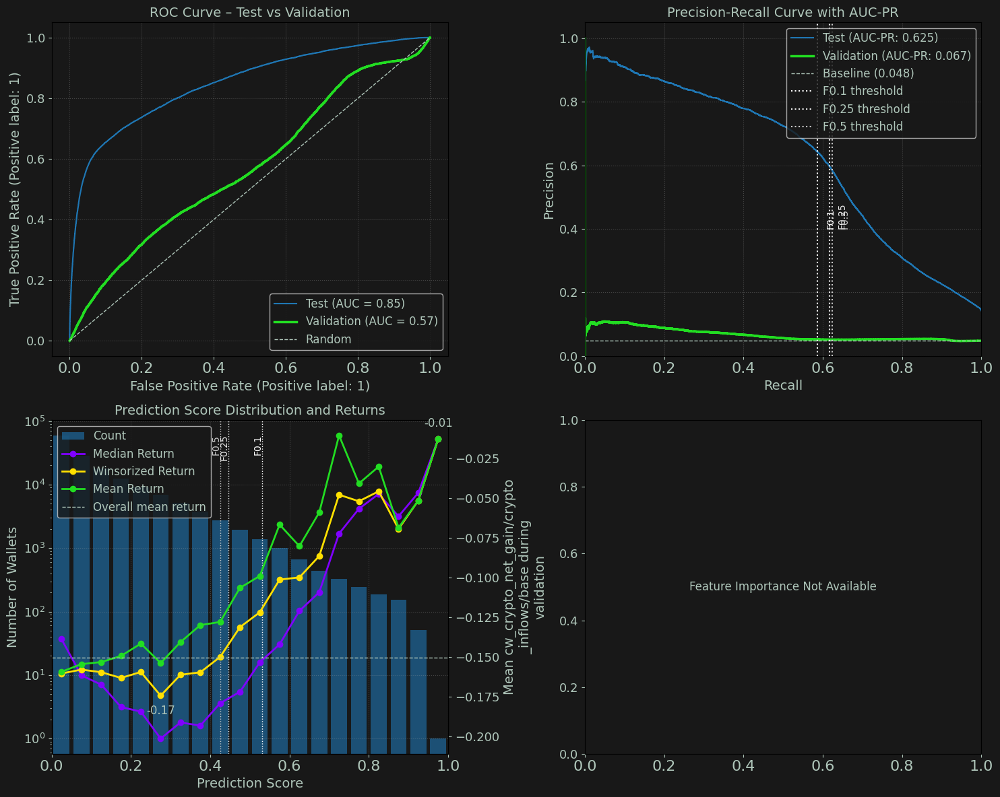

[16/Aug/25 20:31:59] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:31:59] WARNING [2879242311.<module>:6]                 60: 2024-08-03
[16/Aug/25 20:31:59] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:31:59] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh60/wscr-dda-962--sh60-0816-195846/output/model.tar.gz
Test Samples:             103,596
Val Positive Samples:     21,097 (17.8%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.384  |  0.792
Val Accuracy:               0.806  |  0.889
Val Precision:              0.062  |  0.596
Val Recall:                 0.006  |  0.437
Val F1 Score:               0.011  |  0.504

Validation Retu

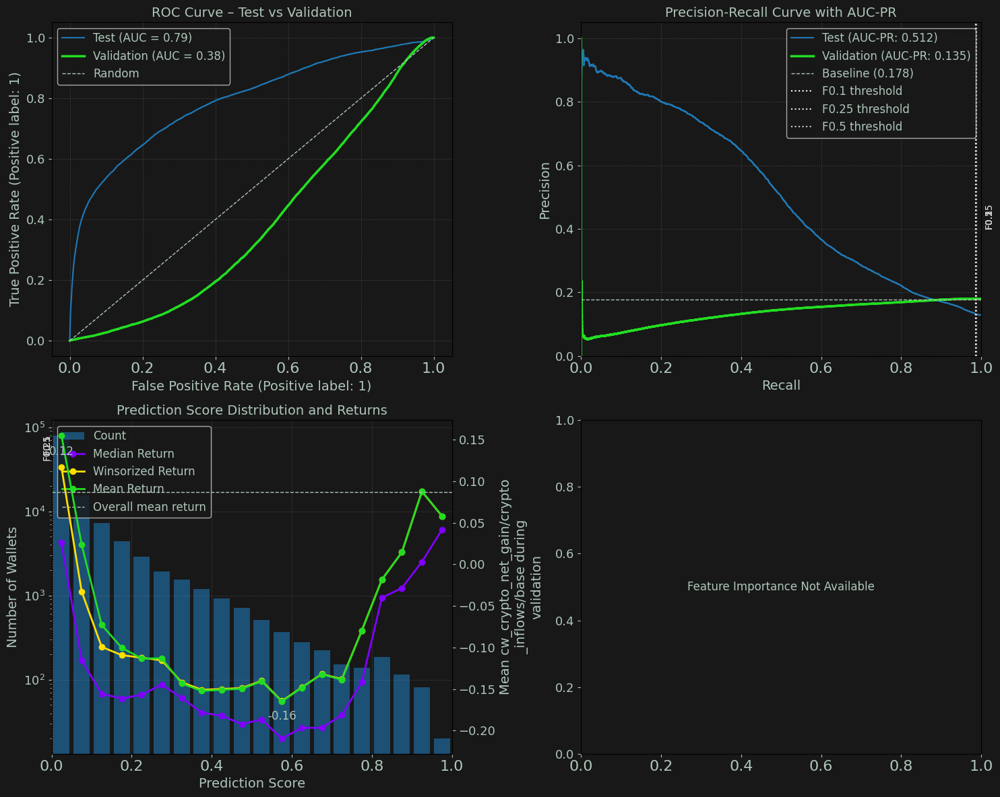

[16/Aug/25 20:32:00] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:32:00] WARNING [2879242311.<module>:6]                 120: 2024-10-02
[16/Aug/25 20:32:00] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:32:00] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh120/wscr-dda-962--sh120-0816-195846/output/model.tar.gz
Test Samples:             114,989
Val Positive Samples:     50,651 (29.2%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.633  |  0.878
Val Accuracy:               0.706  |  0.882
Val Precision:              0.458  |  0.556
Val Recall:                 0.033  |  0.743
Val F1 Score:               0.062  |  0.636

Validation R

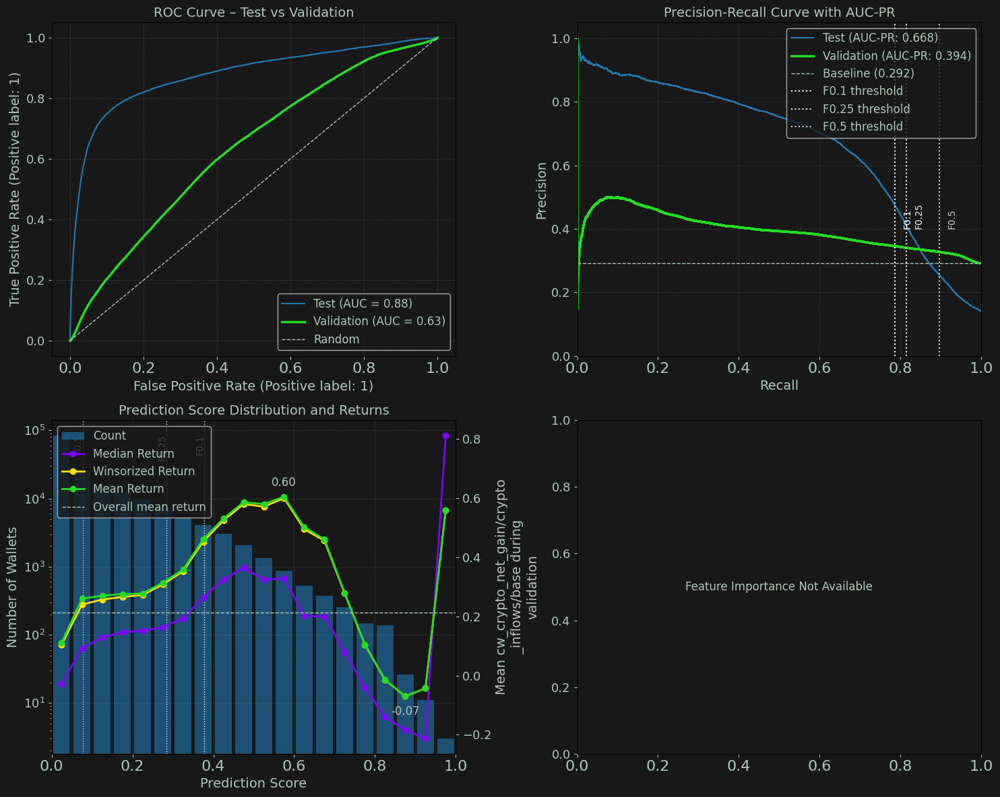

[16/Aug/25 20:32:00] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:32:00] WARNING [2879242311.<module>:6]                 180: 2024-12-01
[16/Aug/25 20:32:00] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:32:00] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh180/wscr-dda-962--sh180-0816-195846/output/model.tar.gz
Test Samples:             134,785
Val Positive Samples:     16,388 (8.1%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.506  |  0.847
Val Accuracy:               0.913  |  0.871
Val Precision:              0.092  |  0.623
Val Recall:                 0.009  |  0.639
Val F1 Score:               0.016  |  0.631

Validation Re

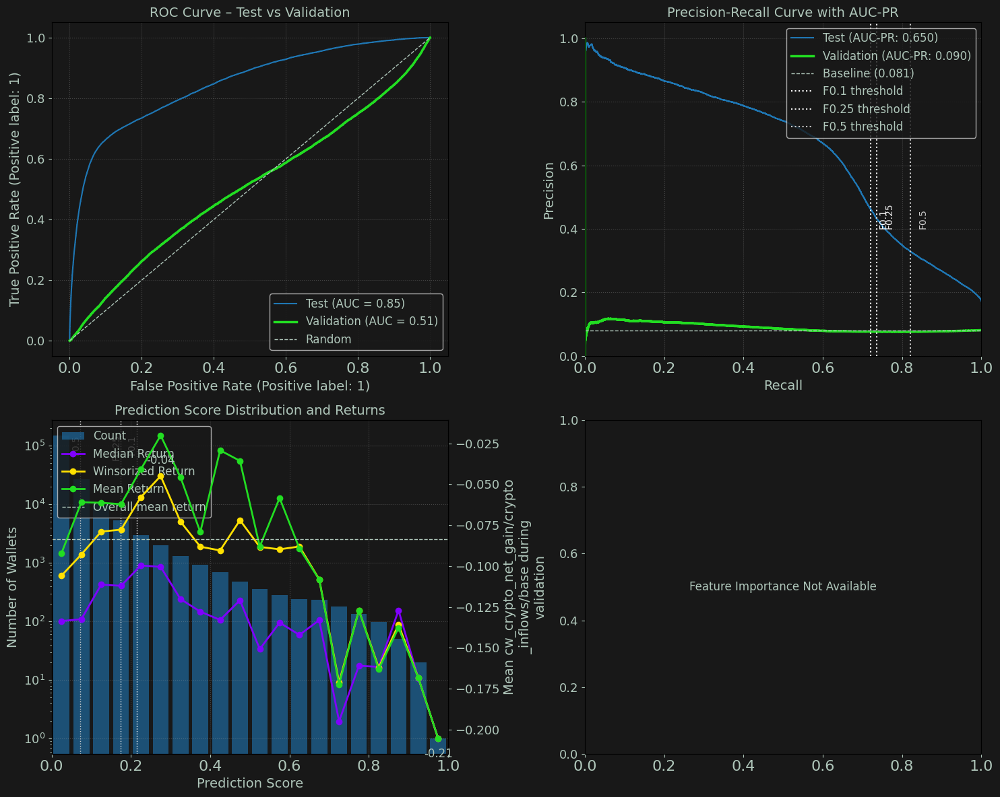

[16/Aug/25 20:32:01] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:32:01] WARNING [2879242311.<module>:6]                 240: 2025-01-30
[16/Aug/25 20:32:01] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:32:01] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh240/wscr-dda-962--sh240-0816-195846/output/model.tar.gz
Test Samples:             156,563
Val Positive Samples:     2,410 (2.0%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.531  |  0.777
Val Accuracy:               0.944  |  0.855
Val Precision:              0.017  |  0.519
Val Recall:                 0.032  |  0.366
Val F1 Score:               0.022  |  0.429

Validation Ret

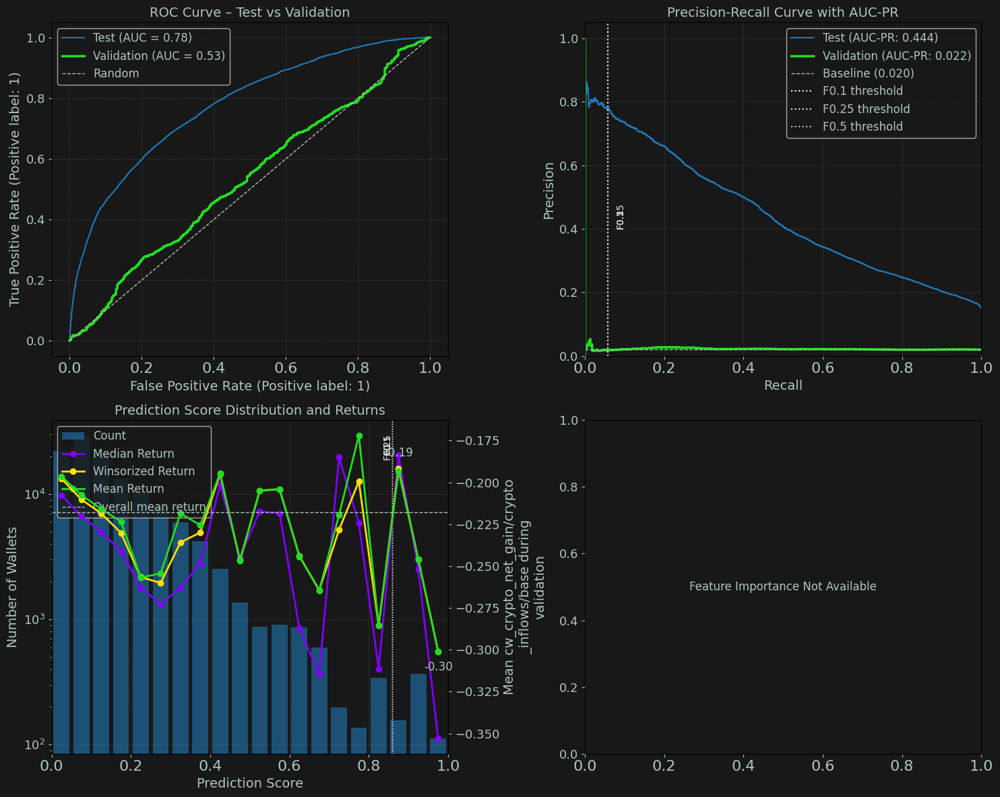

[16/Aug/25 20:32:01] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:32:01] WARNING [2879242311.<module>:6]                 300: 2025-03-31
[16/Aug/25 20:32:01] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:32:01] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh300/wscr-dda-962--sh300-0816-195846/output/model.tar.gz
Test Samples:             160,113
Val Positive Samples:     15,394 (18.7%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.489  |  0.887
Val Accuracy:               0.805  |  0.887
Val Precision:              0.148  |  0.573
Val Recall:                 0.010  |  0.758
Val F1 Score:               0.018  |  0.653

Validation R

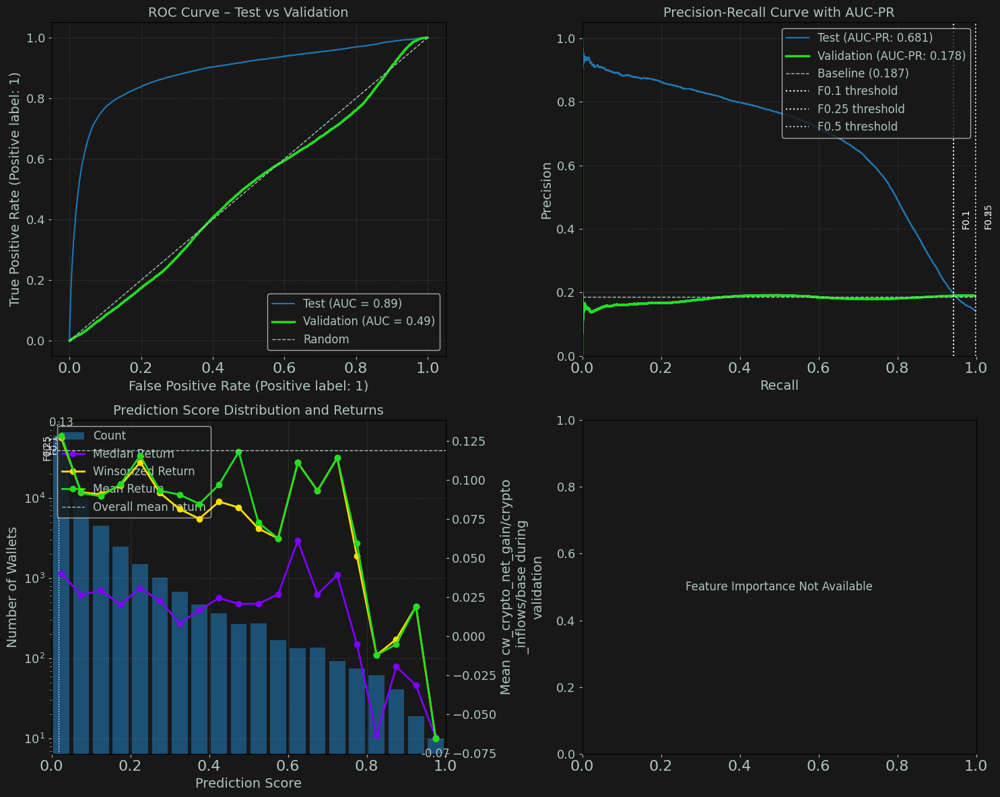

[16/Aug/25 20:32:02] INFO [2879242311.<module>:5] -------------------------------------------------
[16/Aug/25 20:32:02] WARNING [2879242311.<module>:6]                 360: 2025-05-30
[16/Aug/25 20:32:02] INFO [2879242311.<module>:7] -------------------------------------------------
[16/Aug/25 20:32:02] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh360/wscr-dda-962--sh360-0816-195846/output/model.tar.gz
Test Samples:             150,661
Val Positive Samples:     12,671 (16.2%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.634  |  0.870
Val Accuracy:               0.813  |  0.898
Val Precision:              0.261  |  0.569
Val Recall:                 0.087  |  0.615
Val F1 Score:               0.130  |  0.591

Validation R

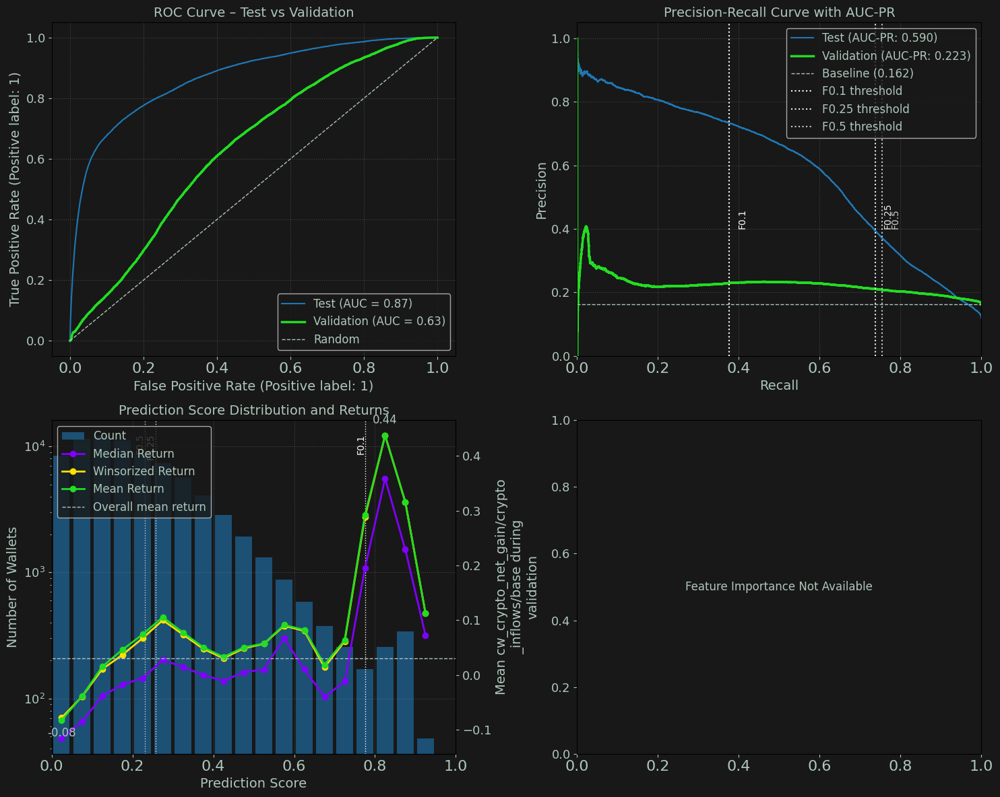

In [13]:
# 2 shift offsets
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[16/Aug/25 19:14:24] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:24] WARNING [3718830015.<module>:6]                 0: 2024-06-04
[16/Aug/25 19:14:24] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:24] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh0/wscr-dda-962--sh0-0816-184117/output/model.tar.gz
Test Samples:             42,343
Val Positive Samples:     7,314 (4.8%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.596  |  0.462
Val Accuracy:               0.943  |  0.810
Val Precision:              0.100  |  0.163
Val Recall:                 0.024  |  0.047
Val F1 Score:               0.039  |  0.073

Validation Returns   

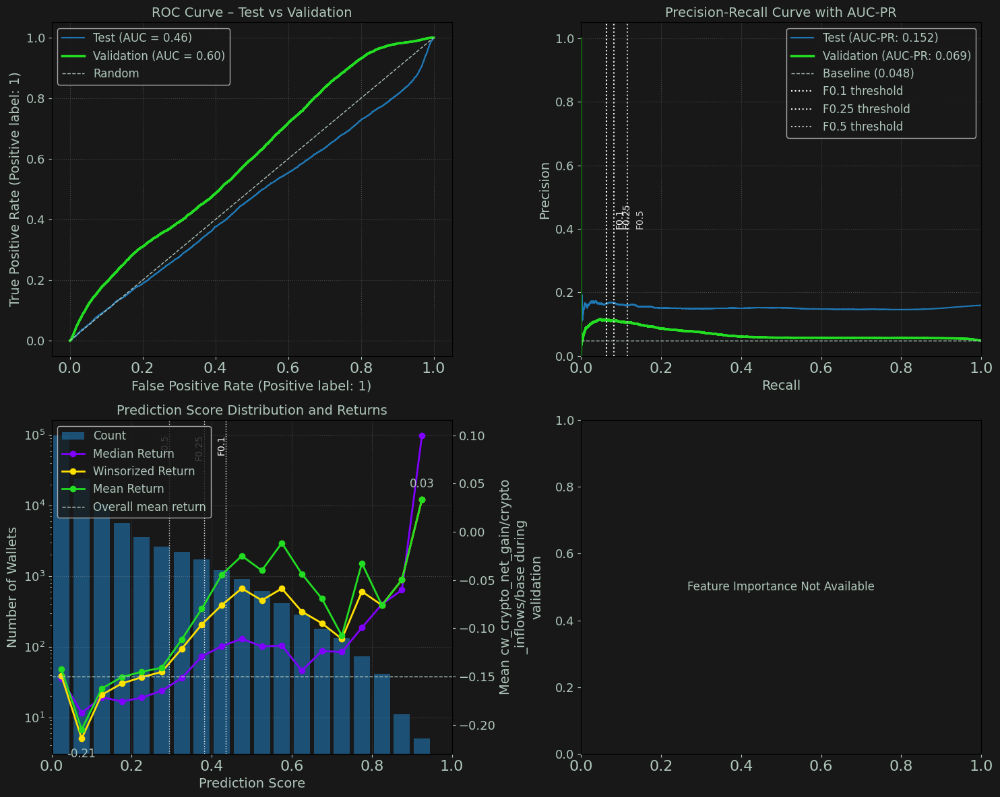

[16/Aug/25 19:14:24] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:24] WARNING [3718830015.<module>:6]                 60: 2024-08-03
[16/Aug/25 19:14:24] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:24] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh60/wscr-dda-962--sh60-0816-184117/output/model.tar.gz
Test Samples:             50,566
Val Positive Samples:     21,097 (17.8%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.498  |  0.494
Val Accuracy:               0.817  |  0.849
Val Precision:              0.120  |  0.185
Val Recall:                 0.004  |  0.034
Val F1 Score:               0.007  |  0.058

Validation Retur

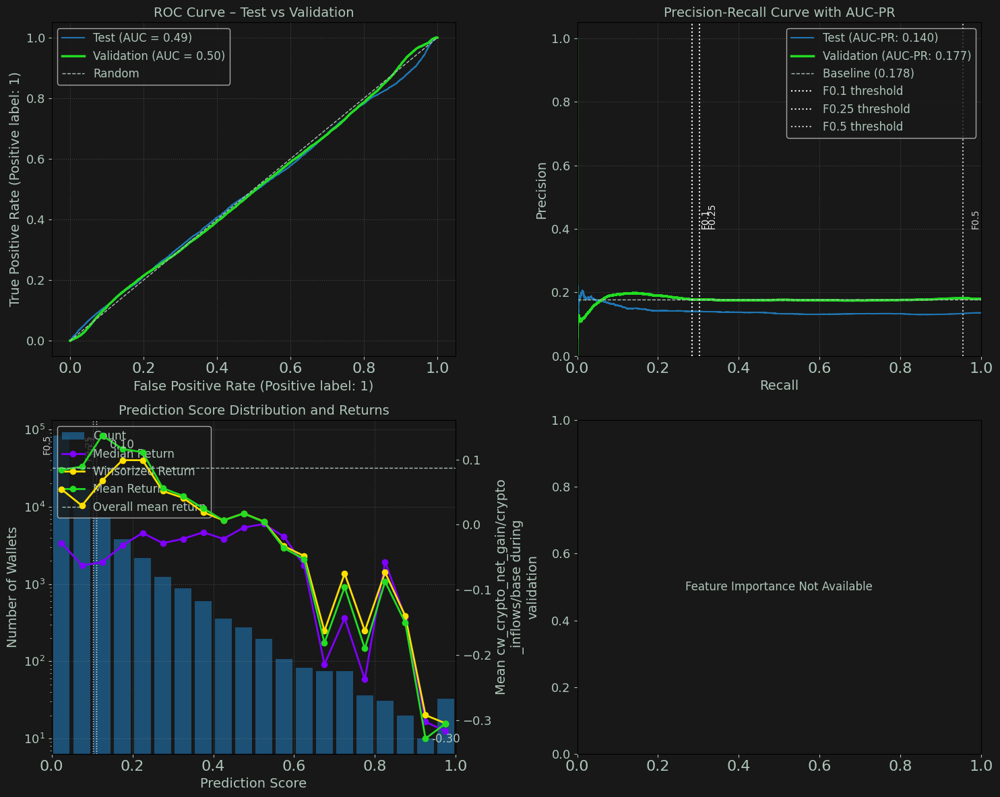

[16/Aug/25 19:14:25] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:25] WARNING [3718830015.<module>:6]                 120: 2024-10-02
[16/Aug/25 19:14:25] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:25] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh120/wscr-dda-962--sh120-0816-184117/output/model.tar.gz
Test Samples:             56,303
Val Positive Samples:     50,651 (29.2%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.580  |  0.492
Val Accuracy:               0.705  |  0.857
Val Precision:              0.488  |  0.122
Val Recall:                 0.199  |  0.029
Val F1 Score:               0.283  |  0.047

Validation Re

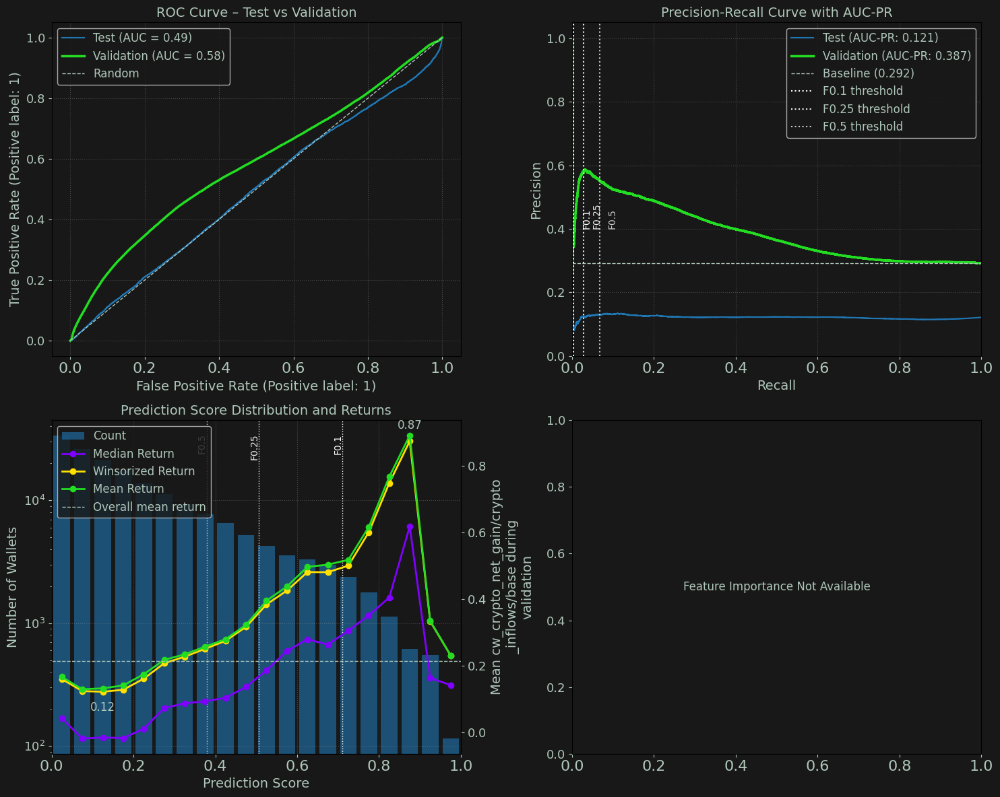

[16/Aug/25 19:14:25] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:25] WARNING [3718830015.<module>:6]                 180: 2024-12-01
[16/Aug/25 19:14:25] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:25] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh180/wscr-dda-962--sh180-0816-184117/output/model.tar.gz
Test Samples:             64,083
Val Positive Samples:     16,388 (8.1%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.542  |  0.417
Val Accuracy:               0.830  |  0.851
Val Precision:              0.097  |  0.087
Val Recall:                 0.131  |  0.019
Val F1 Score:               0.111  |  0.031

Validation Ret

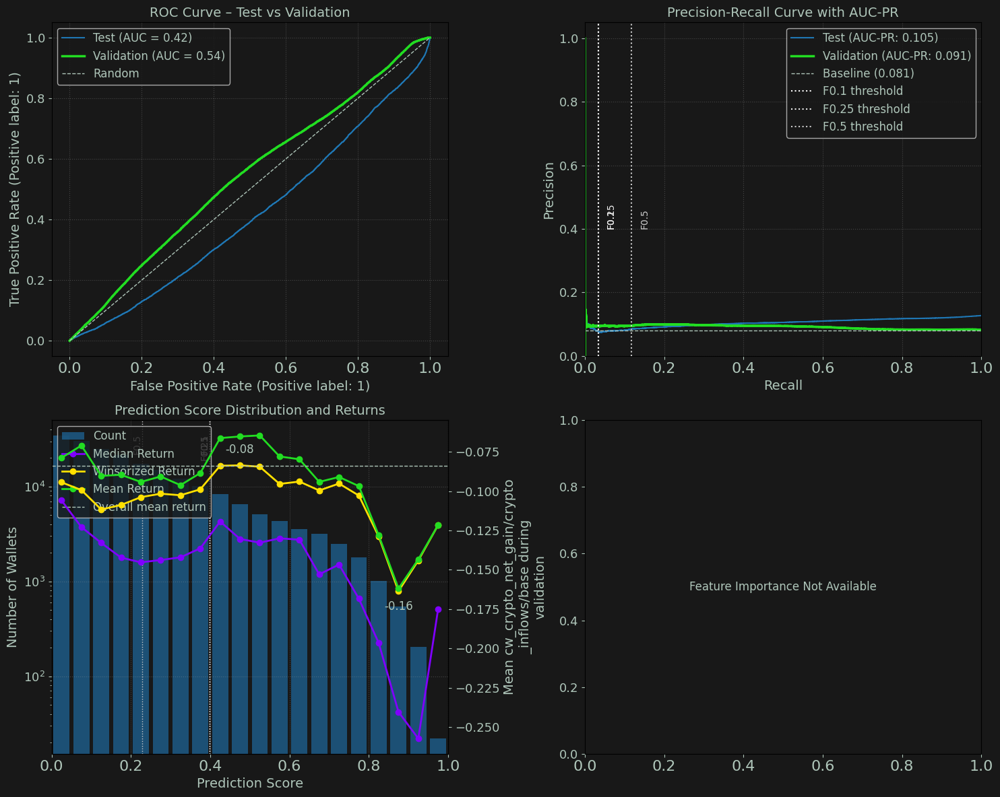

[16/Aug/25 19:14:26] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:26] WARNING [3718830015.<module>:6]                 240: 2025-01-30
[16/Aug/25 19:14:26] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:26] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh240/wscr-dda-962--sh240-0816-184117/output/model.tar.gz
Test Samples:             75,587
Val Positive Samples:     2,410 (2.0%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.526  |  0.490
Val Accuracy:               0.941  |  0.866
Val Precision:              0.028  |  0.112
Val Recall:                 0.058  |  0.029
Val F1 Score:               0.037  |  0.046

Validation Retu

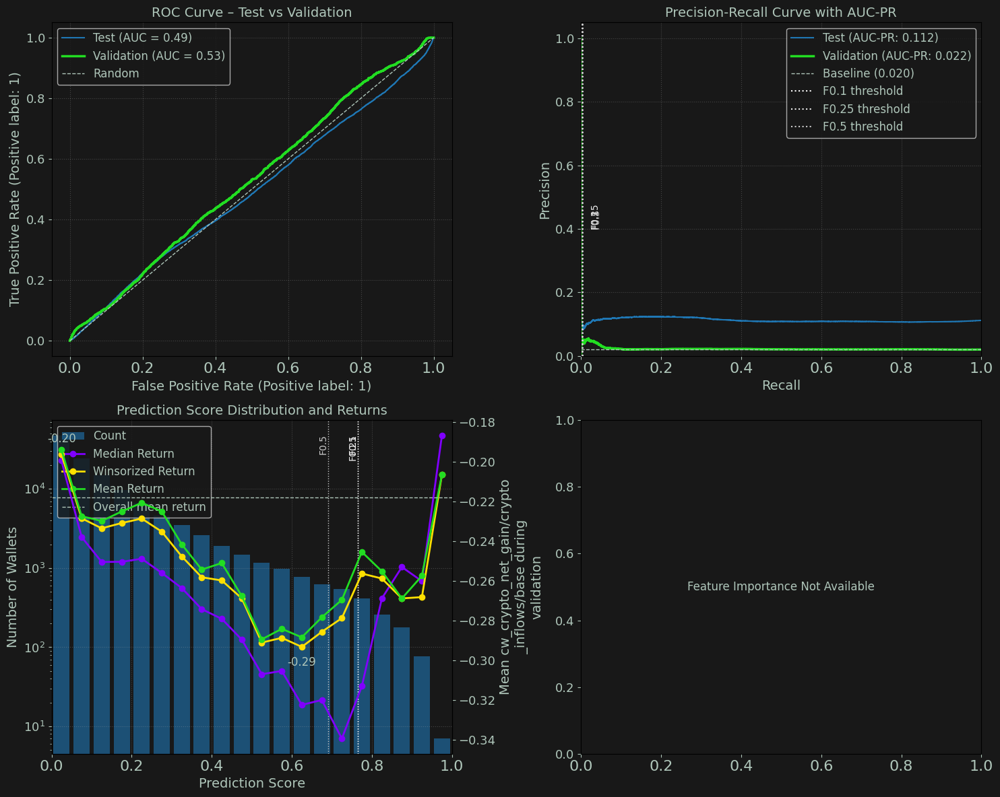

[16/Aug/25 19:14:26] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:26] WARNING [3718830015.<module>:6]                 300: 2025-03-31
[16/Aug/25 19:14:26] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:26] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh300/wscr-dda-962--sh300-0816-184117/output/model.tar.gz
Test Samples:             78,980
Val Positive Samples:     15,394 (18.7%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.530  |  0.488
Val Accuracy:               0.809  |  0.833
Val Precision:              0.263  |  0.100
Val Recall:                 0.014  |  0.087
Val F1 Score:               0.027  |  0.093

Validation Re

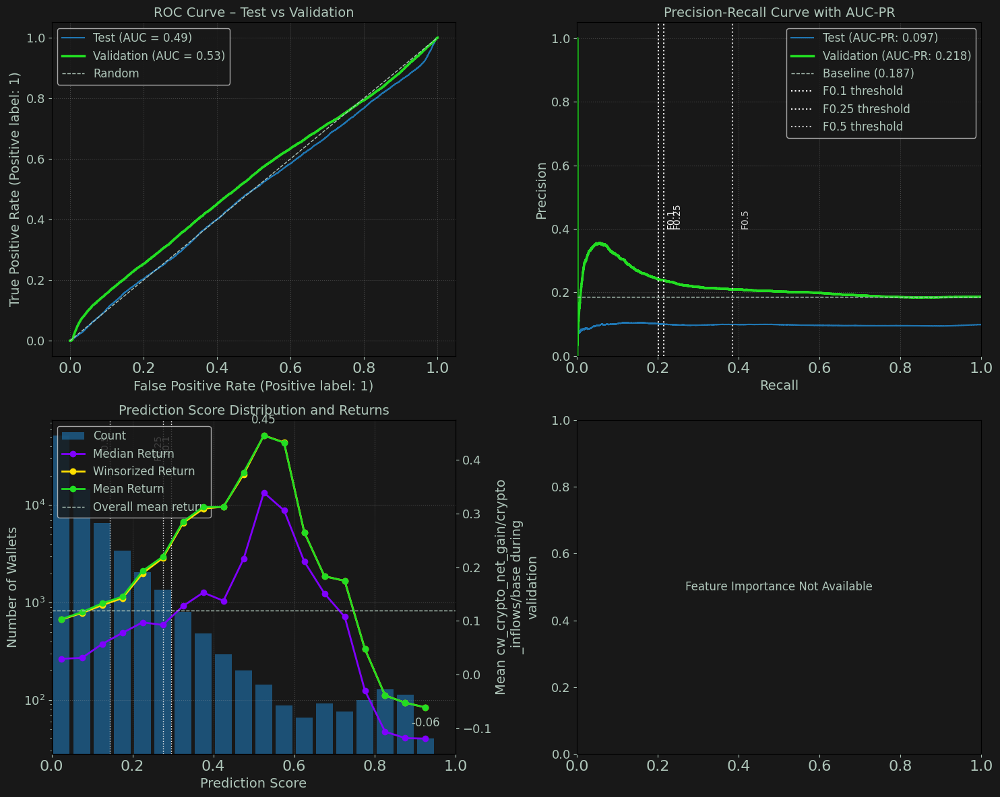

[16/Aug/25 19:14:26] INFO [3718830015.<module>:5] -------------------------------------------------
[16/Aug/25 19:14:26] WARNING [3718830015.<module>:6]                 360: 2025-05-30
[16/Aug/25 19:14:26] INFO [3718830015.<module>:7] -------------------------------------------------
[16/Aug/25 19:14:26] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-962-evals/sh360/wscr-dda-962--sh360-0816-184117/output/model.tar.gz
Test Samples:             76,048
Val Positive Samples:     12,671 (16.2%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.637  |  0.627
Val Accuracy:               0.837  |  0.867
Val Precision:              0.329  |  0.124
Val Recall:                 0.008  |  0.178
Val F1 Score:               0.015  |  0.146

Validation Re

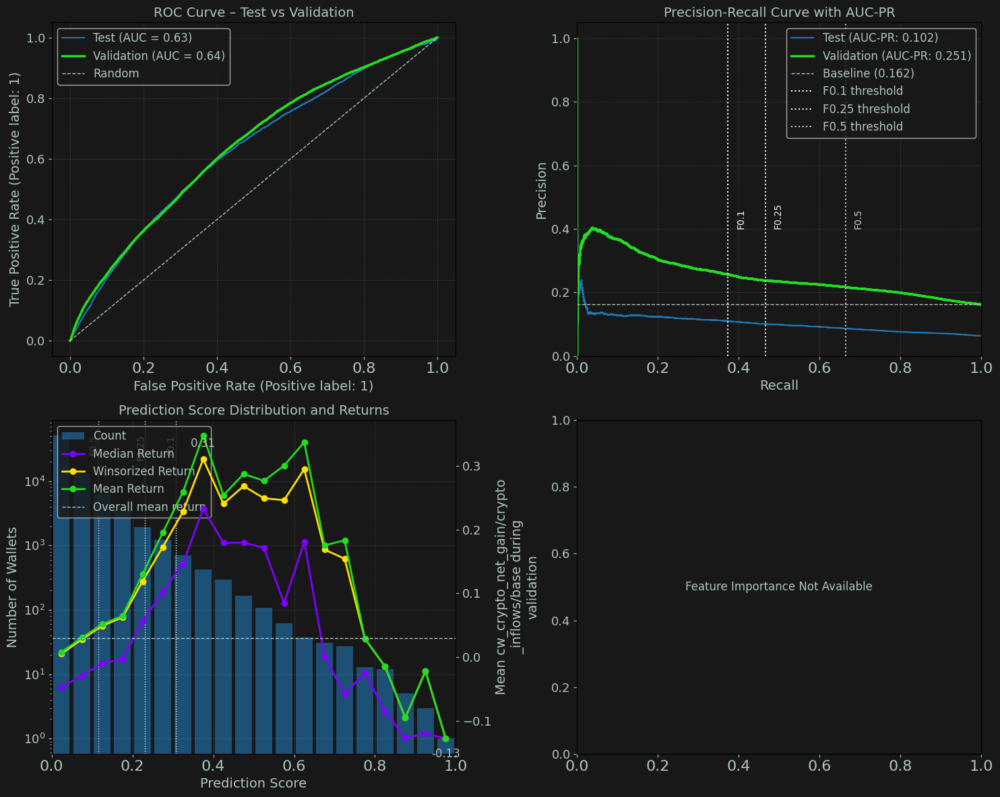

In [64]:
# rebuild
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[16/Aug/25 18:23:04] INFO [677722935.<module>:5] -------------------------------------------------
[16/Aug/25 18:23:04] WARNING [677722935.<module>:6]                 360: 2025-05-30
[16/Aug/25 18:23:04] INFO [677722935.<module>:7] -------------------------------------------------
[16/Aug/25 18:23:04] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v5-dev/sh360/wscr-dda-956--sh360-0816-181259/output/model.tar.gz
Test Samples:             4,748
Val Positive Samples:     249 (17.2%)
Number of Features:       288

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.504  |  0.676
Val Accuracy:               0.811  |  0.808
Val Precision:              0.147  |  0.116
Val Recall:                 0.020  |  0.316
Val F1 Score:               0.035  |  0.170

Validation

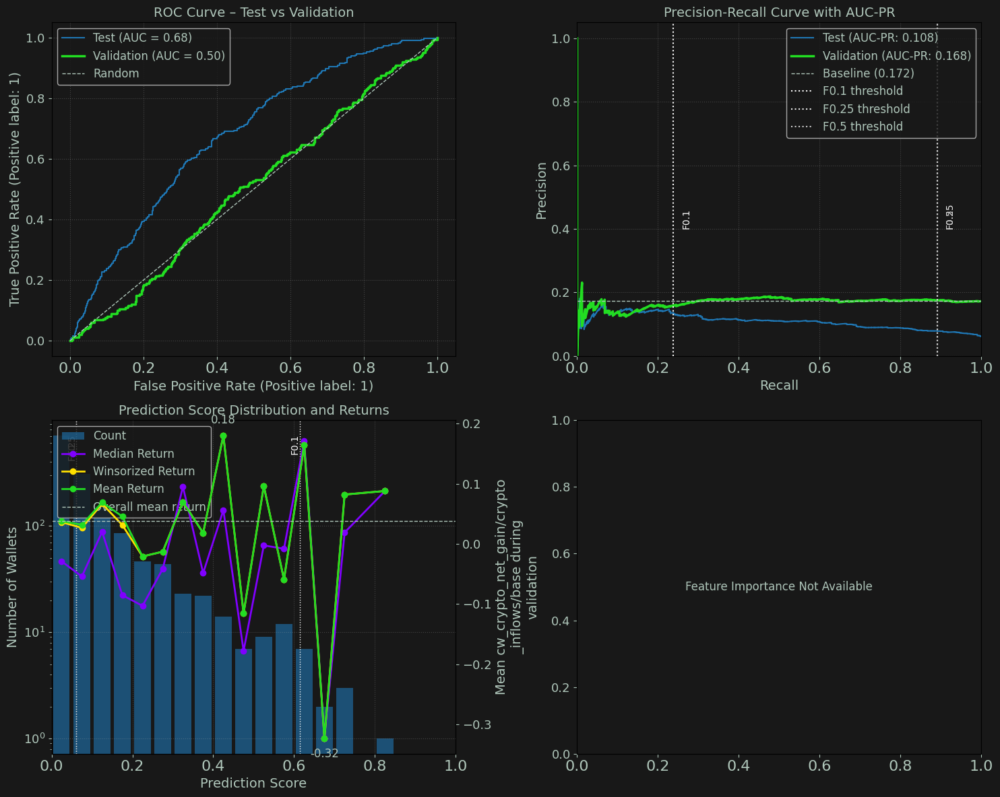

In [46]:
# 3 macro feats
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[15/Aug/25 23:33:26] INFO [199982287.<module>:5] -------------------------------------------------
[15/Aug/25 23:33:26] WARNING [199982287.<module>:6]                 0: 2024-05-05
[15/Aug/25 23:33:26] INFO [199982287.<module>:7] -------------------------------------------------
[15/Aug/25 23:33:26] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh0/wscr-dda-956--sh0-0815-230510/output/model.tar.gz
Test Samples:             74,100
Val Positive Samples:     1,580 (2.2%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.574  |  0.785
Val Accuracy:               0.974  |  0.859
Val Precision:              0.049  |  0.549
Val Recall:                 0.009  |  0.498
Val F1 Score:               0.015  |  0.522

Validation Returns

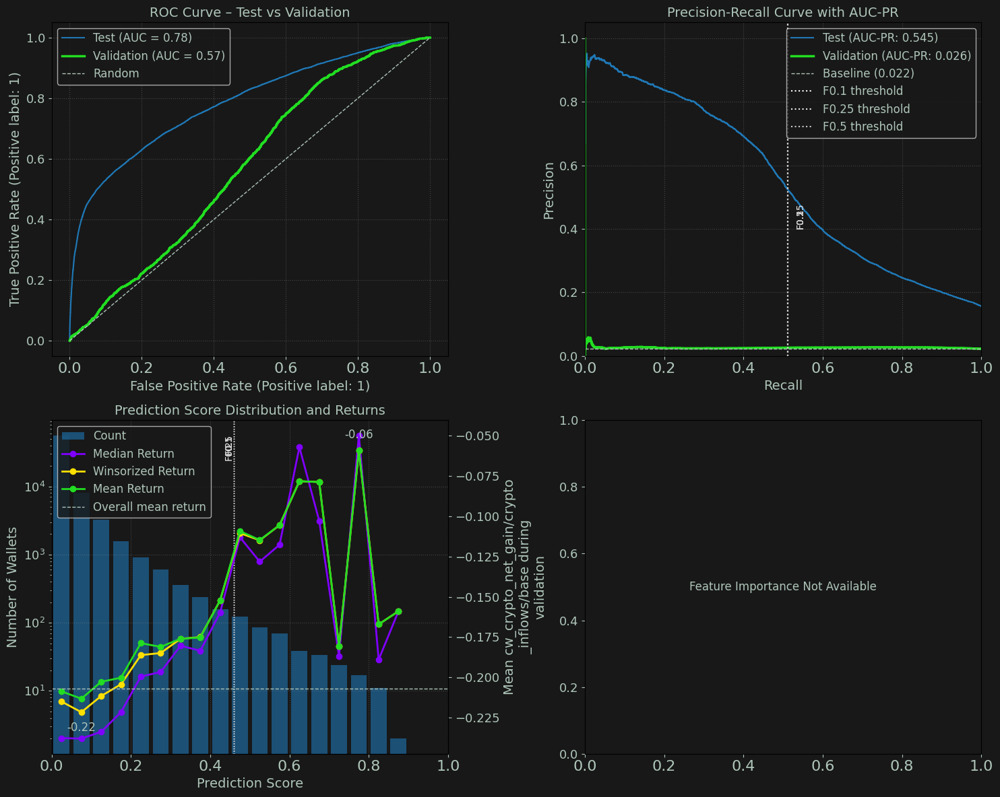

[15/Aug/25 23:33:26] INFO [199982287.<module>:5] -------------------------------------------------
[15/Aug/25 23:33:26] WARNING [199982287.<module>:6]                 60: 2024-07-04
[15/Aug/25 23:33:26] INFO [199982287.<module>:7] -------------------------------------------------
[15/Aug/25 23:33:26] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh60/wscr-dda-956--sh60-0815-230510/output/model.tar.gz
Test Samples:             91,475
Val Positive Samples:     6,211 (5.4%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.563  |  0.792
Val Accuracy:               0.940  |  0.860
Val Precision:              0.021  |  0.464
Val Recall:                 0.003  |  0.501
Val F1 Score:               0.005  |  0.482

Validation Retu

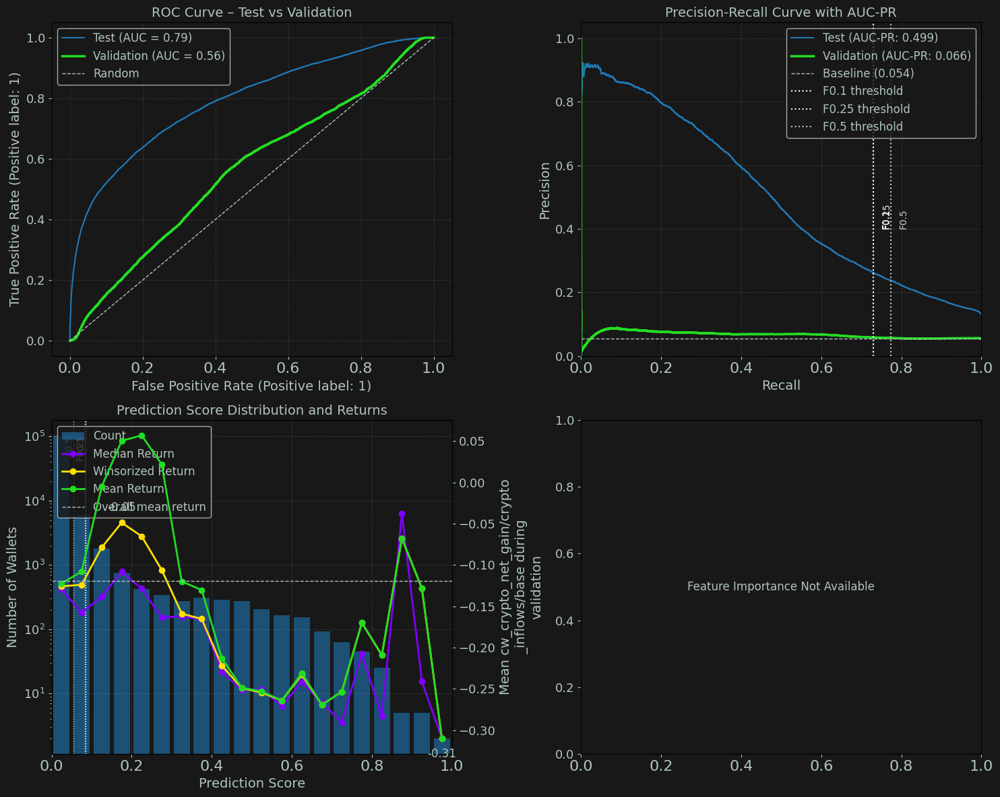

[15/Aug/25 23:33:27] INFO [199982287.<module>:5] -------------------------------------------------
[15/Aug/25 23:33:27] WARNING [199982287.<module>:6]                 120: 2024-09-02
[15/Aug/25 23:33:27] INFO [199982287.<module>:7] -------------------------------------------------
[15/Aug/25 23:33:27] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh120/wscr-dda-956--sh120-0815-230510/output/model.tar.gz
Test Samples:             101,890
Val Positive Samples:     24,815 (21.7%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.510  |  0.804
Val Accuracy:               0.780  |  0.880
Val Precision:              0.272  |  0.512
Val Recall:                 0.009  |  0.492
Val F1 Score:               0.017  |  0.502

Validatio

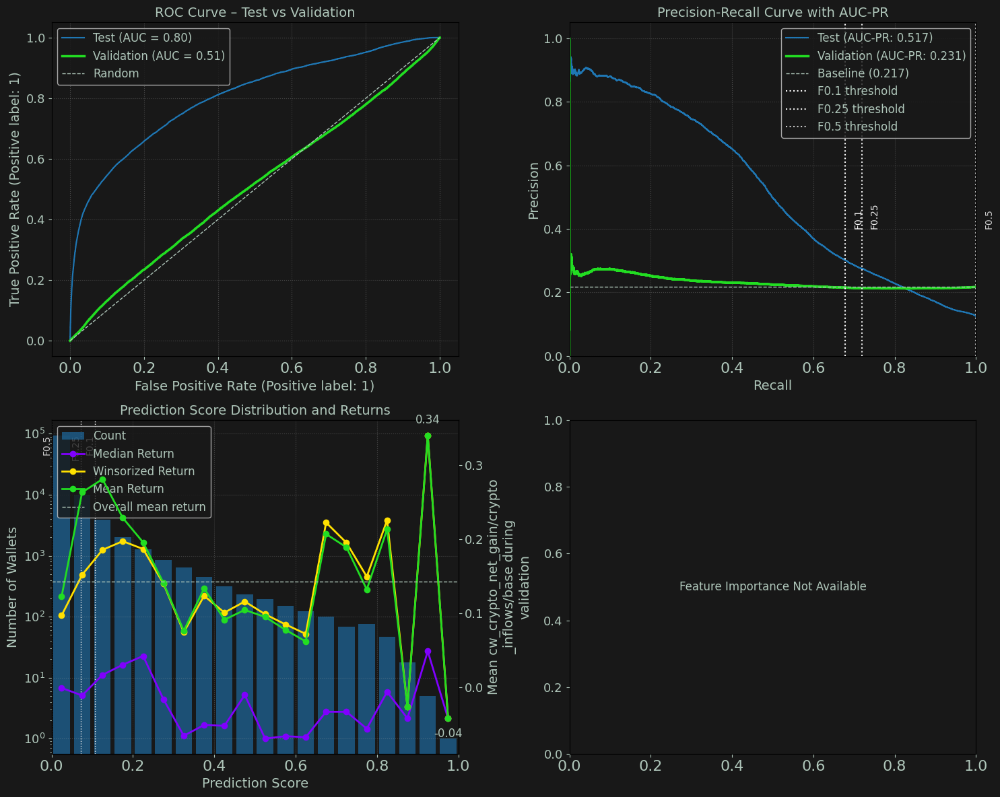

[15/Aug/25 23:33:27] INFO [199982287.<module>:5] -------------------------------------------------
[15/Aug/25 23:33:27] WARNING [199982287.<module>:6]                 180: 2024-11-01
[15/Aug/25 23:33:27] INFO [199982287.<module>:7] -------------------------------------------------
[15/Aug/25 23:33:27] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh180/wscr-dda-956--sh180-0815-230510/output/model.tar.gz
Test Samples:             113,643
Val Positive Samples:     44,466 (24.9%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.459  |  0.779
Val Accuracy:               0.725  |  0.876
Val Precision:              0.090  |  0.570
Val Recall:                 0.011  |  0.448
Val F1 Score:               0.020  |  0.501

Validatio

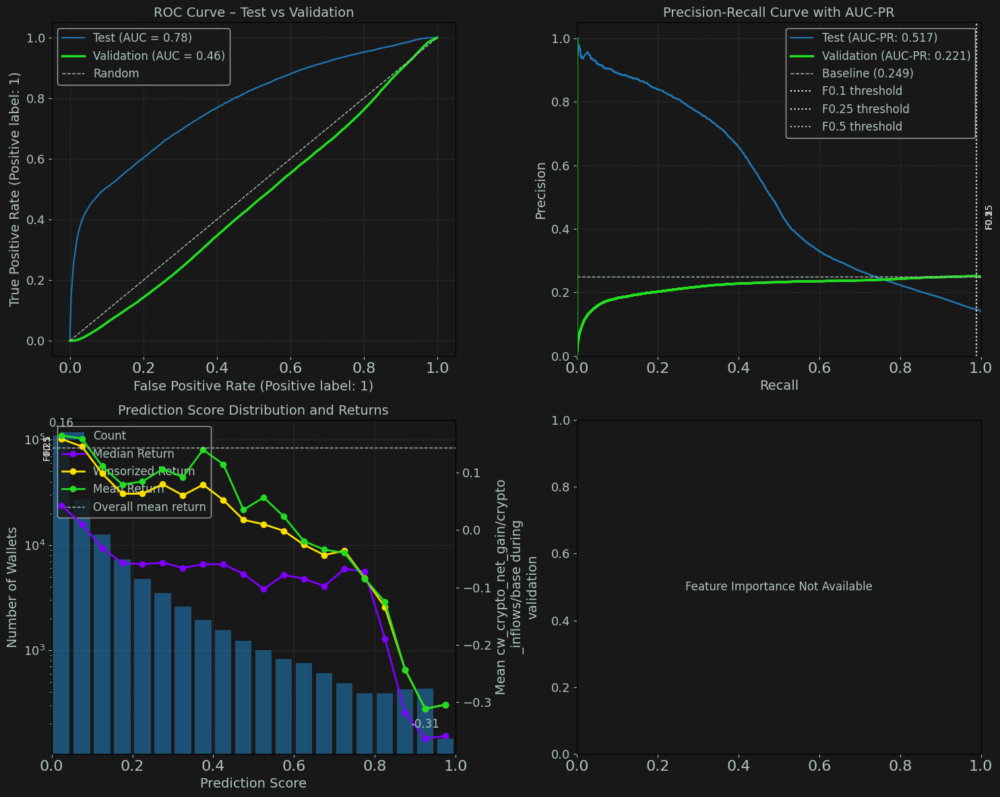

[15/Aug/25 23:33:28] INFO [199982287.<module>:5] -------------------------------------------------
[15/Aug/25 23:33:28] WARNING [199982287.<module>:6]                 240: 2024-12-31
[15/Aug/25 23:33:28] INFO [199982287.<module>:7] -------------------------------------------------
[15/Aug/25 23:33:28] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh240/wscr-dda-956--sh240-0815-230510/output/model.tar.gz
Test Samples:             135,063
Val Positive Samples:     7,925 (5.0%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.584  |  0.742
Val Accuracy:               0.904  |  0.852
Val Precision:              0.104  |  0.578
Val Recall:                 0.120  |  0.366
Val F1 Score:               0.112  |  0.448

Validation 

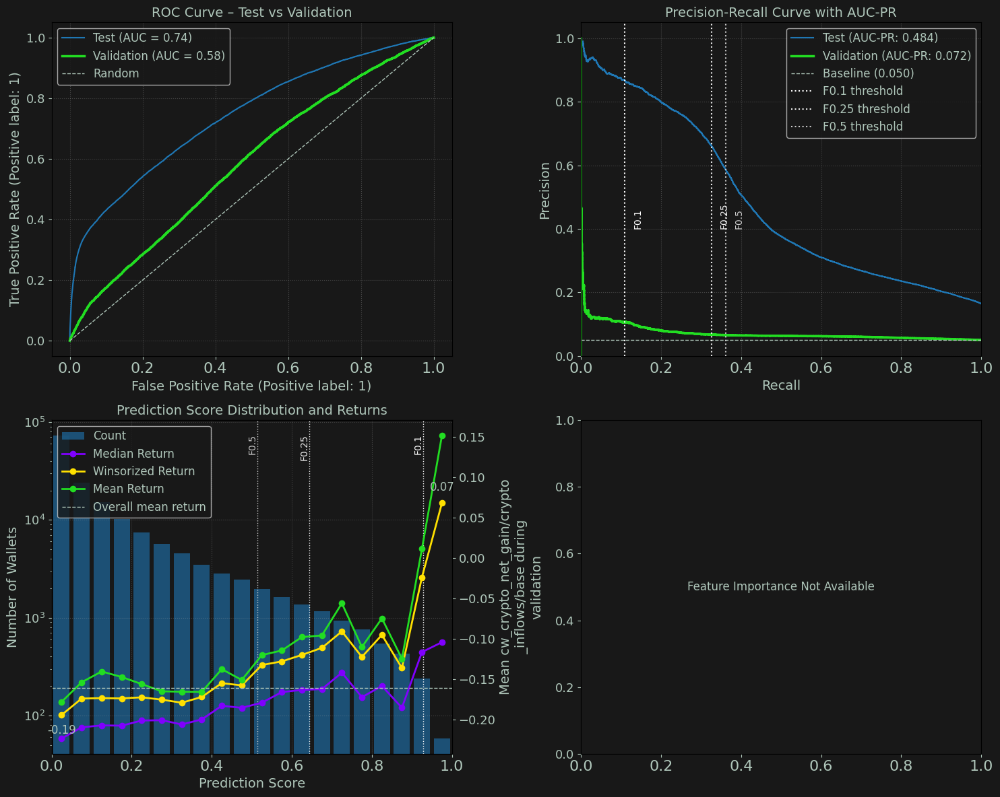

[15/Aug/25 23:33:28] INFO [199982287.<module>:5] -------------------------------------------------
[15/Aug/25 23:33:28] WARNING [199982287.<module>:6]                 300: 2025-03-01
[15/Aug/25 23:33:28] INFO [199982287.<module>:7] -------------------------------------------------
[15/Aug/25 23:33:28] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh300/wscr-dda-956--sh300-0815-230510/output/model.tar.gz
Test Samples:             151,100
Val Positive Samples:     5,957 (8.3%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.542  |  0.722
Val Accuracy:               0.915  |  0.874
Val Precision:              0.328  |  0.588
Val Recall:                 0.018  |  0.333
Val F1 Score:               0.034  |  0.425

Validation 

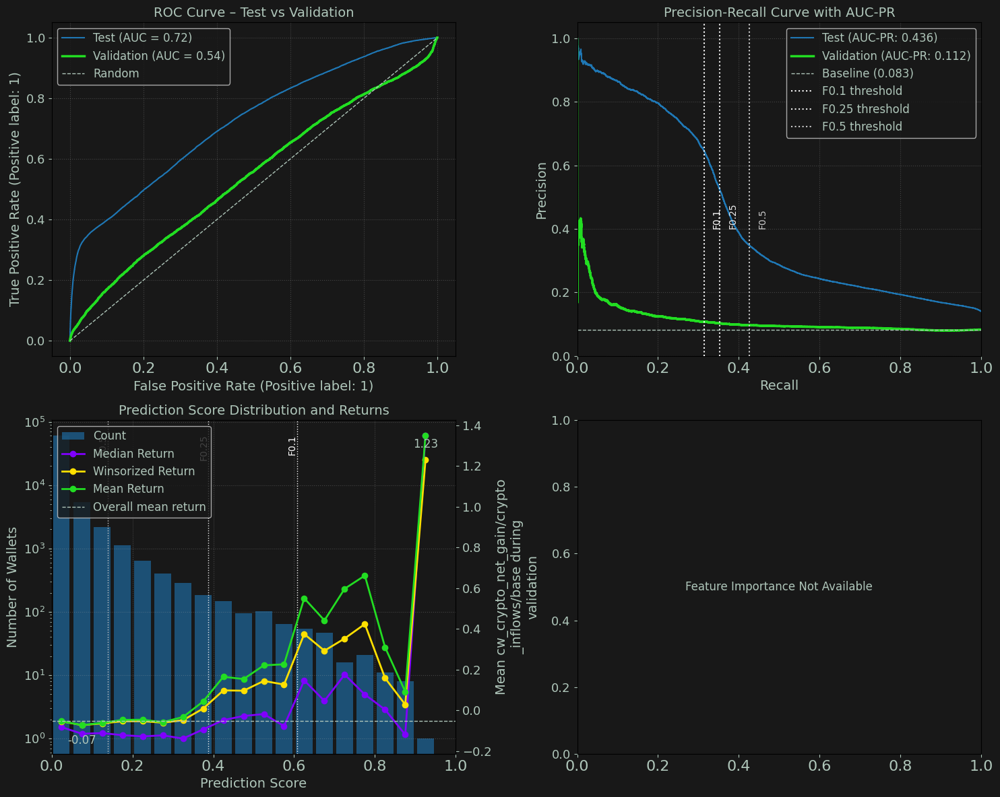

In [ ]:
# no macro
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[15/Aug/25 23:05:00] INFO [1817222424.<module>:5] -------------------------------------------------
[15/Aug/25 23:05:00] WARNING [1817222424.<module>:6]                 0: 2024-05-05
[15/Aug/25 23:05:00] INFO [1817222424.<module>:7] -------------------------------------------------
[15/Aug/25 23:05:00] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh0/wscr-dda-956--sh0-0815-214225/output/model.tar.gz
Test Samples:             74,100
Val Positive Samples:     1,580 (2.2%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.472  |  0.805
Val Accuracy:               0.959  |  0.860
Val Precision:              0.004  |  0.552
Val Recall:                 0.003  |  0.514
Val F1 Score:               0.003  |  0.533

Validation Retu

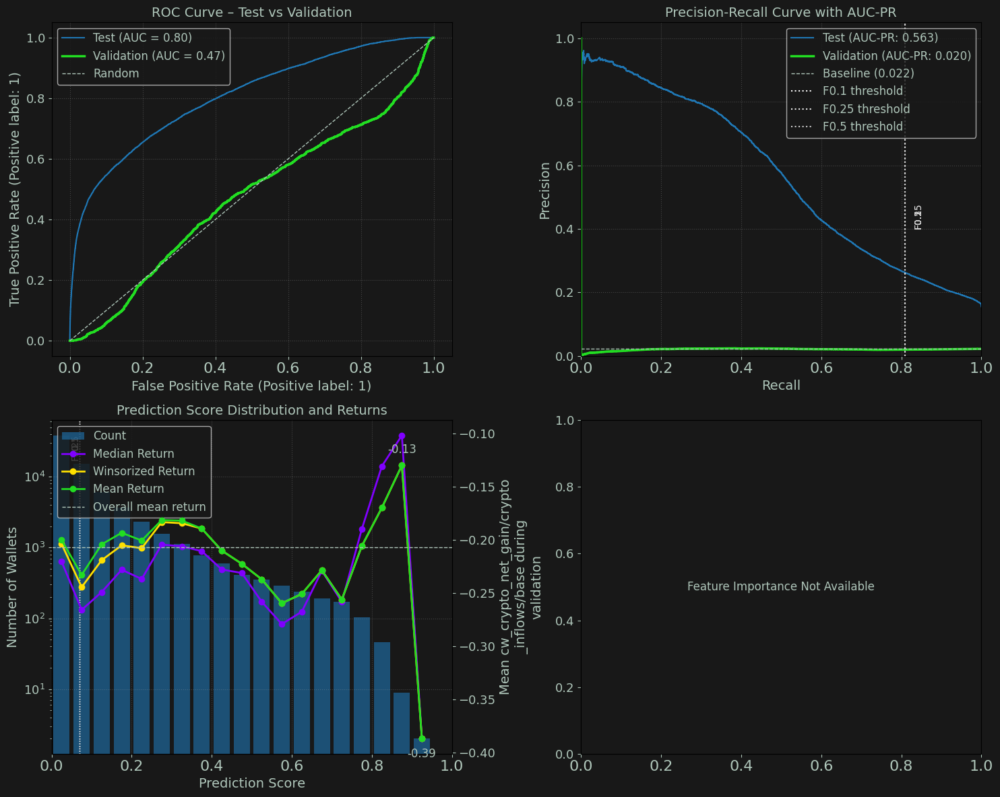

[15/Aug/25 23:05:01] INFO [1817222424.<module>:5] -------------------------------------------------
[15/Aug/25 23:05:01] WARNING [1817222424.<module>:6]                 60: 2024-07-04
[15/Aug/25 23:05:01] INFO [1817222424.<module>:7] -------------------------------------------------
[15/Aug/25 23:05:01] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh60/wscr-dda-956--sh60-0815-214225/output/model.tar.gz
Test Samples:             91,475
Val Positive Samples:     6,211 (5.4%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.567  |  0.827
Val Accuracy:               0.936  |  0.883
Val Precision:              0.024  |  0.552
Val Recall:                 0.005  |  0.520
Val F1 Score:               0.008  |  0.536

Validation R

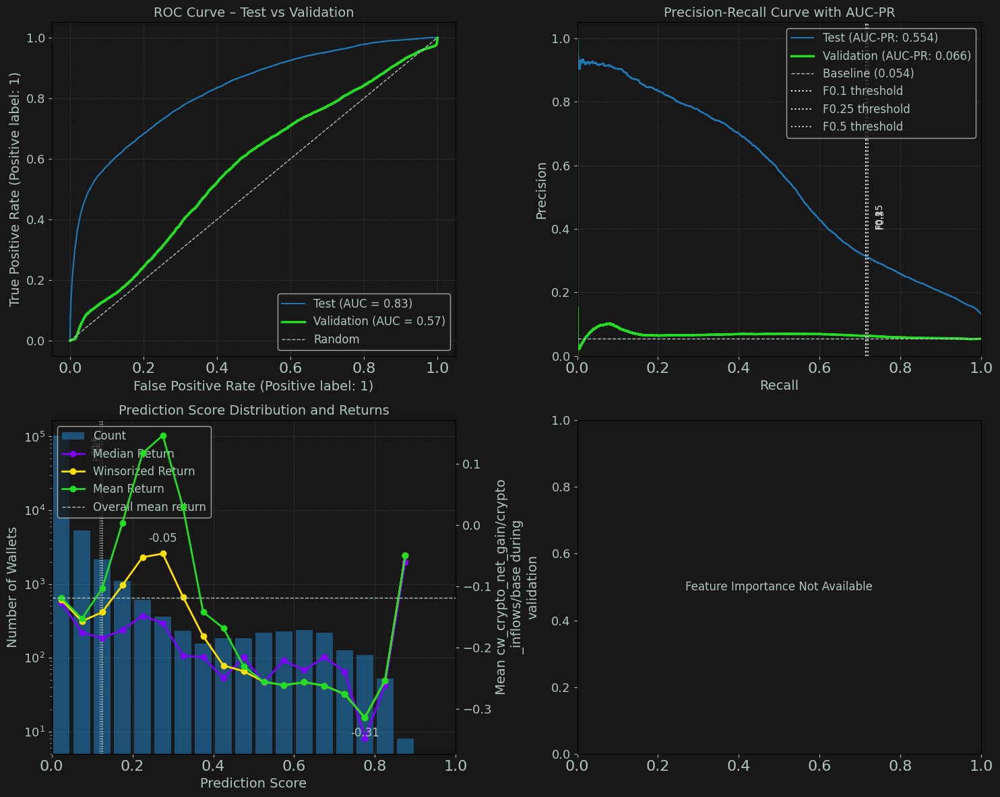

[15/Aug/25 23:05:01] INFO [1817222424.<module>:5] -------------------------------------------------
[15/Aug/25 23:05:01] WARNING [1817222424.<module>:6]                 120: 2024-09-02
[15/Aug/25 23:05:01] INFO [1817222424.<module>:7] -------------------------------------------------
[15/Aug/25 23:05:01] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh120/wscr-dda-956--sh120-0815-214225/output/model.tar.gz
Test Samples:             101,890
Val Positive Samples:     24,815 (21.7%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.539  |  0.787
Val Accuracy:               0.780  |  0.884
Val Precision:              0.138  |  0.531
Val Recall:                 0.002  |  0.474
Val F1 Score:               0.005  |  0.501

Valida

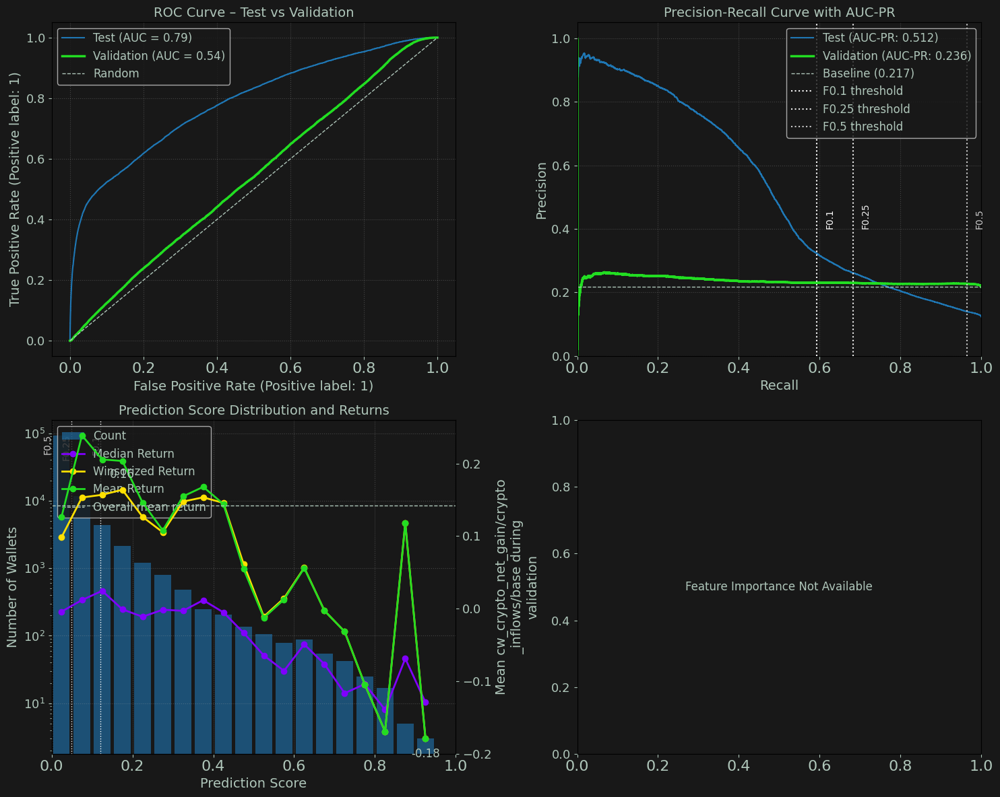

[15/Aug/25 23:05:02] INFO [1817222424.<module>:5] -------------------------------------------------
[15/Aug/25 23:05:02] WARNING [1817222424.<module>:6]                 180: 2024-11-01
[15/Aug/25 23:05:02] INFO [1817222424.<module>:7] -------------------------------------------------
[15/Aug/25 23:05:02] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh180/wscr-dda-956--sh180-0815-214225/output/model.tar.gz
Test Samples:             113,643
Val Positive Samples:     44,466 (24.9%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.543  |  0.779
Val Accuracy:               0.743  |  0.860
Val Precision:              0.231  |  0.496
Val Recall:                 0.013  |  0.445
Val F1 Score:               0.024  |  0.469

Valida

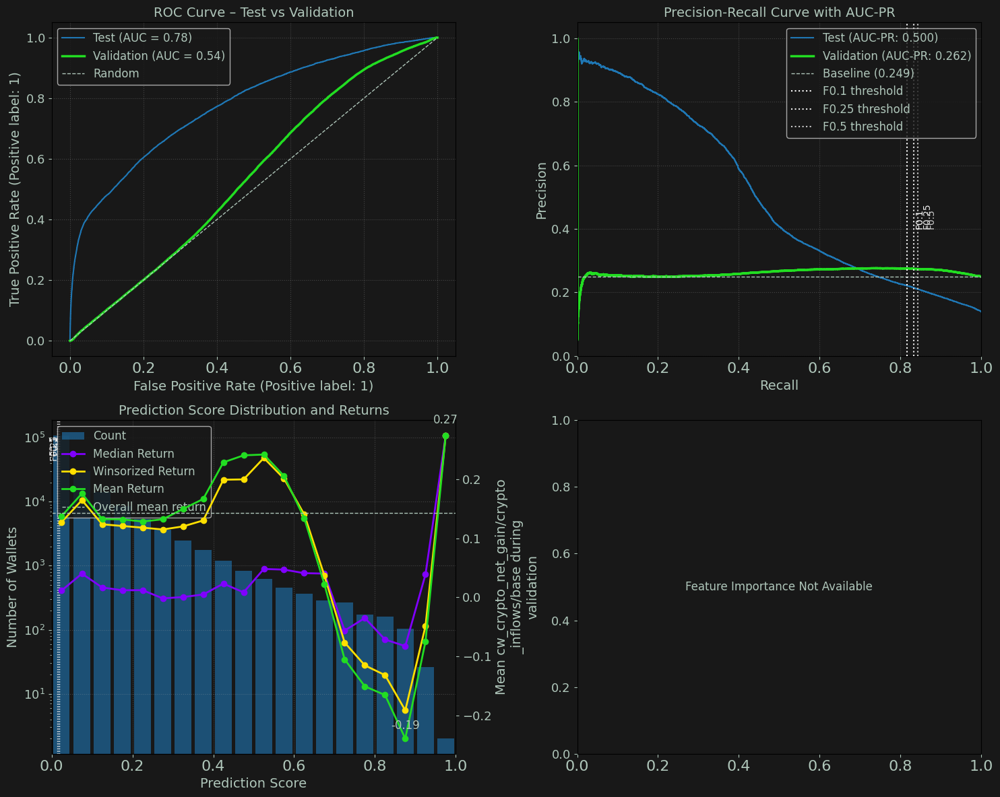

[15/Aug/25 23:05:02] INFO [1817222424.<module>:5] -------------------------------------------------
[15/Aug/25 23:05:02] WARNING [1817222424.<module>:6]                 240: 2024-12-31
[15/Aug/25 23:05:02] INFO [1817222424.<module>:7] -------------------------------------------------
[15/Aug/25 23:05:02] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh240/wscr-dda-956--sh240-0815-214225/output/model.tar.gz
Test Samples:             135,063
Val Positive Samples:     7,925 (5.0%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.572  |  0.752
Val Accuracy:               0.934  |  0.854
Val Precision:              0.144  |  0.584
Val Recall:                 0.063  |  0.380
Val F1 Score:               0.088  |  0.460

Validati

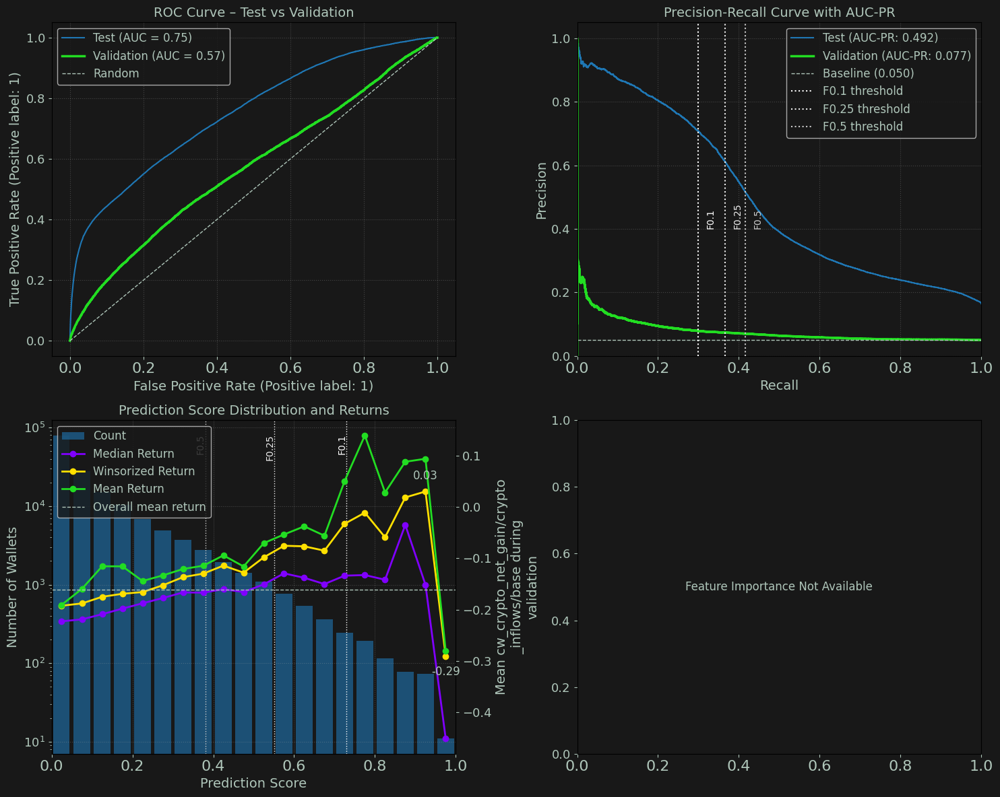

[15/Aug/25 23:05:03] INFO [1817222424.<module>:5] -------------------------------------------------
[15/Aug/25 23:05:03] WARNING [1817222424.<module>:6]                 300: 2025-03-01
[15/Aug/25 23:05:03] INFO [1817222424.<module>:7] -------------------------------------------------
[15/Aug/25 23:05:03] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh300/wscr-dda-956--sh300-0815-214225/output/model.tar.gz
Test Samples:             151,100
Val Positive Samples:     5,957 (8.3%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.661  |  0.727
Val Accuracy:               0.903  |  0.876
Val Precision:              0.204  |  0.604
Val Recall:                 0.058  |  0.334
Val F1 Score:               0.091  |  0.430

Validati

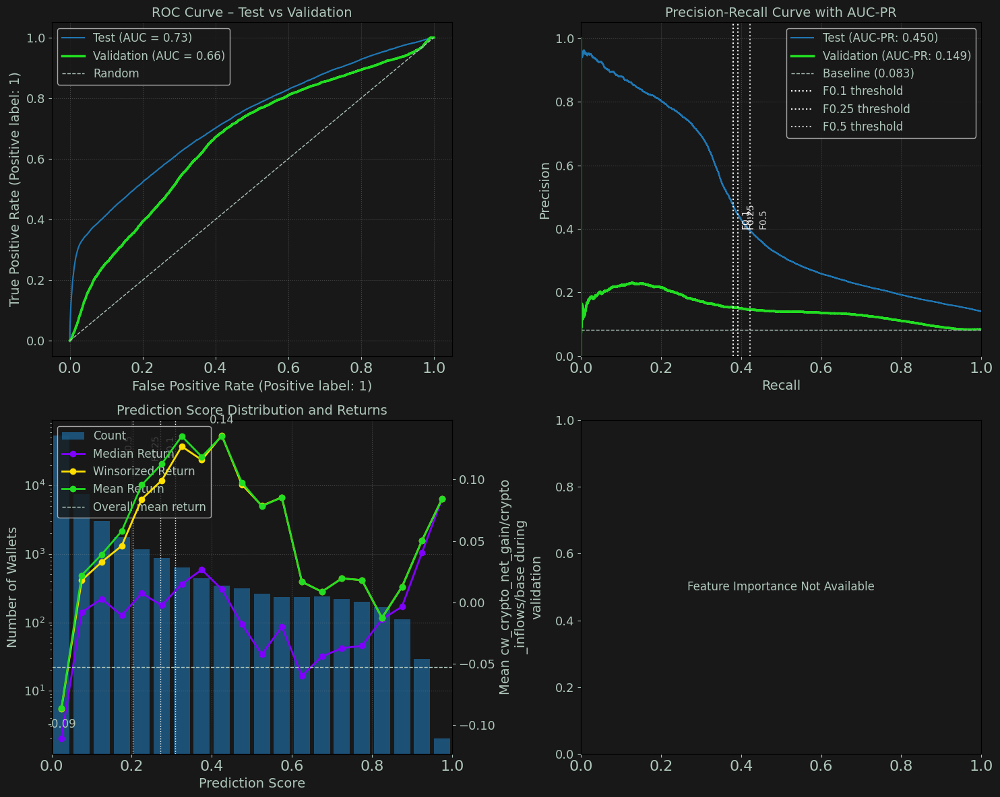

In [ ]:
# with drops
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[15/Aug/25 21:29:57] INFO [1276616746.<module>:5] -------------------------------------------------
[15/Aug/25 21:29:57] WARNING [1276616746.<module>:6]                 0: 2024-05-05
[15/Aug/25 21:29:57] INFO [1276616746.<module>:7] -------------------------------------------------
[15/Aug/25 21:29:57] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh0/wscr-dda-956--sh0-0815-210716/output/model.tar.gz
Test Samples:             74,100
Val Positive Samples:     1,580 (2.2%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.627  |  0.818
Val Accuracy:               0.922  |  0.858
Val Precision:              0.046  |  0.544
Val Recall:                 0.128  |  0.523
Val F1 Score:               0.068  |  0.533

Validation Retu

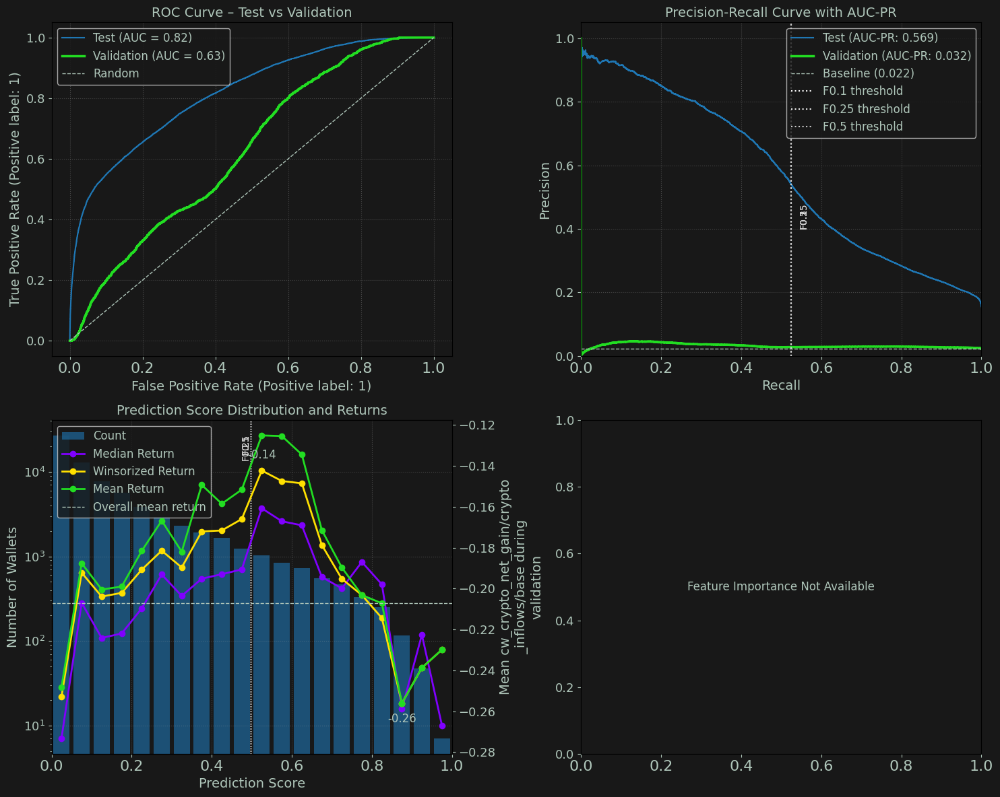

[15/Aug/25 21:29:57] INFO [1276616746.<module>:5] -------------------------------------------------
[15/Aug/25 21:29:57] WARNING [1276616746.<module>:6]                 60: 2024-07-04
[15/Aug/25 21:29:57] INFO [1276616746.<module>:7] -------------------------------------------------
[15/Aug/25 21:29:57] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh60/wscr-dda-956--sh60-0815-210716/output/model.tar.gz
Test Samples:             91,475
Val Positive Samples:     6,211 (5.4%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.541  |  0.807
Val Accuracy:               0.909  |  0.874
Val Precision:              0.054  |  0.518
Val Recall:                 0.042  |  0.496
Val F1 Score:               0.047  |  0.507

Validation R

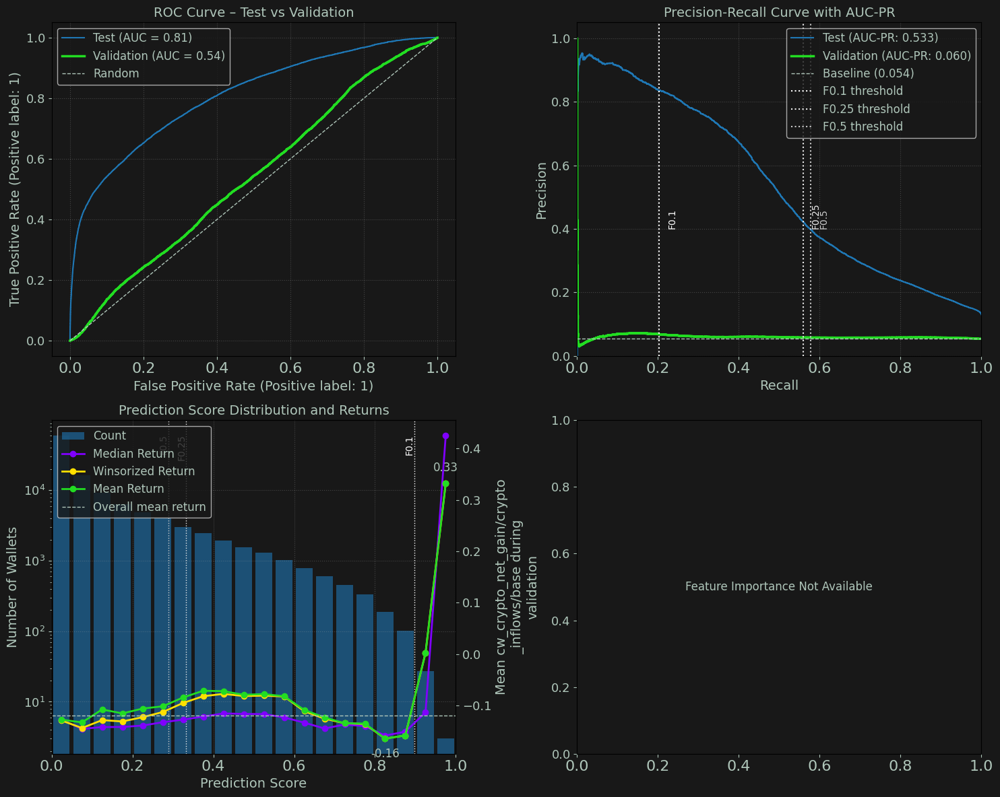

[15/Aug/25 21:29:57] INFO [1276616746.<module>:5] -------------------------------------------------
[15/Aug/25 21:29:57] WARNING [1276616746.<module>:6]                 120: 2024-09-02
[15/Aug/25 21:29:57] INFO [1276616746.<module>:7] -------------------------------------------------
[15/Aug/25 21:29:57] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh120/wscr-dda-956--sh120-0815-210716/output/model.tar.gz
Test Samples:             101,890
Val Positive Samples:     24,815 (21.7%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.433  |  0.788
Val Accuracy:               0.726  |  0.879
Val Precision:              0.128  |  0.510
Val Recall:                 0.045  |  0.472
Val F1 Score:               0.067  |  0.490

Valida

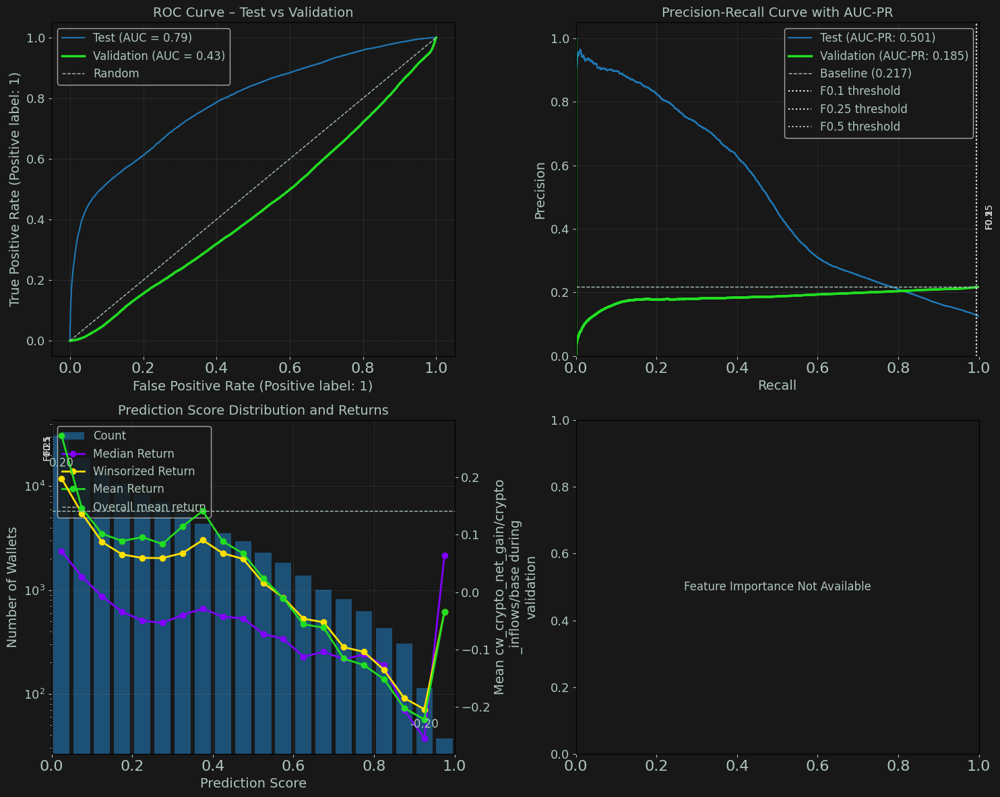

[15/Aug/25 21:29:58] INFO [1276616746.<module>:5] -------------------------------------------------
[15/Aug/25 21:29:58] WARNING [1276616746.<module>:6]                 180: 2024-11-01
[15/Aug/25 21:29:58] INFO [1276616746.<module>:7] -------------------------------------------------
[15/Aug/25 21:29:58] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh180/wscr-dda-956--sh180-0815-210716/output/model.tar.gz
Test Samples:             113,643
Val Positive Samples:     44,466 (24.9%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.427  |  0.772
Val Accuracy:               0.740  |  0.860
Val Precision:              0.197  |  0.496
Val Recall:                 0.014  |  0.442
Val F1 Score:               0.026  |  0.468

Valida

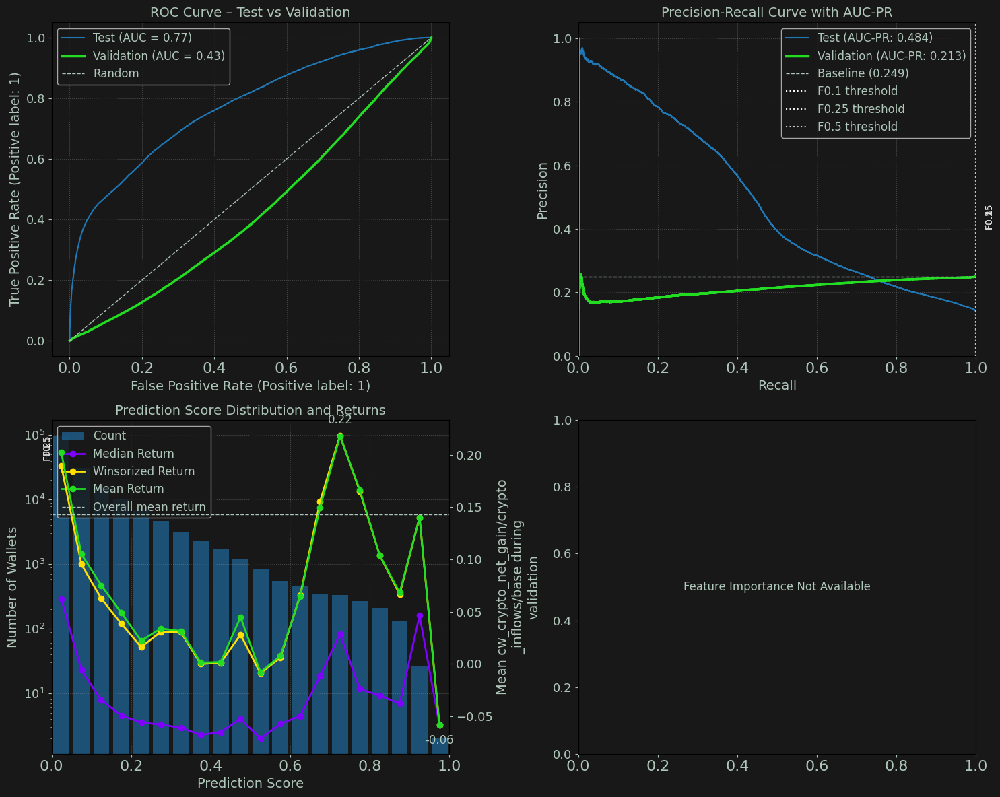

[15/Aug/25 21:29:58] INFO [1276616746.<module>:5] -------------------------------------------------
[15/Aug/25 21:29:58] WARNING [1276616746.<module>:6]                 240: 2024-12-31
[15/Aug/25 21:29:58] INFO [1276616746.<module>:7] -------------------------------------------------
[15/Aug/25 21:29:58] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh240/wscr-dda-956--sh240-0815-210716/output/model.tar.gz
Test Samples:             135,063
Val Positive Samples:     7,925 (5.0%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.522  |  0.753
Val Accuracy:               0.913  |  0.854
Val Precision:              0.047  |  0.587
Val Recall:                 0.038  |  0.373
Val F1 Score:               0.042  |  0.456

Validati

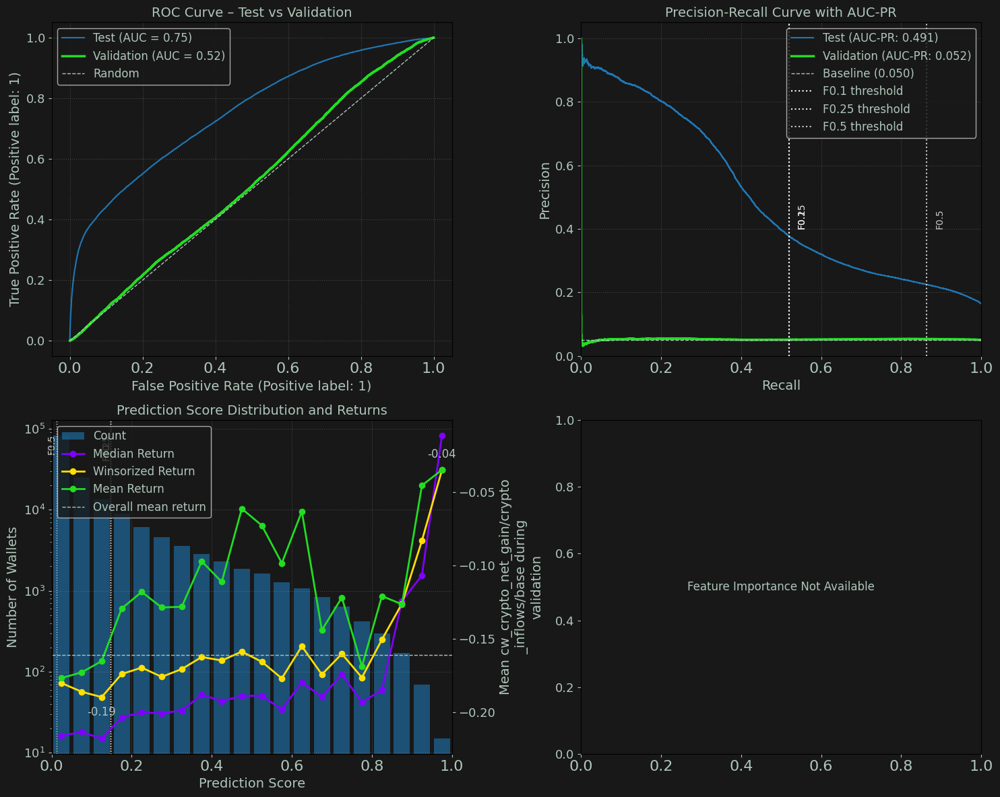

[15/Aug/25 21:29:59] INFO [1276616746.<module>:5] -------------------------------------------------
[15/Aug/25 21:29:59] WARNING [1276616746.<module>:6]                 300: 2025-03-01
[15/Aug/25 21:29:59] INFO [1276616746.<module>:7] -------------------------------------------------
[15/Aug/25 21:29:59] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh300/wscr-dda-956--sh300-0815-210716/output/model.tar.gz
Test Samples:             151,100
Val Positive Samples:     5,957 (8.3%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.517  |  0.726
Val Accuracy:               0.850  |  0.878
Val Precision:              0.107  |  0.621
Val Recall:                 0.111  |  0.340
Val F1 Score:               0.109  |  0.439

Validati

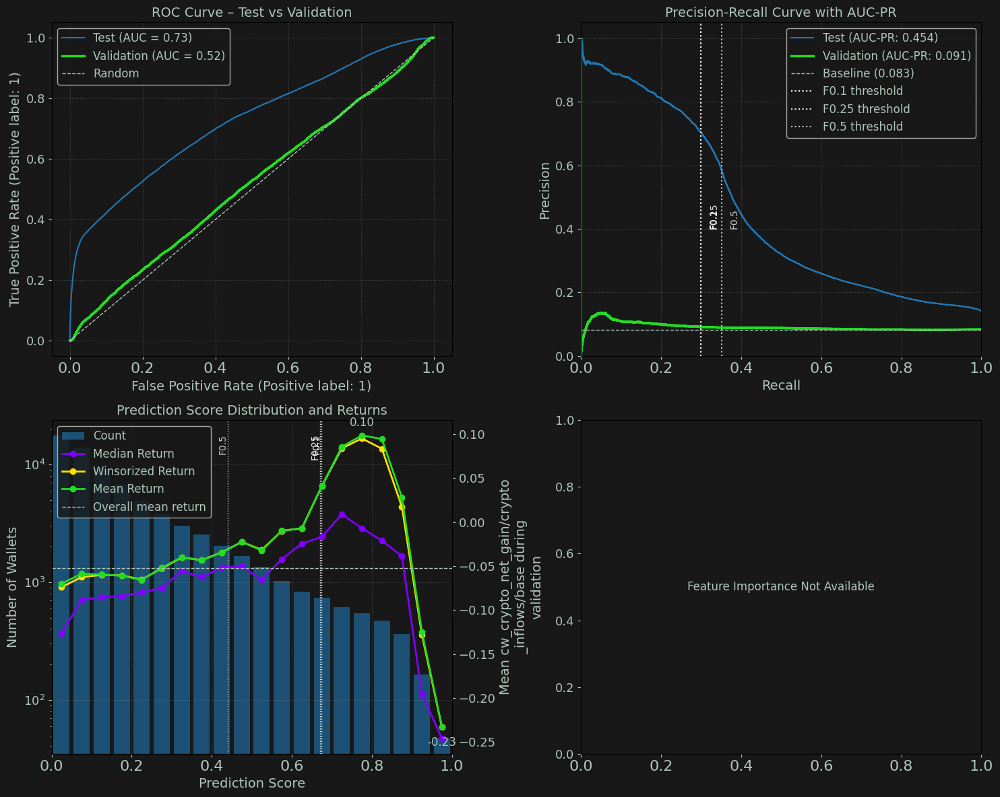

In [ ]:
# new baseline
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[15/Aug/25 19:30:22] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:22] WARNING [1829619635.<module>:6]                 0: 2024-06-04
[15/Aug/25 19:30:22] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:22] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh0/wscr-dda-956--sh0-0815-185811/output/model.tar.gz
Test Samples:             25,767
Val Positive Samples:     1,639 (4.4%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.472  |  0.767
Val Accuracy:               0.943  |  0.862
Val Precision:              0.041  |  0.511
Val Recall:                 0.013  |  0.450
Val F1 Score:               0.019  |  0.479

Validation Retu

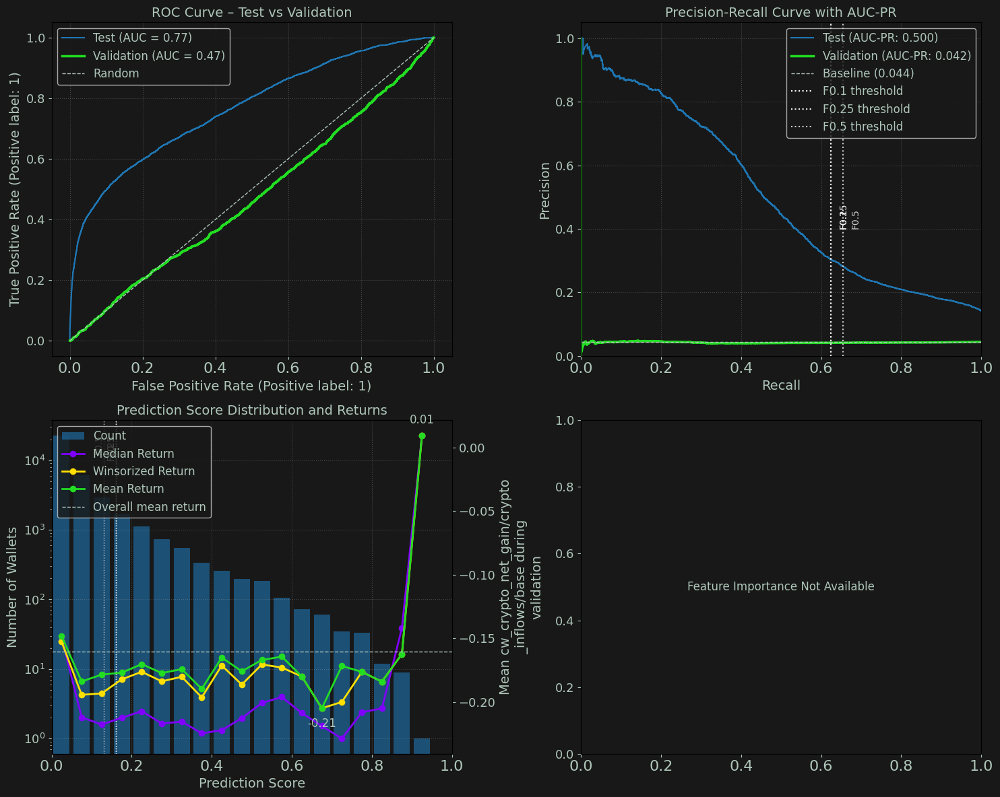

[15/Aug/25 19:30:23] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:23] WARNING [1829619635.<module>:6]                 60: 2024-08-03
[15/Aug/25 19:30:23] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:23] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh60/wscr-dda-956--sh60-0815-185811/output/model.tar.gz
Test Samples:             29,549
Val Positive Samples:     4,186 (16.8%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.570  |  0.789
Val Accuracy:               0.831  |  0.871
Val Precision:              0.245  |  0.481
Val Recall:                 0.003  |  0.459
Val F1 Score:               0.006  |  0.470

Validation 

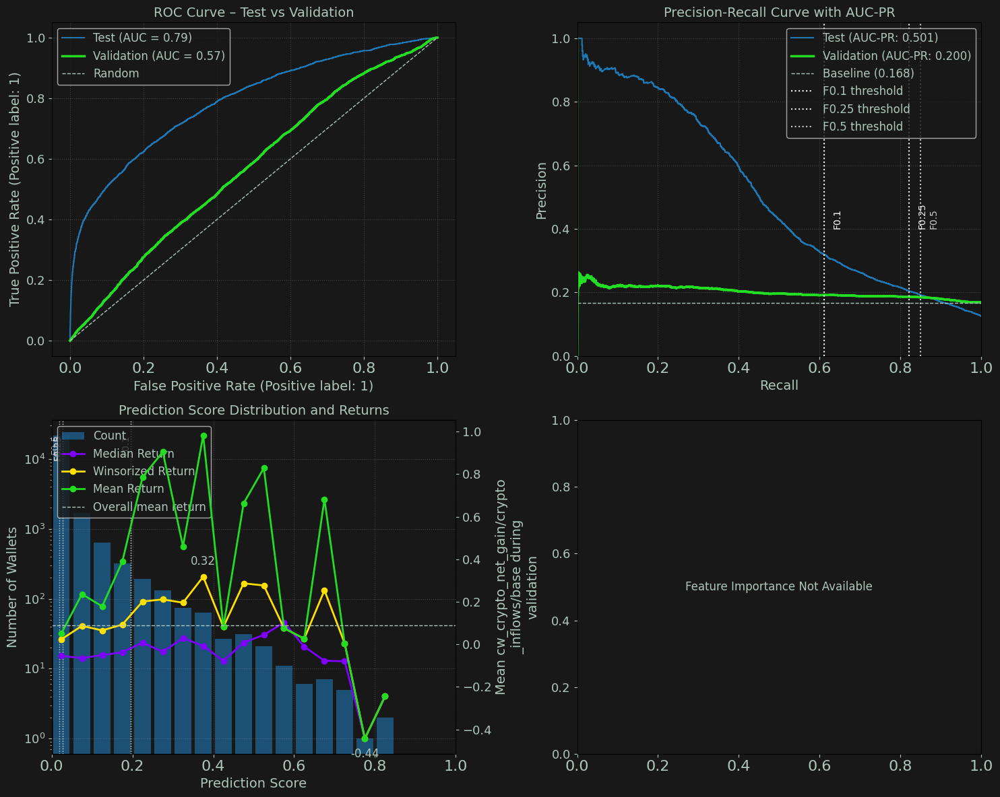

[15/Aug/25 19:30:23] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:23] WARNING [1829619635.<module>:6]                 120: 2024-10-02
[15/Aug/25 19:30:23] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:23] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh120/wscr-dda-956--sh120-0815-185811/output/model.tar.gz
Test Samples:             31,425
Val Positive Samples:     12,349 (29.6%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.543  |  0.755
Val Accuracy:               0.705  |  0.874
Val Precision:              0.562  |  0.535
Val Recall:                 0.015  |  0.395
Val F1 Score:               0.030  |  0.455

Validat

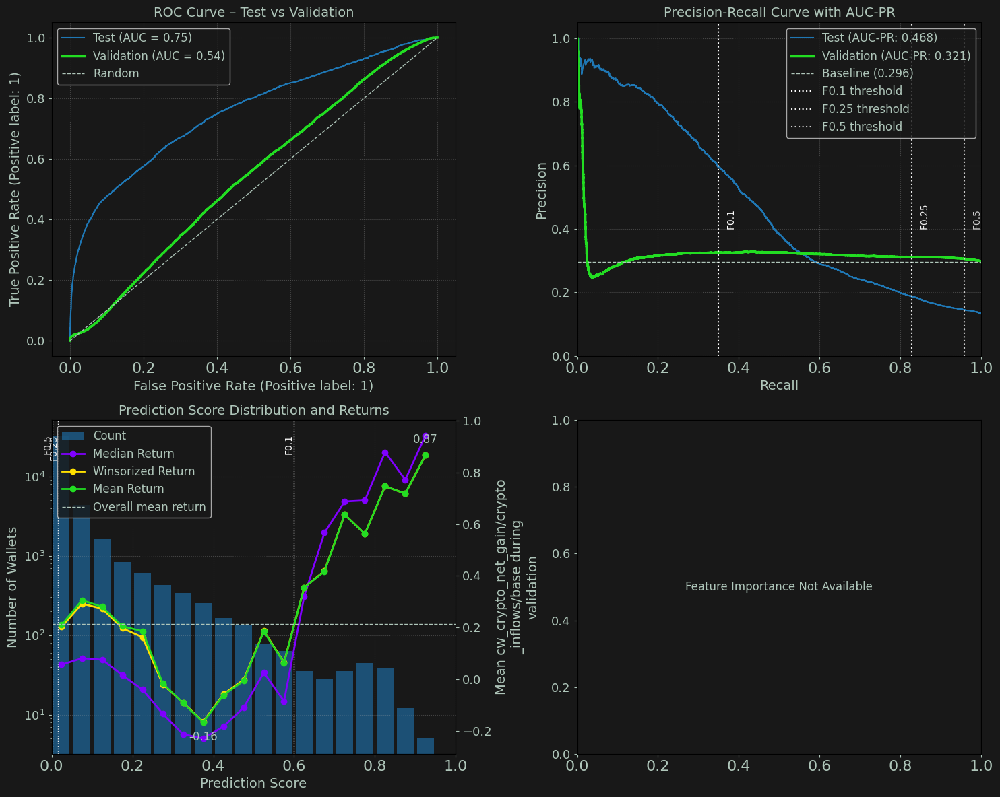

[15/Aug/25 19:30:23] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:23] WARNING [1829619635.<module>:6]                 180: 2024-12-01
[15/Aug/25 19:30:23] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:23] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh180/wscr-dda-956--sh180-0815-185811/output/model.tar.gz
Test Samples:             35,919
Val Positive Samples:     5,162 (8.8%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.572  |  0.726
Val Accuracy:               0.880  |  0.846
Val Precision:              0.140  |  0.555
Val Recall:                 0.072  |  0.338
Val F1 Score:               0.095  |  0.420

Validatio

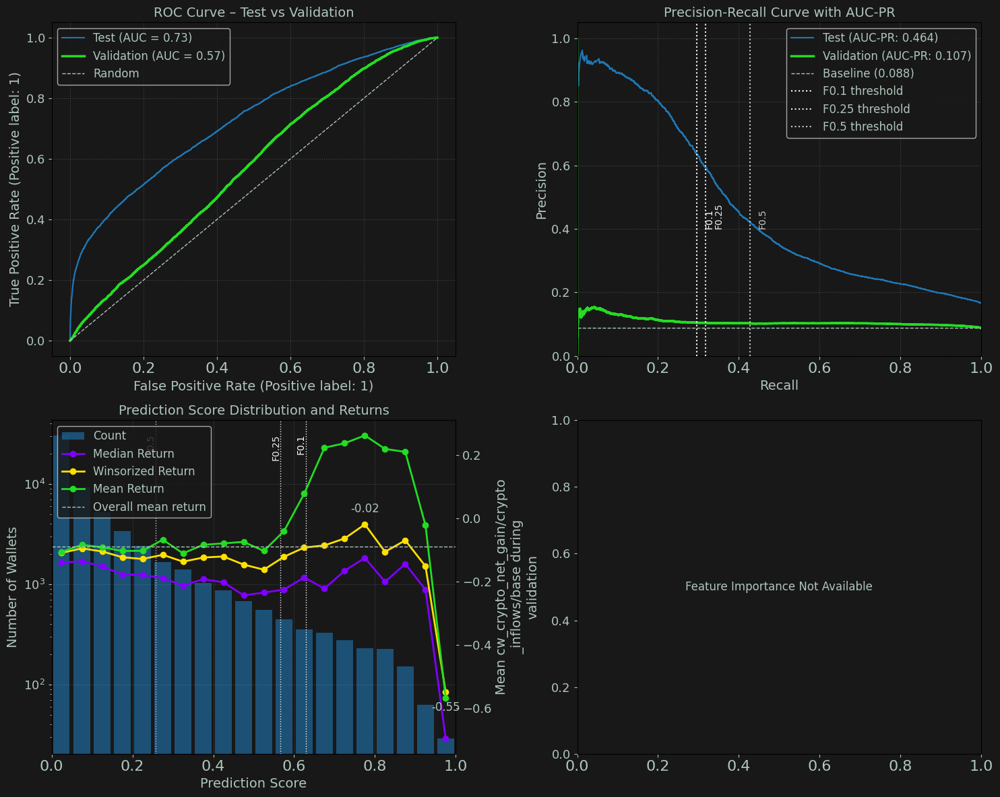

[15/Aug/25 19:30:24] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:24] WARNING [1829619635.<module>:6]                 240: 2025-01-30
[15/Aug/25 19:30:24] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:24] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh240/wscr-dda-956--sh240-0815-185811/output/model.tar.gz
Test Samples:             43,097
Val Positive Samples:     559 (2.1%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.543  |  0.747
Val Accuracy:               0.949  |  0.861
Val Precision:              0.041  |  0.550
Val Recall:                 0.064  |  0.374
Val F1 Score:               0.050  |  0.445

Validation 

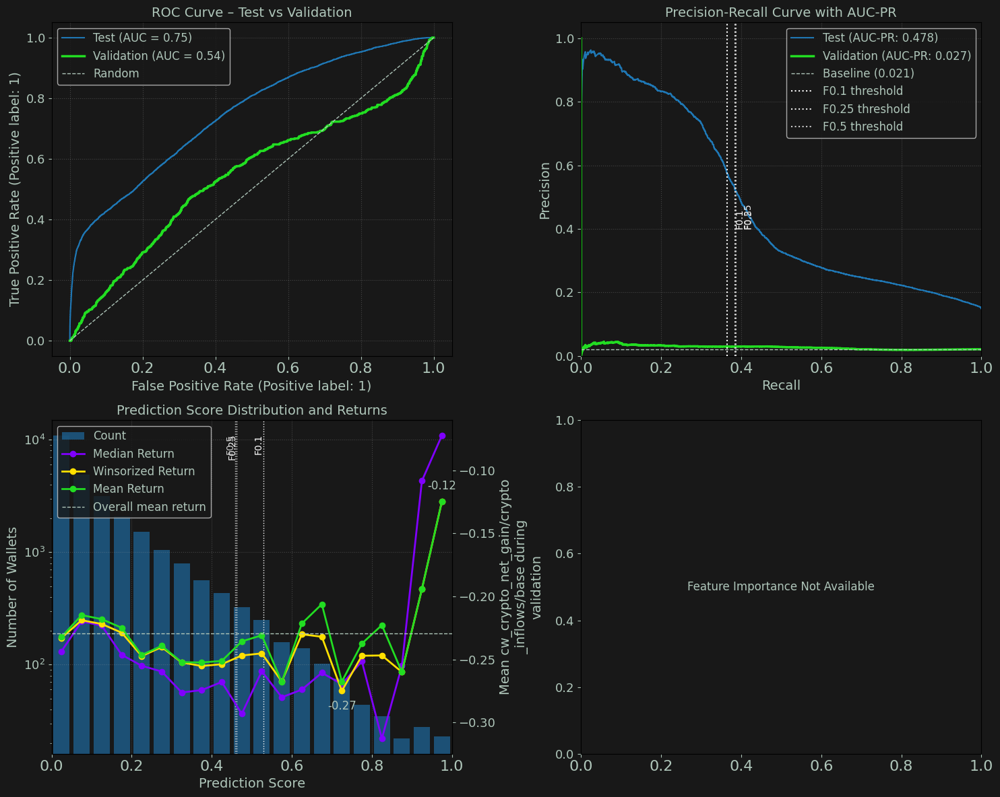

[15/Aug/25 19:30:24] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:24] WARNING [1829619635.<module>:6]                 300: 2025-03-31
[15/Aug/25 19:30:24] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:24] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh300/wscr-dda-956--sh300-0815-185811/output/model.tar.gz
Test Samples:             43,445
Val Positive Samples:     2,851 (18.6%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.578  |  0.752
Val Accuracy:               0.811  |  0.888
Val Precision:              0.403  |  0.674
Val Recall:                 0.030  |  0.347
Val F1 Score:               0.056  |  0.458

Validati

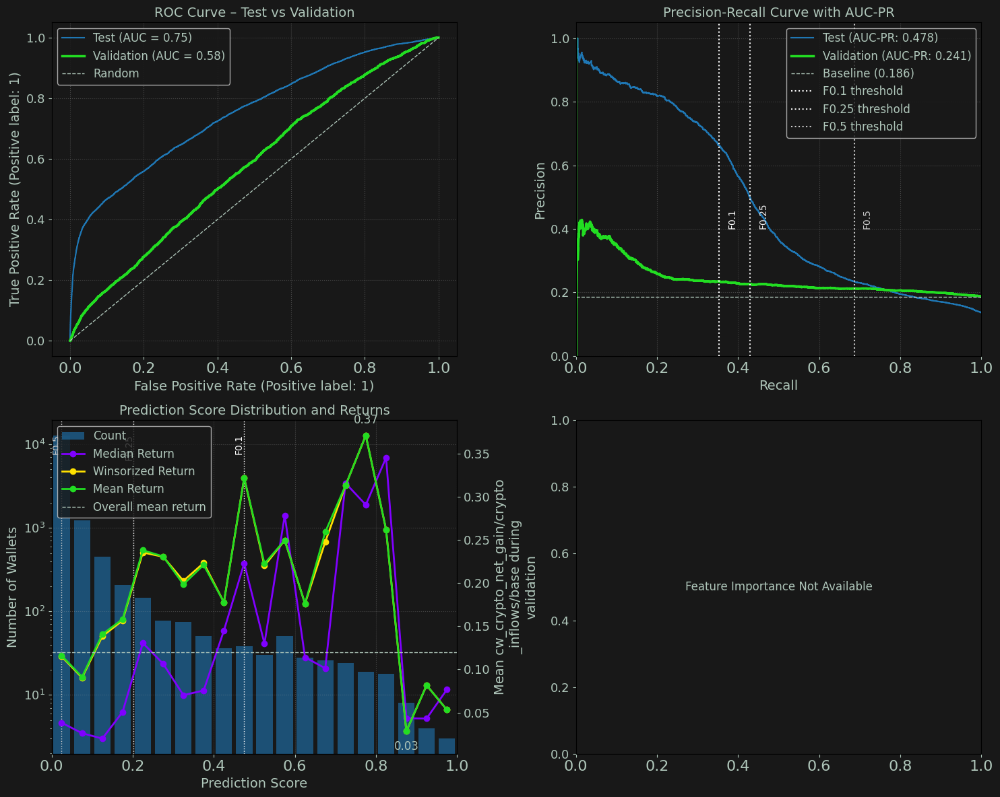

[15/Aug/25 19:30:24] INFO [1829619635.<module>:5] -------------------------------------------------
[15/Aug/25 19:30:24] WARNING [1829619635.<module>:6]                 360: 2025-05-30
[15/Aug/25 19:30:24] INFO [1829619635.<module>:7] -------------------------------------------------
[15/Aug/25 19:30:24] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh360/wscr-dda-956--sh360-0815-185811/output/model.tar.gz
Test Samples:             41,237
Val Positive Samples:     2,565 (16.2%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.570  |  0.735
Val Accuracy:               0.808  |  0.891
Val Precision:              0.159  |  0.612
Val Recall:                 0.044  |  0.368
Val F1 Score:               0.069  |  0.460

Validati

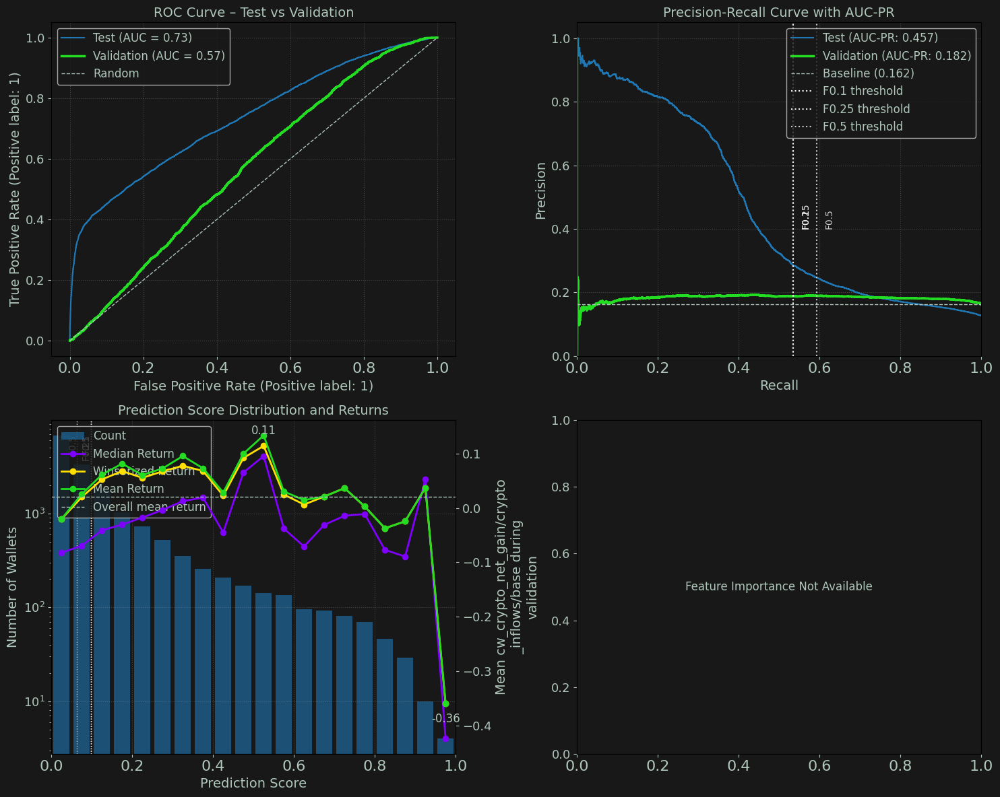

In [ ]:
# no macro
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[15/Aug/25 17:26:33] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:33] WARNING [1138767417.<module>:5]                 0: 2024-06-04
[15/Aug/25 17:26:33] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:33] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh0/wscr-dda-956--sh0-0815-154648/output/model.tar.gz
Test Samples:             53,793
Val Positive Samples:     4,407 (4.7%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.471  |  0.788
Val Accuracy:               0.924  |  0.860
Val Precision:              0.037  |  0.517
Val Recall:                 0.025  |  0.478
Val F1 Score:               0.030  |  0.497

Validation Retu

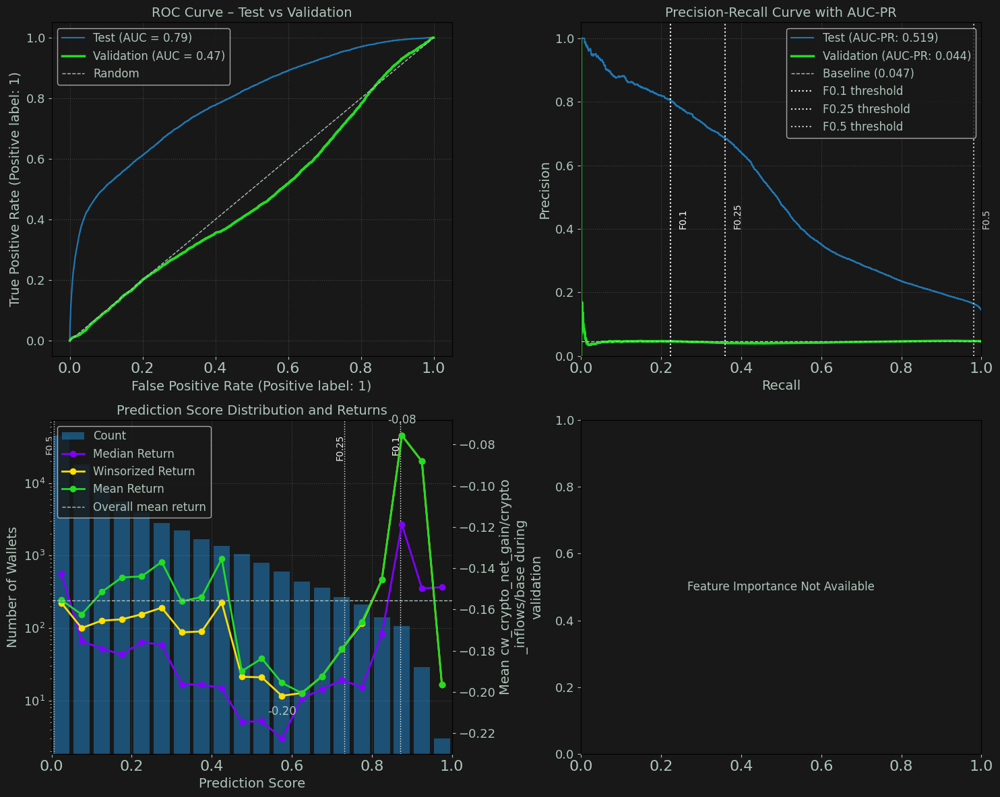

[15/Aug/25 17:26:33] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:33] WARNING [1138767417.<module>:5]                 60: 2024-08-03
[15/Aug/25 17:26:33] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:33] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh60/wscr-dda-956--sh60-0815-154648/output/model.tar.gz
Test Samples:             64,508
Val Positive Samples:     11,787 (17.1%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.623  |  0.792
Val Accuracy:               0.829  |  0.883
Val Precision:              0.461  |  0.536
Val Recall:                 0.011  |  0.451
Val F1 Score:               0.021  |  0.490

Validation

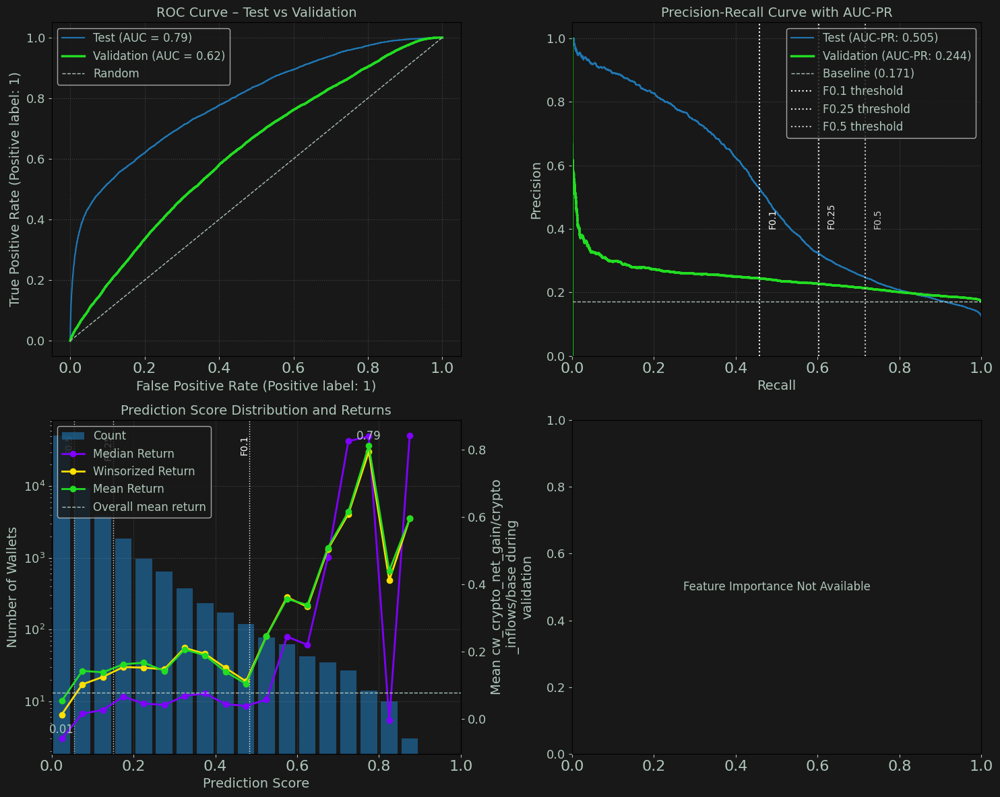

[15/Aug/25 17:26:34] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:34] WARNING [1138767417.<module>:5]                 120: 2024-10-02
[15/Aug/25 17:26:34] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:34] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh120/wscr-dda-956--sh120-0815-154648/output/model.tar.gz
Test Samples:             71,235
Val Positive Samples:     30,431 (29.3%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.531  |  0.748
Val Accuracy:               0.707  |  0.868
Val Precision:              0.303  |  0.511
Val Recall:                 0.001  |  0.379
Val F1 Score:               0.003  |  0.435

Validat

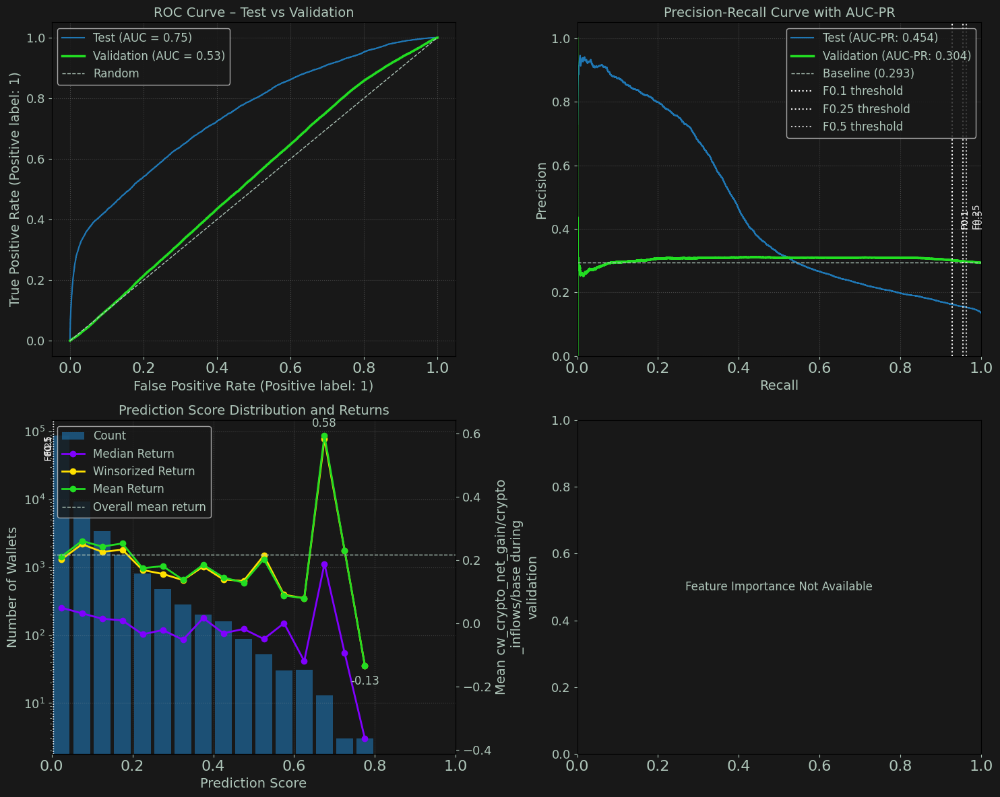

[15/Aug/25 17:26:34] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:34] WARNING [1138767417.<module>:5]                 180: 2024-12-01
[15/Aug/25 17:26:34] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:34] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh180/wscr-dda-956--sh180-0815-154648/output/model.tar.gz
Test Samples:             83,517
Val Positive Samples:     10,204 (8.0%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.568  |  0.684
Val Accuracy:               0.911  |  0.837
Val Precision:              0.132  |  0.519
Val Recall:                 0.018  |  0.312
Val F1 Score:               0.032  |  0.390

Validati

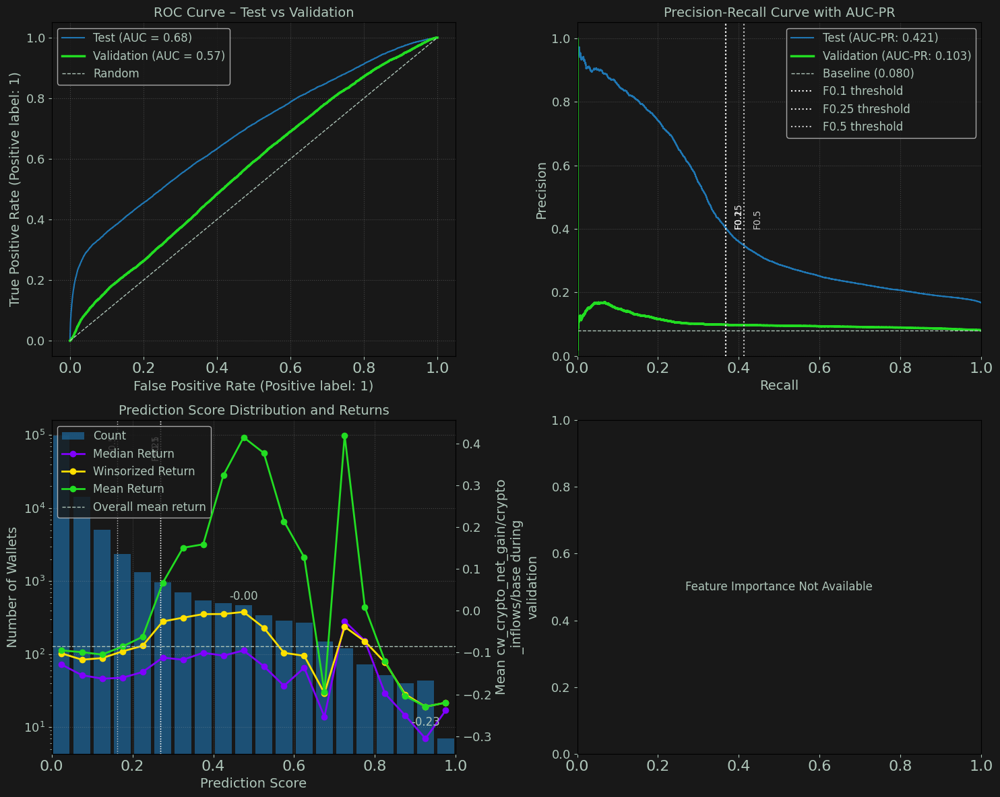

[15/Aug/25 17:26:34] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:34] WARNING [1138767417.<module>:5]                 240: 2025-01-30
[15/Aug/25 17:26:34] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:34] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh240/wscr-dda-956--sh240-0815-154648/output/model.tar.gz
Test Samples:             99,294
Val Positive Samples:     1,332 (1.9%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.526  |  0.736
Val Accuracy:               0.966  |  0.863
Val Precision:              0.023  |  0.572
Val Recall:                 0.020  |  0.340
Val F1 Score:               0.022  |  0.427

Validatio

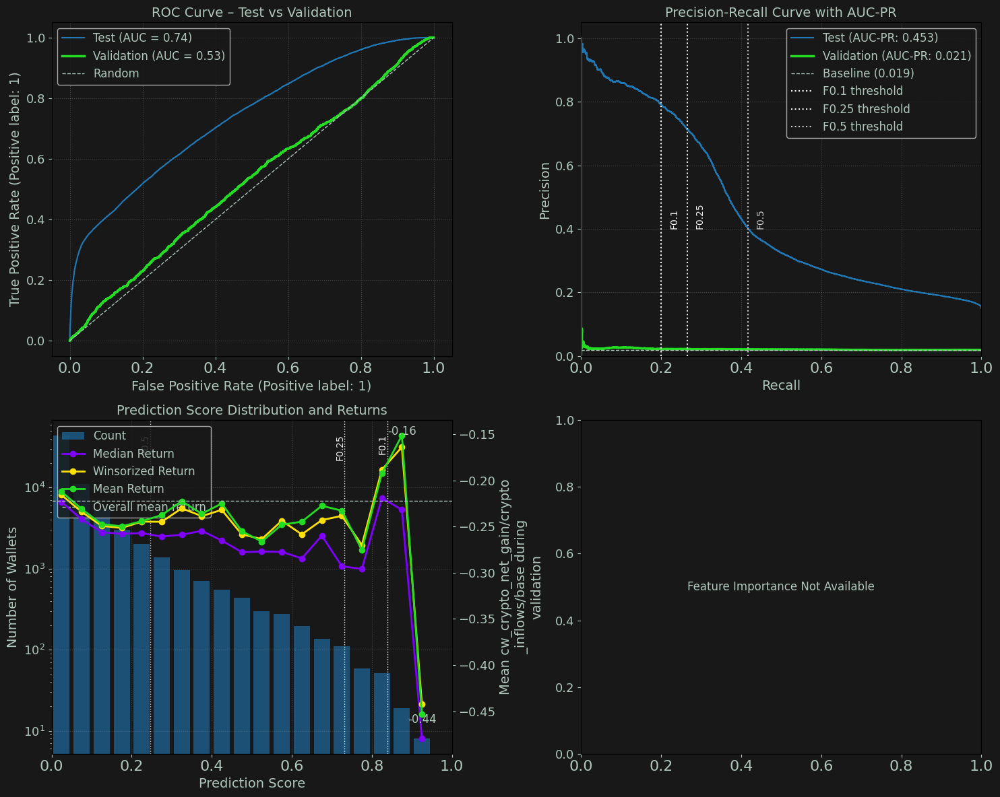

[15/Aug/25 17:26:35] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:35] WARNING [1138767417.<module>:5]                 300: 2025-03-31
[15/Aug/25 17:26:35] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:35] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh300/wscr-dda-956--sh300-0815-154648/output/model.tar.gz
Test Samples:             102,523
Val Positive Samples:     8,095 (18.5%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.558  |  0.743
Val Accuracy:               0.811  |  0.883
Val Precision:              0.379  |  0.636
Val Recall:                 0.034  |  0.309
Val F1 Score:               0.063  |  0.416

Validat

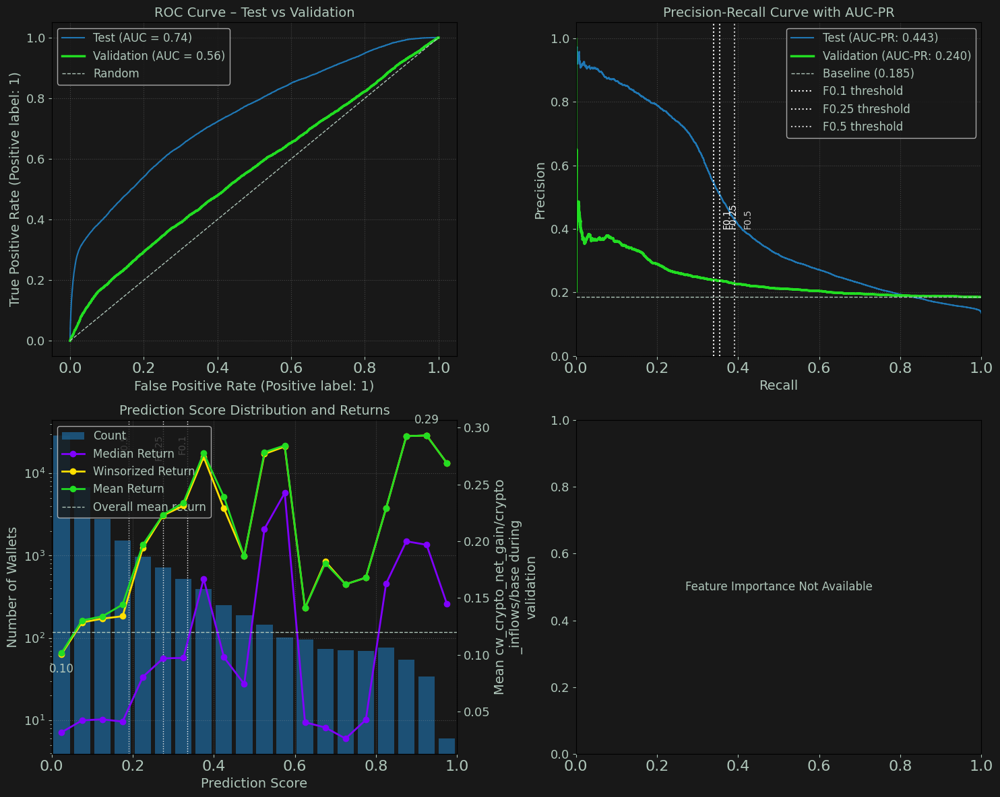

[15/Aug/25 17:26:35] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 17:26:35] WARNING [1138767417.<module>:5]                 360: 2025-05-30
[15/Aug/25 17:26:35] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 17:26:35] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh360/wscr-dda-956--sh360-0815-154648/output/model.tar.gz
Test Samples:             99,493
Val Positive Samples:     6,688 (15.5%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.584  |  0.743
Val Accuracy:               0.828  |  0.887
Val Precision:              0.263  |  0.594
Val Recall:                 0.062  |  0.318
Val F1 Score:               0.101  |  0.414

Validati

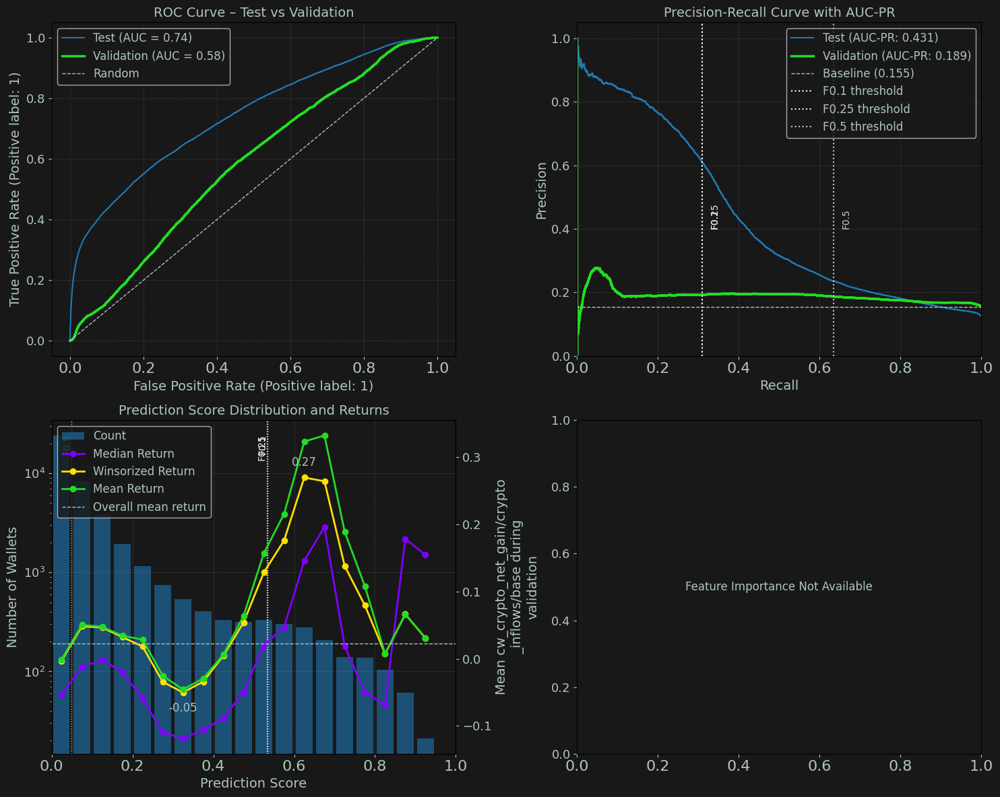

In [ ]:
# baseline
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


[15/Aug/25 16:23:14] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:14] WARNING [1138767417.<module>:5]                 0: 2024-05-05
[15/Aug/25 16:23:14] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:14] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh0/wscr-dda-956--sh0-0815-154648/output/model.tar.gz
Test Samples:             53,793
Val Positive Samples:     1,093 (2.2%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.538  |  0.788
Val Accuracy:               0.936  |  0.860
Val Precision:              0.016  |  0.517
Val Recall:                 0.033  |  0.478
Val F1 Score:               0.022  |  0.497

Validation Retu

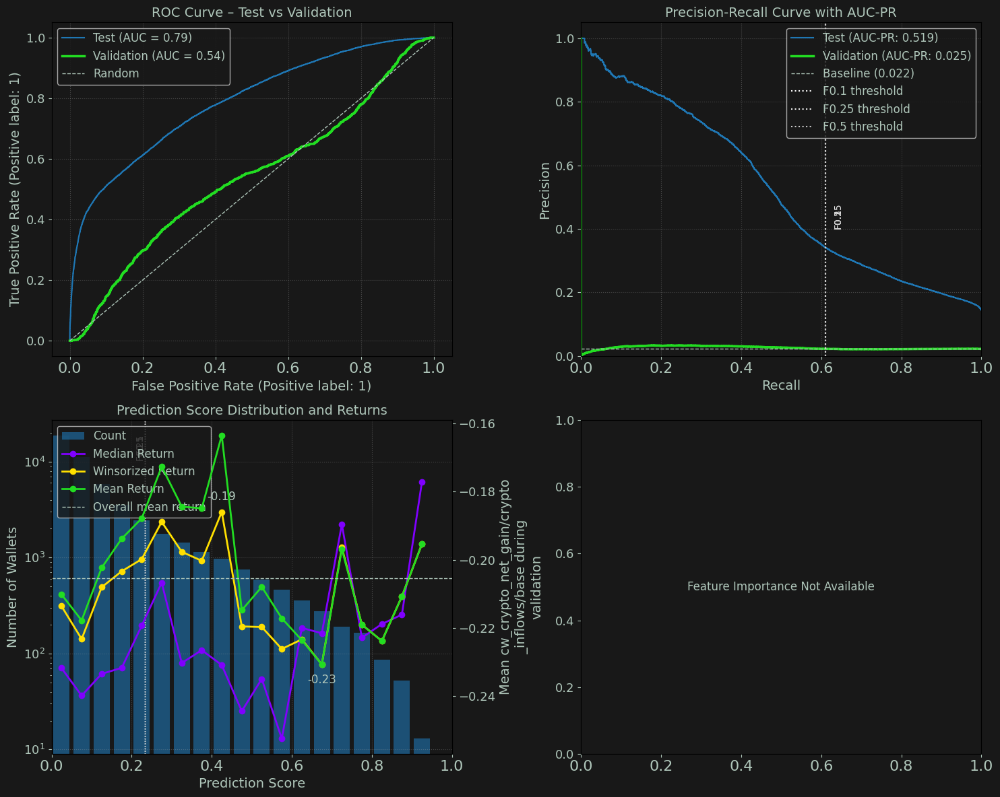

[15/Aug/25 16:23:14] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:14] WARNING [1138767417.<module>:5]                 60: 2024-07-04
[15/Aug/25 16:23:14] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:14] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh60/wscr-dda-956--sh60-0815-154648/output/model.tar.gz
Test Samples:             64,508
Val Positive Samples:     4,166 (5.2%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.566  |  0.792
Val Accuracy:               0.940  |  0.883
Val Precision:              0.029  |  0.536
Val Recall:                 0.005  |  0.451
Val F1 Score:               0.008  |  0.490

Validation R

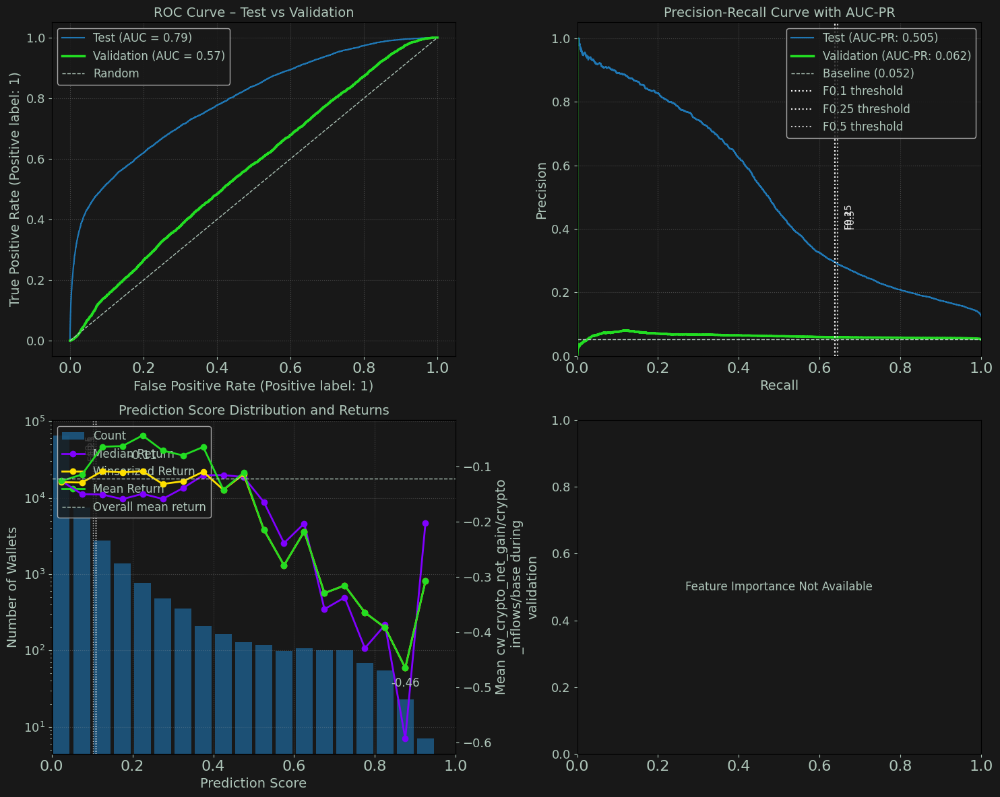

[15/Aug/25 16:23:15] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:15] WARNING [1138767417.<module>:5]                 120: 2024-09-02
[15/Aug/25 16:23:15] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:15] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh120/wscr-dda-956--sh120-0815-154648/output/model.tar.gz
Test Samples:             71,235
Val Positive Samples:     16,969 (21.5%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.548  |  0.748
Val Accuracy:               0.785  |  0.868
Val Precision:              0.317  |  0.511
Val Recall:                 0.002  |  0.379
Val F1 Score:               0.004  |  0.435

Validat

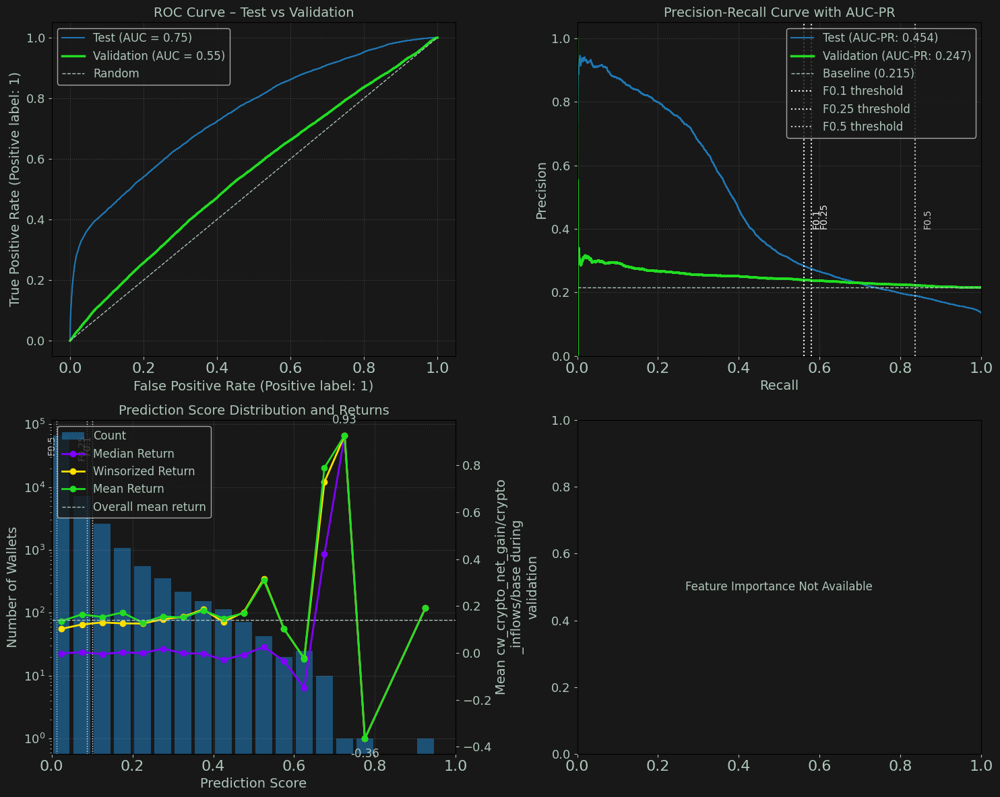

[15/Aug/25 16:23:15] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:15] WARNING [1138767417.<module>:5]                 180: 2024-11-01
[15/Aug/25 16:23:15] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:15] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh180/wscr-dda-956--sh180-0815-154648/output/model.tar.gz
Test Samples:             83,517
Val Positive Samples:     30,224 (24.9%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.479  |  0.684
Val Accuracy:               0.740  |  0.837
Val Precision:              0.076  |  0.519
Val Recall:                 0.004  |  0.312
Val F1 Score:               0.007  |  0.390

Validat

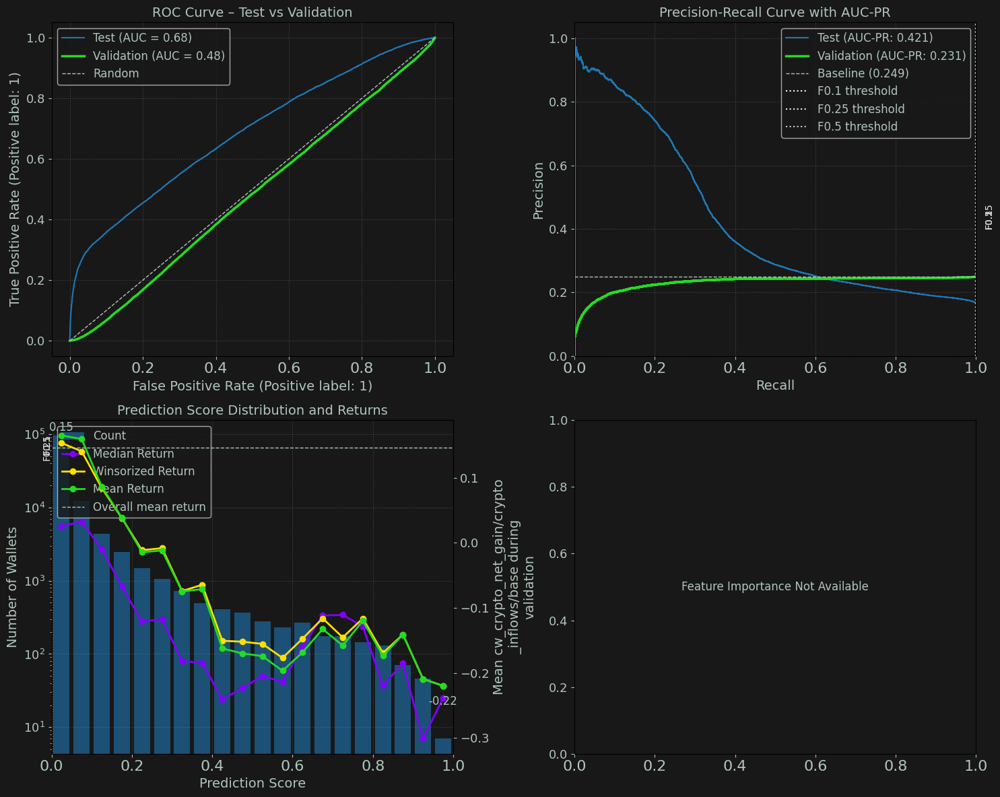

[15/Aug/25 16:23:16] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:16] WARNING [1138767417.<module>:5]                 240: 2024-12-31
[15/Aug/25 16:23:16] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:16] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh240/wscr-dda-956--sh240-0815-154648/output/model.tar.gz
Test Samples:             99,294
Val Positive Samples:     5,235 (4.9%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.602  |  0.736
Val Accuracy:               0.925  |  0.863
Val Precision:              0.085  |  0.572
Val Recall:                 0.056  |  0.340
Val F1 Score:               0.067  |  0.427

Validatio

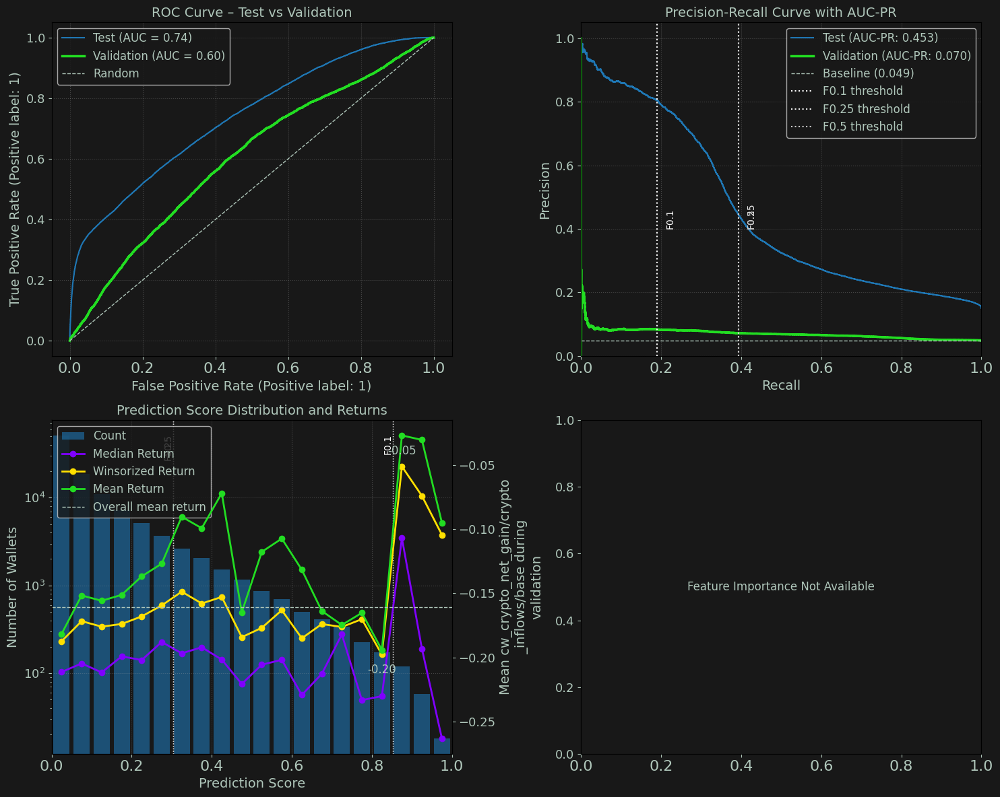

[15/Aug/25 16:23:16] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:16] WARNING [1138767417.<module>:5]                 300: 2025-03-01
[15/Aug/25 16:23:16] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:16] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh300/wscr-dda-956--sh300-0815-154648/output/model.tar.gz
Test Samples:             102,523
Val Positive Samples:     3,856 (8.0%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.682  |  0.743
Val Accuracy:               0.912  |  0.883
Val Precision:              0.212  |  0.636
Val Recall:                 0.036  |  0.309
Val F1 Score:               0.062  |  0.416

Validati

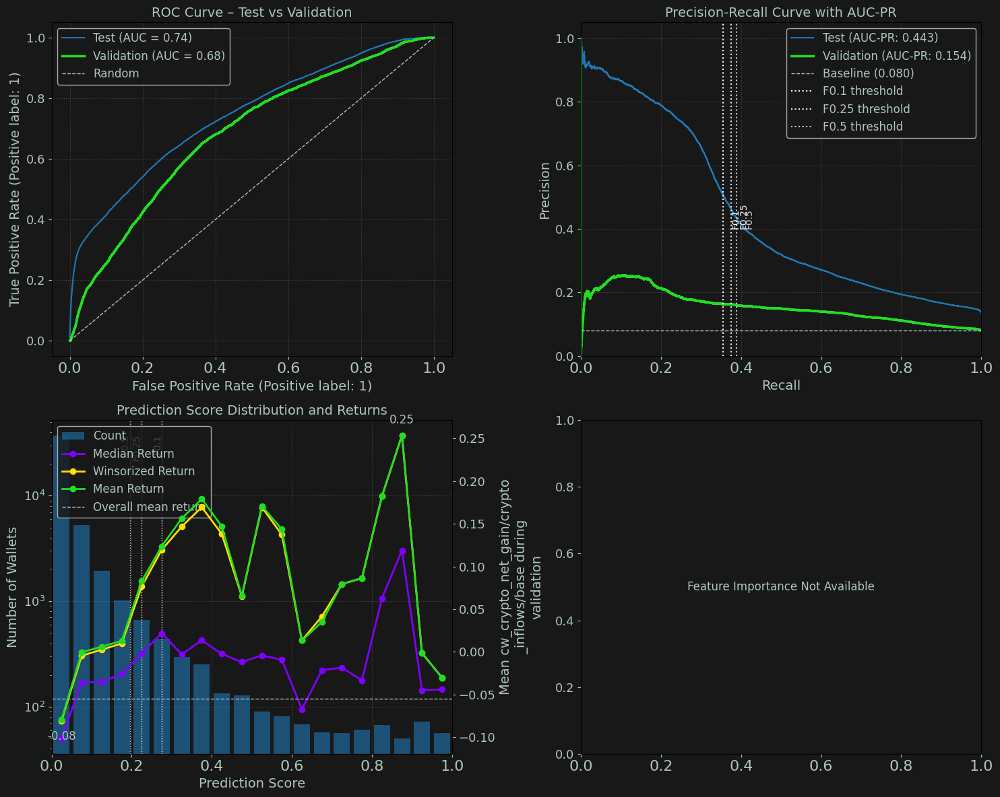

[15/Aug/25 16:23:16] INFO [1138767417.<module>:4] -------------------------------------------------
[15/Aug/25 16:23:16] WARNING [1138767417.<module>:5]                 360: 2025-04-30
[15/Aug/25 16:23:16] INFO [1138767417.<module>:6] -------------------------------------------------
[15/Aug/25 16:23:16] INFO [model_evaluation.summary_report:1097] 
Model Performance Summary
Objective: classification
Target: cw_crypto_net_gain/crypto_inflows/base 0.3 to 
ID: s3://wallet-script-models/model-outputs/dda-956-importan-v3/sh360/wscr-dda-956--sh360-0815-154648/output/model.tar.gz
Test Samples:             99,493
Val Positive Samples:     5,706 (12.5%)
Number of Features:       231

Classification Metrics:      Val   |  Test
-------------------------------------------
Val ROC AUC:                0.645  |  0.743
Val Accuracy:               0.853  |  0.887
Val Precision:              0.260  |  0.594
Val Recall:                 0.091  |  0.318
Val F1 Score:               0.135  |  0.414

Validati

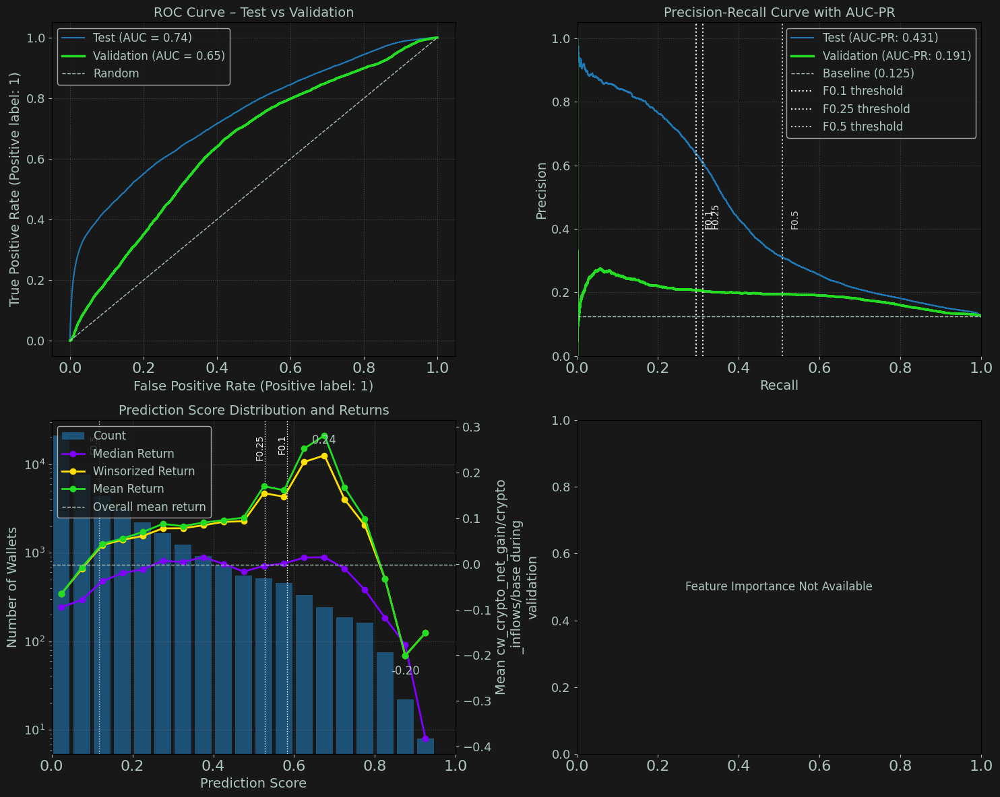

In [ ]:
first_val_date = datetime.strptime(min(sage_wallets_config['training_data']['val_offsets']),'%y%m%d')
for e in evaluators:
    date = (first_val_date + timedelta(days=e)).strftime('%Y-%m-%d')
    logger.info('-------------------------------------------------')
    logger.warning(f'                {e}: {date}')
    logger.info('-------------------------------------------------')
    if evaluators[e] is None:
        logger.warning("All rows filtered out")
        continue
    evaluators[e].summary_report()
    evaluators[e].plot_wallet_evaluation()


#### predict and filter data by epoch_shift

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


# Load S3 URIs
workflow_orch = wo.WalletWorkflowOrchestrator(sage_wallets_config,sage_wallets_modeling_config)
s3_uris = workflow_orch.retrieve_training_data_uris(['concat'])

epoch_shift = sage_wallets_config['training_data']['epoch_shifts'][0]

# Create modeler with epoch_shift as the date_suffix
shift_s3_uris = {f'sh{epoch_shift}': s3_uris['concat']}
concat_modeler = wm.WalletModeler(
    wallets_config=sage_wallets_config,
    modeling_config=sage_wallets_modeling_config,
    date_suffix=f'sh{epoch_shift}',
    s3_uris=shift_s3_uris,
    override_approvals=None
)

# Load the existing concatenated model
model_info = concat_modeler.load_existing_model(epoch_shift=epoch_shift)

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

epoch_shift = sage_wallets_config['training_data']['epoch_shifts'][0]

date_suffix = f'sh{epoch_shift}'
y_test_pred = sime.load_bt_sagemaker_predictions('test', sage_wallets_config, date_suffix)
y_test      = sime.load_concatenated_y('test', sage_wallets_config, sage_wallets_modeling_config)
y_val_pred  = sime.load_bt_sagemaker_predictions('val', sage_wallets_config, date_suffix)
y_val       = sime.load_concatenated_y('val', sage_wallets_config, sage_wallets_modeling_config)


target_var = sage_wallets_modeling_config['target']['target_var']
y_test.columns = [target_var]
y_val.columns = [target_var]

# Single function call for complete evaluation
evaluator = sime.create_concatenated_sagemaker_evaluator(
    sage_wallets_config,
    sage_wallets_modeling_config,
    model_info['model_uri'],
    y_test_pred,
    y_test,
    y_val_pred,
    y_val,
    epoch_shift
)

In [ ]:
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
# u.notify('soft_twinkle_musical')


### Single Model Sequence

#### train

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


workflow_orch = wo.WalletWorkflowOrchestrator(
    sage_wallets_config,
    sage_wallets_modeling_config
)
concat_uris = workflow_orch.upload_concatenated_training_data(overwrite_existing=False)
modeling_results = workflow_orch.train_concatenated_offsets_model(concat_uris)

#### evaluate HPO outcomes

In [ ]:
player = u.AmbientPlayer()
player.stop_all_players()

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

workflow_orch = wo.WalletWorkflowOrchestrator(
    sage_wallets_config,
    sage_wallets_modeling_config
)
workflow_orch.get_hpo_results('concat')

In [ ]:
# Get the best hyperparameters
best_params = modeling_results['tuner'].best_training_job()

# Or more detailed info
analytics = modeling_results['tuner'].analytics()
best_job_df = analytics.dataframe()

# The best parameters are in the hyperparameters columns
print(best_params)
print(best_job_df.loc[0, ['eta', 'max_depth', 'subsample', 'FinalObjectiveValue']])

#### load existing model

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

# Load S3 URIs
workflow_orch = wo.WalletWorkflowOrchestrator(sage_wallets_config,sage_wallets_modeling_config)
s3_uris = workflow_orch.retrieve_training_data_uris(['concat'])

# Create modeler with 'concat' as the date_suffix
concat_modeler = wm.WalletModeler(
    wallets_config=sage_wallets_config,
    modeling_config=sage_wallets_modeling_config,
    date_suffix='concat',
    s3_uris=s3_uris,
    override_approvals=None
)

# Step 2: Load the existing concatenated model
model_info = concat_modeler.load_existing_model(modeling_results['model_uri'])


In [ ]:
model_info

#### predict

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

pred_results = concat_modeler.batch_predict_test_and_val()

#### evaluate

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')

date_suffix = 'concat'
y_test_pred = sime.load_bt_sagemaker_predictions('test', sage_wallets_config, date_suffix)
y_test      = sime.load_concatenated_y('test', sage_wallets_config, sage_wallets_modeling_config)
y_val_pred  = sime.load_bt_sagemaker_predictions('val', sage_wallets_config, date_suffix)
y_val       = sime.load_concatenated_y('val', sage_wallets_config, sage_wallets_modeling_config)


target_var = sage_wallets_modeling_config['target']['target_var']
y_test.columns = [target_var]
y_val.columns = [target_var]

# Single function call for complete evaluation
evaluator = sime.create_concatenated_sagemaker_evaluator(
    sage_wallets_config,
    sage_wallets_modeling_config,
    model_info['model_uri'],
    y_test_pred,
    y_test,
    y_val_pred,
    y_val,
)

In [ ]:
# auc pr 0.4 all history
logger.info(modeling_results['model_uri'])
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
# u.notify('soft_twinkle_musical')


In [ ]:
# auc pr 0.4 all history
logger.info(modeling_results['model_uri'])
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
# u.notify('soft_twinkle_musical')


In [ ]:
# auc pr 0.4 mktcap 20M-4B
logger.info(modeling_results['model_uri'])
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
# u.notify('soft_twinkle_musical')


In [ ]:
# auc pr mktcap 20M-4B, z score 1.5
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
u.notify('soft_twinkle_musical')


In [ ]:
# auc pr mktcap 20M-4B, inflows $5k
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
u.notify('soft_twinkle_musical')


In [ ]:
# auc pr mktcap 20M-4B, z score 1.5
evaluator.summary_report()
evaluator.plot_wallet_evaluation()
u.notify('soft_twinkle_musical')


## Temporal cv model

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


date_suffixes = [
    '231008',
    '231107',
    '240306',
    '241101',
    '250301'
]
workflow_orch = wo.WalletWorkflowOrchestrator(sage_wallets_config,sage_wallets_modeling_config)
workflow_orch.load_all_training_data(date_suffixes)
s3_uris = workflow_orch.retrieve_training_data_uris(date_suffixes)

In [ ]:
sm.train_temporal_cv_script_model(sage_wallets_config,sage_wallets_modeling_config,cv_s3_uri)

### Predict Using Endpoints

#### deploy endpoint for predictions

In [ ]:
modeler.list_active_endpoints()

In [ ]:
modeler.deploy_endpoint()

#### load and preprocess test/val dfs

In [ ]:
x_test = pd.read_parquet(
    Path("../s3_uploads/wallet_training_data_queue") /
    sage_wallets_config['training_data']['local_directory'] /
    f"x_test_{date_suffix}.parquet"
)
x_val = pd.read_parquet(
    Path("../s3_uploads/wallet_training_data_queue") /
    sage_wallets_config['training_data']['local_directory'] /
    f"x_val_{date_suffix}.parquet"
)




In [ ]:
preprocessor = SageWalletsPreprocessor(sage_wallets_config)
x_test_processed = preprocessor.preprocess_x_df(x_test)
x_val_processed = preprocessor.preprocess_x_df(x_val)

logger.info(f"Preprocessed X_test {x_test_processed.shape} and "
            f"X_val {x_val_processed.shape}.")

#### predict

In [ ]:
y_test_pred = modeler.predict_using_endpoint(x_test_processed, 'test')
y_val_pred = modeler.predict_using_endpoint(x_val_processed, 'val')

#### delete all endpoints

In [ ]:
modeler.delete_all_endpoints()

In [ ]:
modeler.list_active_endpoints()
modeler.list_all_endpoints()

# Model Evaluation

### Analyze predictions

In [ ]:
[importlib.reload(module) for module in modules]
sage_wallets_config = ucv.load_sage_wallets_config('../config/sage_wallets_config.yaml')
sage_wallets_modeling_config = ucv.load_sage_wallets_modeling_config('../config/sage_wallets_modeling_config.yaml')


date_suffixes = [
    '231008',
    # '240306'
]
date_suffix = date_suffixes[0]

In [ ]:
y_test_pred = sime.load_bt_sagemaker_predictions('test', sage_wallets_config, date_suffix)
y_val_pred = sime.load_bt_sagemaker_predictions('val', sage_wallets_config, date_suffix)

In [ ]:
# Single function call for complete evaluation
evaluator = sime.run_sagemaker_evaluation(
    sage_wallets_config,
    sage_wallets_modeling_config,
    date_suffix,
    y_test_pred,
    y_val_pred
)

In [ ]:
evaluator.y_validation

In [ ]:
evaluator.y_validation_pred_proba

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, _ = roc_curve(evaluator.y_validation, evaluator.y_validation_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Validation Set')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
evaluator.summary_report()
evaluator.plot_wallet_evaluation()


In [ ]:
def load_sagemaker_predictions(
    data_type: str,
    sage_wallets_config: dict,
    sage_wallets_modeling_config: dict,
    date_suffix: str
) -> tuple[pd.Series, pd.Series]:
    """
    Load SageMaker predictions and corresponding actuals for a given data type.

    Params:
    - data_type (str): Either 'test' or 'val'
    - sage_wallets_config (dict): Configuration for training data paths
    - sage_wallets_modeling_config (dict): Configuration for model parameters
    - date_suffix (str): Date suffix for file naming

    Returns:
    - tuple: (predictions_series, actuals_series) with aligned indices
    """
    # Load predictions
    pred_path = Path(sage_wallets_modeling_config['metaparams']['endpoint_preds_dir']) / \
                f"endpoint_y_pred_{data_type}_{sage_wallets_config['training_data']['local_directory']}_{date_suffix}.csv"
    pred_df = pd.read_csv(pred_path)

    if 'score' not in pred_df.columns:
        raise ValueError(f"SageMaker predictions are missing the 'score' column. "
                        f"Available columns: {pred_df.columns}")
    pred_series = pred_df['score']

    # Load actuals
    training_data_path = (
        Path(f"../s3_uploads") / "wallet_training_data_queue" /
        f"{sage_wallets_config['training_data']['local_directory']}"
    )
    actuals_path = training_data_path / f"y_{data_type}_{date_suffix}.parquet"
    actuals_df = pd.read_parquet(actuals_path)

    if len(actuals_df.columns) > 1:
        raise ValueError(f"Found unexpected columns in y_{data_type}_df. "
                        f"Expected 1 column, found {actuals_df.columns}.")
    actuals_series = actuals_df.iloc[:, 0]

    # Validate lengths and align indices
    if len(pred_series) != len(actuals_series):
        raise ValueError(f"Length of y_{data_type}_pred ({len(pred_series)}) does "
                        f"not match length of y_{data_type}_true ({len(actuals_series)}).")

    pred_series.index = actuals_series.index

    return pred_series, actuals_series

In [ ]:
# Load predictions and actuals
y_test_pred_series, y_test_true_series = load_sagemaker_predictions(
    'test', sage_wallets_config, sage_wallets_modeling_config, date_suffix
)
y_val_pred_series, y_val_true_series = load_sagemaker_predictions(
    'val', sage_wallets_config, sage_wallets_modeling_config, date_suffix
)

# Load remaining training data
training_data_path = (
    Path(f"../s3_uploads") / "wallet_training_data_queue" /
    f"{sage_wallets_config['training_data']['local_directory']}"
)
X_train = pd.read_parquet(training_data_path / f"x_train_{date_suffix}.parquet")
y_train = pd.read_parquet(training_data_path / f"y_train_{date_suffix}.parquet")
X_test = pd.read_parquet(training_data_path / f"x_test_{date_suffix}.parquet")
X_val = pd.read_parquet(training_data_path / f"x_val_{date_suffix}.parquet")

# Identify target variable and model type
target_variable = y_val_true_series.name or y_train.columns[0]
objective = sage_wallets_modeling_config['training']['hyperparameters']['objective']
model_type = 'regression' if objective[:3] == 'reg' else 'unknown'

In [ ]:
# Create model_id and modeling_config
model_id = f"sagemaker_{sage_wallets_config['training_data']['local_directory']}_{date_suffix}"

modeling_config = {
    'target_variable': target_variable,
    'model_type': model_type,
    'returns_winsorization': 0.005,  # Default for winsorizing returns
    'training_data': {
        'modeling_period_duration': 30  # Default performance window
    },
    'sagemaker_metadata': {
        'objective': objective,
        'local_directory': sage_wallets_config['training_data']['local_directory'],
        'date_suffix': date_suffix
    }
}

# Create minimal wallet_model_results for SageMaker evaluation
wallet_model_results = {
    'model_id': model_id,
    'modeling_config': modeling_config,
    'model_type': model_type,

    # Training data
    'X_train': X_train,
    'X_test': X_test,
    'y_train': y_train,
    'y_test': y_test_true_series,
    'y_pred': y_test_pred_series,
    'training_cohort_pred': None,
    'training_cohort_actuals': None,

    # Validation data
    'X_validation': X_val,
    'y_validation': y_val_true_series,
    'y_validation_pred': y_val_pred_series,
    'validation_target_vars_df': None,

    # Fixed mock pipeline
    'pipeline': type('MockPipeline', (), {
        'named_steps': {'estimator': type('MockModel', (), {
            'get_params': lambda self: {'objective': objective}  # Accept self argument
        })()},
        '__getitem__': lambda self, key: type('MockTransformer', (), {
            'transform': lambda self, X: X  # Accept self argument
        })()
    })()
}

# Create evaluator
wallet_evaluator = wime.RegressorEvaluator(wallet_model_results)

# Run basic evaluation
wallet_evaluator.summary_report()
wallet_evaluator.plot_wallet_evaluation()

In [ ]:
target_variable